In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from datetime import datetime, timedelta
from tqdm import notebook
from IPython.display import Image
from statsmodels.formula.api import ols

In [2]:
def treasury(year):
    trea = pd.read_csv('bootstrap_ZCB_ytm.csv', index_col = 'date')
    
    trea.index = pd.to_datetime(trea.index.astype(str), format = '%Y-%m-%d') #이렇게 해놔야 밑에처럼 slicing 가능
    
    trea = trea[str(year)] 
    
    new_index = pd.date_range(str(year)+'-01-01', periods = 365)

    trea = trea.reindex(new_index.union(trea.index), method = 'ffill') #거래일이 아닌 경우 그 전 거래일 값을 가짐. 
    
    return 100*trea #소수점을 %로 표시

In [3]:
def Dmatching(data):
    info = pd.read_excel('issuer_data.xlsx')
    
    maturity_val = np.round((info['만기일']-info['발행일'])/10000)
    
    maturity = pd.Series(maturity_val.values, index = info['종목코드'])
    
    for row in notebook.tqdm(range(len(data.index))):
        if math.isnan(data['D'].iloc[row]) == True: ##데이터형
            data["D"].iloc[row] = maturity.loc[data['code'].iloc[row]]
            #전역변수 지역 변수 고려하여 최적화 해보기
            #math.nan 안에 np.nan, float.nan 이 포함됨
            
            
    if data['D'][data['D'].isna()].count() == 0: #na값이 있는지 확인
        print('변환 완료')
        
    else:
        print('변환되지 않은 값이 있습니다.')
    
    return data

In [4]:
def pivo2(indiv, trea):
   
    piv = pd.pivot_table(indiv, values = ['D', 'ytm', 'issued price'], index = ['code', 'date'])
    
    mat = []
    tn = []
    wgt = []
    
    total = sum(piv['issued price'].values)
    
    for i in notebook.tqdm(range(len(piv.index))):
        
        duration = piv["D"].loc[piv.index[i]]
        price = piv['issued price'].loc[piv.index[i]]
    
        if round(float(duration), 3) <= 0.375:
            duration = 3       
        elif round(float(duration), 3) <= 0.625:
            duration = 6
        elif round(float(duration), 2) <= 0.875:
            duration = 9
        elif round(float(duration), 2) <= 1.25:
            duration = 12
        elif round(float(duration), 2) <= 1.75:
            duration = 18 
        elif round(float(duration), 2) <= 2.25:
            duration = 24
        elif round(float(duration), 2) <= 2.75:
            duration = 30
        elif round(float(duration), 1) <= 3.5:
            duration = 36
        elif round(float(duration), 1) <= 4.5:
            duration = 48
        elif round(float(duration), 1) <= 6.5:
            duration = 60
        elif round(float(duration), 2) <= 8.5:
            duration = 84
        elif round(float(duration), 2) >= 10:
            duration = 120
        else:
            duration = round(float(duration))*12 #나머진 전부 개월로 변환
        
        mat.append(duration)
        wgt.append(price/total)
    
        try:
            tn.append(trea.loc[piv.index[i][-1]]['MATURITY'+str(duration)])
        
        except Exception:
            tn.append(np.nan)
            
    piv['zcb maturity'] = mat
    piv['spread'] = piv['ytm']-tn
    piv['weight'] = wgt
    
    return piv

# Average Spreads and Spread Changes for Large Issuers in the ' ' sector
# (Exhibit 5)
## (Jan 2010)

In [2]:
sector = pd.read_csv('sector_data.csv', index_col='date')

In [4]:
len(sector['code'].unique())

517

In [8]:
sector1 = pd.read_csv('sector_table.csv')

In [10]:
sector1 = pd.pivot_table(sector1, index = ['code', 'date'])

In [12]:
sector1.dropna(inplace = True)

In [15]:
for code, date in sector1.index

A000030
2015-01-02
A000030
2015-01-05
A000030
2015-01-06
A000030
2015-01-07
A000030
2015-01-08
A000030
2015-01-09
A000030
2015-01-12
A000030
2015-01-13
A000030
2015-01-14
A000030
2015-01-15
A000030
2015-01-16
A000030
2015-01-19
A000030
2015-01-20
A000030
2015-01-21
A000030
2015-01-22
A000030
2015-01-23
A000030
2015-01-26
A000030
2015-01-27
A000030
2015-01-28
A000030
2015-01-29
A000030
2015-01-30
A000030
2015-02-02
A000030
2015-02-03
A000030
2015-02-04
A000030
2015-02-05
A000030
2015-02-06
A000030
2015-02-09
A000030
2015-02-10
A000030
2015-02-11
A000030
2015-02-12
A000030
2015-02-13
A000030
2015-02-16
A000030
2015-02-17
A000030
2015-02-23
A000030
2015-02-24
A000030
2015-02-25
A000030
2015-02-26
A000030
2015-02-27
A000030
2015-03-02
A000030
2015-03-03
A000030
2015-03-04
A000030
2015-03-05
A000030
2015-03-06
A000030
2015-03-09
A000030
2015-03-10
A000030
2015-03-11
A000030
2015-03-12
A000030
2015-03-13
A000030
2015-03-16
A000030
2015-03-17
A000030
2015-03-18
A000030
2015-03-19
A000030
2015

A000060
2014-11-13
A000060
2014-11-14
A000060
2014-11-17
A000060
2014-11-18
A000060
2014-11-19
A000060
2014-11-20
A000060
2014-11-21
A000060
2014-11-24
A000060
2014-11-25
A000060
2014-11-26
A000060
2014-11-27
A000060
2014-11-28
A000060
2014-12-01
A000060
2014-12-02
A000060
2014-12-03
A000060
2014-12-04
A000060
2014-12-05
A000060
2014-12-08
A000060
2014-12-09
A000060
2014-12-10
A000060
2014-12-11
A000060
2014-12-12
A000060
2014-12-15
A000060
2014-12-16
A000060
2014-12-17
A000060
2014-12-18
A000060
2014-12-19
A000060
2014-12-22
A000060
2014-12-23
A000060
2014-12-24
A000060
2014-12-26
A000060
2014-12-29
A000060
2014-12-30
A000060
2015-01-02
A000060
2015-01-05
A000060
2015-01-06
A000060
2015-01-07
A000060
2015-01-08
A000060
2015-01-09
A000060
2015-01-12
A000060
2015-01-13
A000060
2015-01-14
A000060
2015-01-15
A000060
2015-01-16
A000060
2015-01-19
A000060
2015-01-20
A000060
2015-01-21
A000060
2015-01-22
A000060
2015-01-23
A000060
2015-01-26
A000060
2015-01-27
A000060
2015-01-28
A000060
2015

2013-04-26
A000070
2013-04-29
A000070
2013-04-30
A000070
2013-05-02
A000070
2013-05-03
A000070
2013-05-06
A000070
2013-05-07
A000070
2013-05-08
A000070
2013-05-09
A000070
2013-05-10
A000070
2013-05-13
A000070
2013-05-14
A000070
2013-05-15
A000070
2013-05-16
A000070
2013-05-20
A000070
2013-05-21
A000070
2013-05-22
A000070
2013-05-23
A000070
2013-05-24
A000070
2013-05-27
A000070
2013-05-28
A000070
2013-05-29
A000070
2013-05-30
A000070
2013-05-31
A000070
2013-06-03
A000070
2013-06-04
A000070
2013-06-05
A000070
2013-06-07
A000070
2013-06-10
A000070
2013-06-11
A000070
2013-06-12
A000070
2013-06-13
A000070
2013-06-14
A000070
2013-06-17
A000070
2013-06-18
A000070
2013-06-19
A000070
2013-06-20
A000070
2013-06-21
A000070
2013-06-24
A000070
2013-06-25
A000070
2013-06-26
A000070
2013-06-27
A000070
2013-06-28
A000070
2013-07-01
A000070
2013-07-02
A000070
2013-07-03
A000070
2013-07-04
A000070
2013-07-05
A000070
2013-07-08
A000070
2013-07-09
A000070
2013-07-10
A000070
2013-07-11
A000070
2013-07-12
A

A000080
2012-10-05
A000080
2012-10-08
A000080
2012-10-09
A000080
2012-10-10
A000080
2012-10-11
A000080
2012-10-12
A000080
2012-10-15
A000080
2012-10-16
A000080
2012-10-17
A000080
2012-10-18
A000080
2012-10-19
A000080
2012-10-22
A000080
2012-10-23
A000080
2012-10-24
A000080
2012-10-25
A000080
2012-10-26
A000080
2012-10-29
A000080
2012-10-30
A000080
2012-10-31
A000080
2012-11-01
A000080
2012-11-02
A000080
2012-11-05
A000080
2012-11-06
A000080
2012-11-07
A000080
2012-11-08
A000080
2012-11-09
A000080
2012-11-12
A000080
2012-11-13
A000080
2012-11-14
A000080
2012-11-15
A000080
2012-11-16
A000080
2012-11-19
A000080
2012-11-20
A000080
2012-11-21
A000080
2012-11-22
A000080
2012-11-23
A000080
2012-11-26
A000080
2012-11-27
A000080
2012-11-28
A000080
2012-11-29
A000080
2012-11-30
A000080
2012-12-03
A000080
2012-12-04
A000080
2012-12-05
A000080
2012-12-06
A000080
2012-12-07
A000080
2012-12-10
A000080
2012-12-11
A000080
2012-12-12
A000080
2012-12-13
A000080
2012-12-14
A000080
2012-12-17
A000080
2012

A000120
2011-08-04
A000120
2011-08-05
A000120
2011-08-08
A000120
2011-08-09
A000120
2011-08-10
A000120
2011-08-11
A000120
2011-08-12
A000120
2011-08-16
A000120
2011-08-17
A000120
2011-08-18
A000120
2011-08-19
A000120
2011-08-22
A000120
2011-08-23
A000120
2011-08-24
A000120
2011-08-25
A000120
2011-08-26
A000120
2011-08-29
A000120
2011-08-30
A000120
2011-08-31
A000120
2011-09-01
A000120
2011-09-02
A000120
2011-09-05
A000120
2011-09-06
A000120
2011-09-07
A000120
2011-09-08
A000120
2011-09-09
A000120
2011-09-14
A000120
2011-09-15
A000120
2011-09-16
A000120
2011-09-19
A000120
2011-09-20
A000120
2011-09-21
A000120
2011-09-22
A000120
2011-09-23
A000120
2011-09-26
A000120
2011-09-27
A000120
2011-09-28
A000120
2011-09-29
A000120
2011-09-30
A000120
2011-10-04
A000120
2011-10-05
A000120
2011-10-06
A000120
2011-10-07
A000120
2011-10-10
A000120
2011-10-11
A000120
2011-10-12
A000120
2011-10-13
A000120
2011-10-14
A000120
2011-10-17
A000120
2011-10-18
A000120
2011-10-19
A000120
2011-10-20
A000120
2011

A000120
2020-05-26
A000120
2020-05-27
A000120
2020-05-28
A000120
2020-05-29
A000120
2020-06-01
A000120
2020-06-02
A000120
2020-06-03
A000120
2020-06-04
A000120
2020-06-05
A000120
2020-06-08
A000120
2020-06-09
A000120
2020-06-10
A000120
2020-06-11
A000120
2020-06-12
A000120
2020-06-15
A000120
2020-06-16
A000120
2020-06-17
A000120
2020-06-18
A000120
2020-06-19
A000120
2020-06-22
A000120
2020-06-23
A000120
2020-06-24
A000120
2020-06-25
A000120
2020-06-26
A000120
2020-06-29
A000120
2020-06-30
A000120
2020-07-01
A000120
2020-07-02
A000120
2020-07-03
A000120
2020-07-06
A000120
2020-07-07
A000120
2020-07-08
A000120
2020-07-09
A000120
2020-07-10
A000120
2020-07-13
A000120
2020-07-14
A000120
2020-07-15
A000120
2020-07-16
A000120
2020-07-17
A000120
2020-07-20
A000120
2020-07-21
A000120
2020-07-22
A000120
2020-07-23
A000120
2020-07-24
A000120
2020-07-27
A000120
2020-07-28
A000120
2020-07-29
A000120
2020-07-30
A000120
2020-07-31
A000120
2020-08-03
A000120
2020-08-04
A000120
2020-08-05
A000120
2020

A000140
2018-12-28
A000140
2019-01-02
A000140
2019-01-03
A000140
2019-01-04
A000140
2019-01-07
A000140
2019-01-08
A000140
2019-01-09
A000140
2019-01-10
A000140
2019-01-11
A000140
2019-01-14
A000140
2019-01-15
A000140
2019-01-16
A000140
2019-01-17
A000140
2019-01-18
A000140
2019-01-21
A000140
2019-01-22
A000140
2019-01-23
A000140
2019-01-24
A000140
2019-01-25
A000140
2019-01-28
A000140
2019-01-29
A000140
2019-01-30
A000140
2019-01-31
A000140
2019-02-01
A000140
2019-02-07
A000140
2019-02-08
A000140
2019-02-11
A000140
2019-02-12
A000140
2019-02-13
A000140
2019-02-14
A000140
2019-02-15
A000140
2019-02-18
A000140
2019-02-19
A000140
2019-02-20
A000140
2019-02-21
A000140
2019-02-22
A000140
2019-02-25
A000140
2019-02-26
A000140
2019-02-27
A000140
2019-02-28
A000140
2019-03-04
A000140
2019-03-05
A000140
2019-03-06
A000140
2019-03-07
A000140
2019-03-08
A000140
2019-03-11
A000140
2019-03-12
A000140
2019-03-13
A000140
2019-03-14
A000140
2019-03-15
A000140
2019-03-18
A000140
2019-03-19
A000140
2019

2018-04-20
A000150
2018-04-23
A000150
2018-04-24
A000150
2018-04-25
A000150
2018-04-26
A000150
2018-04-27
A000150
2018-04-30
A000150
2018-05-02
A000150
2018-05-03
A000150
2018-05-04
A000150
2018-05-08
A000150
2018-05-09
A000150
2018-05-10
A000150
2018-05-11
A000150
2018-05-14
A000150
2018-05-15
A000150
2018-05-16
A000150
2018-05-17
A000150
2018-05-18
A000150
2018-05-21
A000150
2018-05-23
A000150
2018-05-24
A000150
2018-05-25
A000150
2018-05-28
A000150
2018-05-29
A000150
2018-05-30
A000150
2018-05-31
A000150
2018-06-01
A000150
2018-06-04
A000150
2018-06-05
A000150
2018-06-07
A000150
2018-06-08
A000150
2018-06-11
A000150
2018-06-12
A000150
2018-06-14
A000150
2018-06-15
A000150
2018-06-18
A000150
2018-06-19
A000150
2018-06-20
A000150
2018-06-21
A000150
2018-06-22
A000150
2018-06-25
A000150
2018-06-26
A000150
2018-06-27
A000150
2018-06-28
A000150
2018-06-29
A000150
2018-07-02
A000150
2018-07-03
A000150
2018-07-04
A000150
2018-07-05
A000150
2018-07-06
A000150
2018-07-09
A000150
2018-07-10
A

A000210
2016-09-27
A000210
2016-09-28
A000210
2016-09-29
A000210
2016-09-30
A000210
2016-10-04
A000210
2016-10-05
A000210
2016-10-06
A000210
2016-10-07
A000210
2016-10-10
A000210
2016-10-11
A000210
2016-10-12
A000210
2016-10-13
A000210
2016-10-14
A000210
2016-10-17
A000210
2016-10-18
A000210
2016-10-19
A000210
2016-10-20
A000210
2016-10-21
A000210
2016-10-24
A000210
2016-10-25
A000210
2016-10-26
A000210
2016-10-27
A000210
2016-10-28
A000210
2016-10-31
A000210
2016-11-01
A000210
2016-11-02
A000210
2016-11-03
A000210
2016-11-04
A000210
2016-11-07
A000210
2016-11-08
A000210
2016-11-09
A000210
2016-11-10
A000210
2016-11-11
A000210
2016-11-14
A000210
2016-11-15
A000210
2016-11-16
A000210
2016-11-17
A000210
2016-11-18
A000210
2016-11-21
A000210
2016-11-22
A000210
2016-11-23
A000210
2016-11-24
A000210
2016-11-25
A000210
2016-11-28
A000210
2016-11-29
A000210
2016-11-30
A000210
2016-12-01
A000210
2016-12-02
A000210
2016-12-05
A000210
2016-12-06
A000210
2016-12-07
A000210
2016-12-08
A000210
2016

A000240
2015-03-11
A000240
2015-03-12
A000240
2015-03-13
A000240
2015-03-16
A000240
2015-03-17
A000240
2015-03-18
A000240
2015-03-19
A000240
2015-03-20
A000240
2015-03-23
A000240
2015-03-24
A000240
2015-03-25
A000240
2015-03-26
A000240
2015-03-27
A000240
2015-03-30
A000240
2015-03-31
A000240
2015-04-01
A000240
2015-04-02
A000240
2015-04-03
A000240
2015-04-06
A000240
2015-04-07
A000240
2015-04-08
A000240
2015-04-09
A000240
2015-04-10
A000240
2015-04-13
A000240
2015-04-14
A000240
2015-04-15
A000240
2015-04-16
A000240
2015-04-17
A000240
2015-04-20
A000240
2015-04-21
A000240
2015-04-22
A000240
2015-04-23
A000240
2015-04-24
A000240
2015-04-27
A000240
2015-04-28
A000240
2015-04-29
A000240
2015-04-30
A000240
2015-05-04
A000240
2015-05-06
A000240
2015-05-07
A000240
2015-05-08
A000240
2015-05-11
A000240
2015-05-12
A000240
2015-05-13
A000240
2015-05-14
A000240
2015-05-15
A000240
2015-05-18
A000240
2015-05-19
A000240
2015-05-20
A000240
2015-05-21
A000240
2015-05-22
A000240
2015-05-26
A000240
2015

A000270
2017-02-21
A000270
2017-02-22
A000270
2017-02-23
A000270
2017-02-24
A000270
2017-02-27
A000270
2017-02-28
A000270
2017-03-02
A000270
2017-03-03
A000270
2017-03-06
A000270
2017-03-07
A000270
2017-03-08
A000270
2017-03-09
A000270
2017-03-10
A000270
2017-03-13
A000270
2017-03-14
A000270
2017-03-15
A000270
2017-03-16
A000270
2017-03-17
A000270
2017-03-20
A000270
2017-03-21
A000270
2017-03-22
A000270
2017-03-23
A000270
2017-03-24
A000270
2017-03-27
A000270
2017-03-28
A000270
2017-03-29
A000270
2017-03-30
A000270
2017-03-31
A000270
2017-04-03
A000270
2017-04-04
A000270
2017-04-05
A000270
2017-04-06
A000270
2017-04-07
A000270
2017-04-10
A000270
2017-04-11
A000270
2017-04-12
A000270
2017-04-13
A000270
2017-04-14
A000270
2017-04-17
A000270
2017-04-18
A000270
2017-04-19
A000270
2017-04-20
A000270
2017-04-21
A000270
2017-04-24
A000270
2017-04-25
A000270
2017-04-26
A000270
2017-04-27
A000270
2017-04-28
A000270
2017-05-02
A000270
2017-05-04
A000270
2017-05-08
A000270
2017-05-10
A000270
2017

2013-08-16
A000370
2013-08-19
A000370
2013-08-20
A000370
2013-08-21
A000370
2013-08-22
A000370
2013-08-23
A000370
2013-08-26
A000370
2013-08-27
A000370
2013-08-28
A000370
2013-08-29
A000370
2013-08-30
A000370
2013-09-02
A000370
2013-09-03
A000370
2013-09-04
A000370
2013-09-05
A000370
2013-09-06
A000370
2013-09-09
A000370
2013-09-10
A000370
2013-09-11
A000370
2013-09-12
A000370
2013-09-13
A000370
2013-09-16
A000370
2013-09-17
A000370
2013-09-23
A000370
2013-09-24
A000370
2013-09-25
A000370
2013-09-26
A000370
2013-09-27
A000370
2013-09-30
A000370
2013-10-01
A000370
2013-10-02
A000370
2013-10-04
A000370
2013-10-07
A000370
2013-10-08
A000370
2013-10-10
A000370
2013-10-11
A000370
2013-10-14
A000370
2013-10-15
A000370
2013-10-16
A000370
2013-10-17
A000370
2013-10-18
A000370
2013-10-21
A000370
2013-10-22
A000370
2013-10-23
A000370
2013-10-24
A000370
2013-10-25
A000370
2013-10-28
A000370
2013-10-29
A000370
2013-10-30
A000370
2013-10-31
A000370
2013-11-01
A000370
2013-11-04
A000370
2013-11-05
A

A000390
2012-02-03
A000390
2012-02-06
A000390
2012-02-07
A000390
2012-02-08
A000390
2012-02-09
A000390
2012-02-10
A000390
2012-02-13
A000390
2012-02-14
A000390
2012-02-15
A000390
2012-02-16
A000390
2012-02-17
A000390
2012-02-20
A000390
2012-02-21
A000390
2012-02-22
A000390
2012-02-23
A000390
2012-02-24
A000390
2012-02-27
A000390
2012-02-28
A000390
2012-02-29
A000390
2012-03-02
A000390
2012-03-05
A000390
2012-03-06
A000390
2012-03-07
A000390
2012-03-08
A000390
2012-03-09
A000390
2012-03-12
A000390
2012-03-13
A000390
2012-03-14
A000390
2012-03-15
A000390
2012-03-16
A000390
2012-03-19
A000390
2012-03-20
A000390
2012-03-21
A000390
2012-03-22
A000390
2012-03-23
A000390
2012-03-26
A000390
2012-03-27
A000390
2012-03-28
A000390
2012-03-29
A000390
2012-03-30
A000390
2012-04-02
A000390
2012-04-03
A000390
2012-04-04
A000390
2012-04-05
A000390
2012-04-06
A000390
2012-04-09
A000390
2012-04-10
A000390
2012-04-12
A000390
2012-04-13
A000390
2012-04-16
A000390
2012-04-17
A000390
2012-04-18
A000390
2012

2020-06-22
A000390
2020-06-23
A000390
2020-06-24
A000390
2020-06-25
A000390
2020-06-26
A000390
2020-06-29
A000390
2020-06-30
A000390
2020-07-01
A000390
2020-07-02
A000390
2020-07-03
A000390
2020-07-06
A000390
2020-07-07
A000390
2020-07-08
A000390
2020-07-09
A000390
2020-07-10
A000390
2020-07-13
A000390
2020-07-14
A000390
2020-07-15
A000390
2020-07-16
A000390
2020-07-17
A000390
2020-07-20
A000390
2020-07-21
A000390
2020-07-22
A000390
2020-07-23
A000390
2020-07-24
A000390
2020-07-27
A000390
2020-07-28
A000390
2020-07-29
A000390
2020-07-30
A000390
2020-07-31
A000390
2020-08-03
A000390
2020-08-04
A000390
2020-08-05
A000390
2020-08-06
A000390
2020-08-07
A000390
2020-08-10
A000390
2020-08-11
A000390
2020-08-12
A000390
2020-08-13
A000390
2020-08-14
A000390
2020-08-18
A000390
2020-08-19
A000390
2020-08-20
A000390
2020-08-21
A000390
2020-08-24
A000390
2020-08-25
A000390
2020-08-26
A000390
2020-08-27
A000390
2020-08-28
A000390
2020-08-31
A000400
2012-12-10
A000400
2012-12-11
A000400
2012-12-12
A

2011-12-19
A000470
2011-12-20
A000470
2011-12-21
A000470
2011-12-22
A000470
2011-12-23
A000470
2011-12-26
A000470
2011-12-27
A000470
2011-12-28
A000470
2011-12-29
A000500
2010-01-04
A000500
2010-01-05
A000500
2010-01-06
A000500
2010-01-07
A000500
2010-01-08
A000500
2010-01-11
A000500
2010-01-12
A000500
2010-01-13
A000500
2010-01-14
A000500
2010-01-15
A000500
2010-01-18
A000500
2010-01-19
A000500
2010-01-20
A000500
2010-01-21
A000500
2010-01-22
A000500
2010-01-25
A000500
2010-01-26
A000500
2010-01-27
A000500
2010-01-28
A000500
2010-01-29
A000500
2010-02-01
A000500
2010-02-02
A000500
2010-02-03
A000500
2010-02-04
A000500
2010-02-05
A000500
2010-02-08
A000500
2010-02-09
A000500
2010-02-10
A000500
2010-02-11
A000500
2010-02-12
A000500
2010-02-16
A000500
2010-02-17
A000500
2010-02-18
A000500
2010-02-19
A000500
2010-02-22
A000500
2010-02-23
A000500
2010-02-24
A000500
2010-02-25
A000500
2010-02-26
A000500
2010-03-02
A000500
2010-03-03
A000500
2010-03-04
A000500
2010-03-05
A000500
2010-03-08
A

A000500
2018-05-28
A000500
2018-05-29
A000500
2018-05-30
A000500
2018-05-31
A000500
2018-06-01
A000500
2018-06-04
A000500
2018-06-05
A000500
2018-06-07
A000500
2018-06-08
A000500
2018-06-11
A000500
2018-06-12
A000500
2018-06-14
A000500
2018-06-15
A000500
2018-06-18
A000500
2018-06-19
A000500
2018-06-20
A000500
2018-06-21
A000500
2018-06-22
A000500
2018-06-25
A000500
2018-06-26
A000500
2018-06-27
A000500
2018-06-28
A000500
2018-06-29
A000500
2018-07-02
A000500
2018-07-03
A000500
2018-07-04
A000500
2018-07-05
A000500
2018-07-06
A000500
2018-07-09
A000500
2018-07-10
A000500
2018-07-11
A000500
2018-07-12
A000500
2018-07-13
A000500
2018-07-16
A000500
2018-07-17
A000500
2018-07-18
A000500
2018-07-19
A000500
2018-07-20
A000500
2018-07-23
A000500
2018-07-24
A000500
2018-07-25
A000500
2018-07-26
A000500
2018-07-27
A000500
2018-07-30
A000500
2018-07-31
A000500
2018-08-01
A000500
2018-08-02
A000500
2018-08-03
A000500
2018-08-06
A000500
2018-08-07
A000500
2018-08-08
A000500
2018-08-09
A000500
2018

2017-11-01
A000540
2017-11-02
A000540
2017-11-03
A000540
2017-11-06
A000540
2017-11-07
A000540
2017-11-08
A000540
2017-11-09
A000540
2017-11-10
A000540
2017-11-13
A000540
2017-11-14
A000540
2017-11-15
A000540
2017-11-16
A000540
2017-11-17
A000540
2017-11-20
A000540
2017-11-21
A000540
2017-11-22
A000540
2017-11-23
A000540
2017-11-24
A000540
2017-11-27
A000540
2017-11-28
A000540
2017-11-29
A000540
2017-11-30
A000540
2017-12-01
A000540
2017-12-04
A000540
2017-12-05
A000540
2017-12-06
A000540
2017-12-07
A000540
2017-12-08
A000540
2017-12-11
A000540
2017-12-12
A000540
2017-12-13
A000540
2017-12-14
A000540
2017-12-15
A000540
2017-12-18
A000540
2017-12-19
A000540
2017-12-20
A000540
2017-12-21
A000540
2017-12-22
A000540
2017-12-26
A000540
2017-12-27
A000540
2017-12-28
A000540
2018-01-02
A000540
2018-01-03
A000540
2018-01-04
A000540
2018-01-05
A000540
2018-01-08
A000540
2018-01-09
A000540
2018-01-10
A000540
2018-01-11
A000540
2018-01-12
A000540
2018-01-15
A000540
2018-01-16
A000540
2018-01-17
A

A000640
2019-01-21
A000640
2019-01-22
A000640
2019-01-23
A000640
2019-01-24
A000640
2019-01-25
A000640
2019-01-28
A000640
2019-01-29
A000640
2019-01-30
A000640
2019-01-31
A000640
2019-02-01
A000640
2019-02-07
A000640
2019-02-08
A000640
2019-02-11
A000640
2019-02-12
A000640
2019-02-13
A000640
2019-02-14
A000640
2019-02-15
A000640
2019-02-18
A000640
2019-02-19
A000640
2019-02-20
A000640
2019-02-21
A000640
2019-02-22
A000640
2019-02-25
A000640
2019-02-26
A000640
2019-02-27
A000640
2019-02-28
A000640
2019-03-04
A000640
2019-03-05
A000640
2019-03-06
A000640
2019-03-07
A000640
2019-03-08
A000640
2019-03-11
A000640
2019-03-12
A000640
2019-03-13
A000640
2019-03-14
A000640
2019-03-15
A000640
2019-03-18
A000640
2019-03-19
A000640
2019-03-20
A000640
2019-03-21
A000640
2019-03-22
A000640
2019-03-25
A000640
2019-03-26
A000640
2019-03-27
A000640
2019-03-28
A000640
2019-03-29
A000640
2019-04-01
A000640
2019-04-02
A000640
2019-04-03
A000640
2019-04-04
A000640
2019-04-05
A000640
2019-04-08
A000640
2019

2018-07-05
A000660
2018-07-06
A000660
2018-07-09
A000660
2018-07-10
A000660
2018-07-11
A000660
2018-07-12
A000660
2018-07-13
A000660
2018-07-16
A000660
2018-07-17
A000660
2018-07-18
A000660
2018-07-19
A000660
2018-07-20
A000660
2018-07-23
A000660
2018-07-24
A000660
2018-07-25
A000660
2018-07-26
A000660
2018-07-27
A000660
2018-07-30
A000660
2018-07-31
A000660
2018-08-01
A000660
2018-08-02
A000660
2018-08-03
A000660
2018-08-06
A000660
2018-08-07
A000660
2018-08-08
A000660
2018-08-09
A000660
2018-08-10
A000660
2018-08-13
A000660
2018-08-14
A000660
2018-08-16
A000660
2018-08-17
A000660
2018-08-20
A000660
2018-08-21
A000660
2018-08-22
A000660
2018-08-23
A000660
2018-08-24
A000660
2018-08-27
A000660
2018-08-28
A000660
2018-08-29
A000660
2018-08-30
A000660
2018-08-31
A000660
2018-09-03
A000660
2018-09-04
A000660
2018-09-05
A000660
2018-09-06
A000660
2018-09-07
A000660
2018-09-10
A000660
2018-09-11
A000660
2018-09-12
A000660
2018-09-13
A000660
2018-09-14
A000660
2018-09-17
A000660
2018-09-18
A

A000680
2019-05-14
A000680
2019-05-15
A000680
2019-05-16
A000680
2019-05-17
A000680
2019-05-20
A000680
2019-05-21
A000680
2019-05-22
A000680
2019-05-23
A000680
2019-05-24
A000680
2019-05-27
A000680
2019-05-28
A000680
2019-05-29
A000680
2019-05-30
A000680
2019-05-31
A000680
2019-06-03
A000680
2019-06-04
A000680
2019-06-05
A000680
2019-06-07
A000680
2019-06-10
A000680
2019-06-11
A000680
2019-06-12
A000680
2019-06-13
A000680
2019-06-14
A000680
2019-06-17
A000680
2019-06-18
A000680
2019-06-19
A000680
2019-06-20
A000680
2019-06-21
A000680
2019-06-24
A000680
2019-06-25
A000680
2019-06-26
A000680
2019-06-27
A000680
2019-06-28
A000680
2019-07-01
A000680
2019-07-02
A000680
2019-07-03
A000680
2019-07-04
A000680
2019-07-05
A000680
2019-07-08
A000680
2019-07-09
A000680
2019-07-10
A000680
2019-07-11
A000680
2019-07-12
A000680
2019-07-15
A000680
2019-07-16
A000680
2019-07-17
A000680
2019-07-18
A000680
2019-07-19
A000680
2019-07-22
A000680
2019-07-23
A000680
2019-07-24
A000680
2019-07-25
A000680
2019

2014-02-03
A000720
2014-02-04
A000720
2014-02-05
A000720
2014-02-06
A000720
2014-02-07
A000720
2014-02-10
A000720
2014-02-11
A000720
2014-02-12
A000720
2014-02-13
A000720
2014-02-14
A000720
2014-02-17
A000720
2014-02-18
A000720
2014-02-19
A000720
2014-02-20
A000720
2014-02-21
A000720
2014-02-24
A000720
2014-02-25
A000720
2014-02-26
A000720
2014-02-27
A000720
2014-02-28
A000720
2014-03-03
A000720
2014-03-04
A000720
2014-03-05
A000720
2014-03-06
A000720
2014-03-07
A000720
2014-03-10
A000720
2014-03-11
A000720
2014-03-12
A000720
2014-03-13
A000720
2014-03-14
A000720
2014-03-17
A000720
2014-03-18
A000720
2014-03-19
A000720
2014-03-20
A000720
2014-03-21
A000720
2014-03-24
A000720
2014-03-25
A000720
2014-03-26
A000720
2014-03-27
A000720
2014-03-28
A000720
2014-03-31
A000720
2014-04-01
A000720
2014-04-02
A000720
2014-04-03
A000720
2014-04-04
A000720
2014-04-07
A000720
2014-04-08
A000720
2014-04-09
A000720
2014-04-10
A000720
2014-04-11
A000720
2014-04-14
A000720
2014-04-15
A000720
2014-04-16
A

2012-09-21
A000800
2012-09-24
A000800
2012-09-25
A000800
2012-09-26
A000800
2012-09-27
A000800
2012-09-28
A000800
2012-10-02
A000800
2012-10-04
A000800
2012-10-05
A000800
2012-10-08
A000800
2012-10-09
A000800
2012-10-10
A000800
2012-10-11
A000800
2012-10-12
A000800
2012-10-15
A000800
2012-10-16
A000800
2012-10-17
A000800
2012-10-18
A000800
2012-10-19
A000800
2012-10-22
A000800
2012-10-23
A000800
2012-10-24
A000800
2012-10-25
A000800
2012-10-26
A000800
2012-10-29
A000800
2012-10-30
A000800
2012-10-31
A000800
2012-11-01
A000800
2012-11-02
A000800
2012-11-05
A000800
2012-11-06
A000800
2012-11-07
A000800
2012-11-08
A000800
2012-11-09
A000800
2012-11-12
A000800
2012-11-13
A000800
2012-11-14
A000800
2012-11-15
A000800
2012-11-16
A000800
2012-11-19
A000800
2012-11-20
A000800
2012-11-21
A000800
2012-11-22
A000800
2012-11-23
A000800
2012-11-26
A000800
2012-11-27
A000800
2012-11-28
A000800
2012-11-29
A000800
2012-11-30
A000800
2012-12-03
A000800
2012-12-04
A000800
2012-12-05
A000800
2012-12-06
A

2011-06-21
A000880
2011-06-22
A000880
2011-06-23
A000880
2011-06-24
A000880
2011-06-27
A000880
2011-06-28
A000880
2011-06-29
A000880
2011-06-30
A000880
2011-07-01
A000880
2011-07-04
A000880
2011-07-05
A000880
2011-07-06
A000880
2011-07-07
A000880
2011-07-08
A000880
2011-07-11
A000880
2011-07-12
A000880
2011-07-13
A000880
2011-07-14
A000880
2011-07-15
A000880
2011-07-18
A000880
2011-07-19
A000880
2011-07-20
A000880
2011-07-21
A000880
2011-07-22
A000880
2011-07-25
A000880
2011-07-26
A000880
2011-07-27
A000880
2011-07-28
A000880
2011-07-29
A000880
2011-08-01
A000880
2011-08-02
A000880
2011-08-03
A000880
2011-08-04
A000880
2011-08-05
A000880
2011-08-08
A000880
2011-08-09
A000880
2011-08-10
A000880
2011-08-11
A000880
2011-08-12
A000880
2011-08-16
A000880
2011-08-17
A000880
2011-08-18
A000880
2011-08-19
A000880
2011-08-22
A000880
2011-08-23
A000880
2011-08-24
A000880
2011-08-25
A000880
2011-08-26
A000880
2011-08-29
A000880
2011-08-30
A000880
2011-08-31
A000880
2011-09-01
A000880
2011-09-02
A

2020-08-06
A000880
2020-08-07
A000880
2020-08-10
A000880
2020-08-11
A000880
2020-08-12
A000880
2020-08-13
A000880
2020-08-14
A000880
2020-08-18
A000880
2020-08-19
A000880
2020-08-20
A000880
2020-08-21
A000880
2020-08-24
A000880
2020-08-25
A000880
2020-08-26
A000880
2020-08-27
A000880
2020-08-28
A000880
2020-08-31
A000990
2010-01-04
A000990
2010-01-05
A000990
2010-01-06
A000990
2010-01-07
A000990
2010-01-08
A000990
2010-01-11
A000990
2010-01-12
A000990
2010-01-13
A000990
2010-01-14
A000990
2010-01-15
A000990
2010-01-18
A000990
2010-01-19
A000990
2010-01-20
A000990
2010-01-21
A000990
2010-01-22
A000990
2010-01-25
A000990
2010-01-26
A000990
2010-01-27
A000990
2010-01-28
A000990
2010-01-29
A000990
2010-02-01
A000990
2010-02-02
A000990
2010-02-03
A000990
2010-02-04
A000990
2010-02-05
A000990
2010-02-08
A000990
2010-02-09
A000990
2010-02-10
A000990
2010-02-11
A000990
2010-02-12
A000990
2010-02-16
A000990
2010-02-17
A000990
2010-02-18
A000990
2010-02-19
A000990
2010-02-22
A000990
2010-02-23
A

A001040
2010-10-14
A001040
2010-10-15
A001040
2010-10-18
A001040
2010-10-19
A001040
2010-10-20
A001040
2010-10-21
A001040
2010-10-22
A001040
2010-10-25
A001040
2010-10-26
A001040
2010-10-27
A001040
2010-10-28
A001040
2010-10-29
A001040
2010-11-01
A001040
2010-11-02
A001040
2010-11-03
A001040
2010-11-04
A001040
2010-11-05
A001040
2010-11-08
A001040
2010-11-09
A001040
2010-11-10
A001040
2010-11-11
A001040
2010-11-12
A001040
2010-11-15
A001040
2010-11-16
A001040
2010-11-17
A001040
2010-11-18
A001040
2010-11-19
A001040
2010-11-22
A001040
2010-11-23
A001040
2010-11-24
A001040
2010-11-25
A001040
2010-11-26
A001040
2010-11-29
A001040
2010-11-30
A001040
2010-12-01
A001040
2010-12-02
A001040
2010-12-03
A001040
2010-12-06
A001040
2010-12-07
A001040
2010-12-08
A001040
2010-12-09
A001040
2010-12-10
A001040
2010-12-13
A001040
2010-12-14
A001040
2010-12-15
A001040
2010-12-16
A001040
2010-12-17
A001040
2010-12-20
A001040
2010-12-21
A001040
2010-12-22
A001040
2010-12-23
A001040
2010-12-24
A001040
2010

A001060
2010-03-12
A001060
2010-03-15
A001060
2010-03-16
A001060
2010-03-17
A001060
2010-03-18
A001060
2010-03-19
A001060
2010-03-22
A001060
2010-03-23
A001060
2010-03-24
A001060
2010-03-25
A001060
2010-03-26
A001060
2010-03-29
A001060
2010-03-30
A001060
2010-03-31
A001060
2010-04-01
A001060
2010-04-02
A001060
2010-04-05
A001060
2010-04-06
A001060
2010-04-07
A001060
2010-04-08
A001060
2010-04-09
A001060
2010-04-12
A001060
2010-04-13
A001060
2010-04-14
A001060
2010-04-15
A001060
2010-04-16
A001060
2010-04-19
A001060
2010-04-20
A001060
2010-04-21
A001060
2010-04-22
A001060
2010-04-23
A001060
2010-04-26
A001060
2010-04-27
A001060
2010-04-28
A001060
2010-04-29
A001060
2010-04-30
A001060
2010-05-03
A001060
2010-05-04
A001060
2010-05-06
A001060
2010-05-07
A001060
2010-05-10
A001060
2010-05-11
A001060
2010-05-12
A001060
2010-05-13
A001060
2010-05-14
A001060
2010-05-17
A001060
2010-05-18
A001060
2010-05-19
A001060
2010-05-20
A001060
2010-05-24
A001060
2010-05-25
A001060
2010-05-26
A001060
2010

2013-02-01
A001120
2013-02-04
A001120
2013-02-05
A001120
2013-02-06
A001120
2013-02-07
A001120
2013-02-08
A001120
2013-02-12
A001120
2013-02-13
A001120
2013-02-14
A001120
2013-02-15
A001120
2013-02-18
A001120
2013-02-19
A001120
2013-02-20
A001120
2013-02-21
A001120
2013-02-22
A001120
2013-02-25
A001120
2013-02-26
A001120
2013-02-27
A001120
2013-02-28
A001120
2013-03-04
A001120
2013-03-05
A001120
2013-03-06
A001120
2013-03-07
A001120
2013-03-08
A001120
2013-03-11
A001120
2013-03-12
A001120
2013-03-13
A001120
2013-03-14
A001120
2013-03-15
A001120
2013-03-18
A001120
2013-03-19
A001120
2013-03-20
A001120
2013-03-21
A001120
2013-03-22
A001120
2013-03-25
A001120
2013-03-26
A001120
2013-03-27
A001120
2013-03-28
A001120
2013-03-29
A001120
2013-04-01
A001120
2013-04-02
A001120
2013-04-03
A001120
2013-04-04
A001120
2013-04-05
A001120
2013-04-08
A001120
2013-04-09
A001120
2013-04-10
A001120
2013-04-11
A001120
2013-04-12
A001120
2013-04-15
A001120
2013-04-16
A001120
2013-04-17
A001120
2013-04-18
A

2011-08-12
A001200
2011-08-16
A001200
2011-08-17
A001200
2011-08-18
A001200
2011-08-19
A001200
2011-08-22
A001200
2011-08-23
A001200
2011-08-24
A001200
2011-08-25
A001200
2011-08-26
A001200
2011-08-29
A001200
2011-08-30
A001200
2011-08-31
A001200
2011-09-01
A001200
2011-09-02
A001200
2011-09-05
A001200
2011-09-06
A001200
2011-09-07
A001200
2011-09-08
A001200
2011-09-09
A001200
2011-09-14
A001200
2011-09-15
A001200
2011-09-16
A001200
2011-09-19
A001200
2011-09-20
A001200
2011-09-21
A001200
2011-09-22
A001200
2011-09-23
A001200
2011-09-26
A001200
2011-09-27
A001200
2011-09-28
A001200
2011-09-29
A001200
2011-09-30
A001200
2011-10-04
A001200
2011-10-05
A001200
2011-10-06
A001200
2011-10-07
A001200
2011-10-10
A001200
2011-10-11
A001200
2011-10-12
A001200
2011-10-13
A001200
2011-10-14
A001200
2011-10-17
A001200
2011-10-18
A001200
2011-10-19
A001200
2011-10-20
A001200
2011-10-21
A001200
2011-10-24
A001200
2011-10-25
A001200
2011-10-26
A001200
2011-10-27
A001200
2011-10-28
A001200
2011-10-31
A

A001230
2011-07-08
A001230
2011-07-11
A001230
2011-07-12
A001230
2011-07-13
A001230
2011-07-14
A001230
2011-07-15
A001230
2011-07-18
A001230
2011-07-19
A001230
2011-07-20
A001230
2011-07-21
A001230
2011-07-22
A001230
2011-07-25
A001230
2011-07-26
A001230
2011-07-27
A001230
2011-07-28
A001230
2011-07-29
A001230
2011-08-01
A001230
2011-08-02
A001230
2011-08-03
A001230
2011-08-04
A001230
2011-08-05
A001230
2011-08-08
A001230
2011-08-09
A001230
2011-08-10
A001230
2011-08-11
A001230
2011-08-12
A001230
2011-08-16
A001230
2011-08-17
A001230
2011-08-18
A001230
2011-08-19
A001230
2011-08-22
A001230
2011-08-23
A001230
2011-08-24
A001230
2011-08-25
A001230
2011-08-26
A001230
2011-08-29
A001230
2011-08-30
A001230
2011-08-31
A001230
2011-09-01
A001230
2011-09-02
A001230
2011-09-05
A001230
2011-09-06
A001230
2011-09-07
A001230
2011-09-08
A001230
2011-09-09
A001230
2011-09-14
A001230
2011-09-15
A001230
2011-09-16
A001230
2011-09-19
A001230
2011-09-20
A001230
2011-09-21
A001230
2011-09-22
A001230
2011

A001250
2018-08-16
A001250
2018-08-17
A001250
2018-08-20
A001250
2018-08-21
A001250
2018-08-22
A001250
2018-08-23
A001250
2018-08-24
A001250
2018-08-27
A001250
2018-08-28
A001250
2018-08-29
A001250
2018-08-30
A001250
2018-08-31
A001250
2018-09-03
A001250
2018-09-04
A001250
2018-09-05
A001250
2018-09-06
A001250
2018-09-07
A001250
2018-09-10
A001250
2018-09-11
A001250
2018-09-12
A001250
2018-09-13
A001250
2018-09-14
A001250
2018-09-17
A001250
2018-09-18
A001250
2018-09-19
A001250
2018-09-20
A001250
2018-09-21
A001250
2018-09-27
A001250
2018-09-28
A001250
2018-10-01
A001250
2018-10-02
A001250
2018-10-04
A001250
2018-10-05
A001250
2018-10-08
A001250
2018-10-10
A001250
2018-10-11
A001250
2018-10-12
A001250
2018-10-15
A001250
2018-10-16
A001250
2018-10-17
A001250
2018-10-18
A001250
2018-10-19
A001250
2018-10-22
A001250
2018-10-23
A001250
2018-10-24
A001250
2018-10-25
A001250
2018-10-26
A001250
2018-10-29
A001250
2018-10-30
A001250
2018-10-31
A001250
2018-11-01
A001250
2018-11-02
A001250
2018

2013-05-08
A001360
2013-05-09
A001360
2013-05-10
A001360
2013-05-13
A001360
2013-05-14
A001360
2013-05-15
A001360
2013-05-16
A001360
2013-05-20
A001360
2013-05-21
A001360
2013-05-22
A001360
2013-05-23
A001360
2013-05-24
A001360
2013-05-27
A001360
2013-05-28
A001360
2013-05-29
A001360
2013-05-30
A001360
2013-05-31
A001360
2013-06-03
A001360
2013-06-04
A001360
2013-06-05
A001360
2013-06-07
A001360
2013-06-10
A001360
2013-06-11
A001360
2013-06-12
A001360
2013-06-13
A001360
2013-06-14
A001360
2013-06-17
A001360
2013-06-18
A001360
2013-06-19
A001360
2013-06-20
A001360
2013-06-21
A001360
2013-06-24
A001360
2013-06-25
A001360
2013-06-26
A001360
2013-06-27
A001360
2013-06-28
A001360
2013-07-01
A001360
2013-07-02
A001360
2013-07-03
A001360
2013-07-04
A001360
2013-07-05
A001360
2013-07-08
A001360
2013-07-09
A001360
2013-07-10
A001360
2013-07-11
A001360
2013-07-12
A001360
2013-07-15
A001360
2013-07-16
A001360
2013-07-17
A001360
2013-07-18
A001360
2013-07-19
A001360
2013-07-22
A001360
2013-07-23
A

A001430
2015-06-19
A001430
2015-06-22
A001430
2015-06-23
A001430
2015-06-24
A001430
2015-06-25
A001430
2015-06-26
A001430
2015-06-29
A001430
2015-06-30
A001430
2015-07-01
A001430
2015-07-02
A001430
2015-07-03
A001430
2015-07-06
A001430
2015-07-07
A001430
2015-07-08
A001430
2015-07-09
A001430
2015-07-10
A001430
2015-07-13
A001430
2015-07-14
A001430
2015-07-15
A001430
2015-07-16
A001430
2015-07-17
A001430
2015-07-20
A001430
2015-07-21
A001430
2015-07-22
A001430
2015-07-23
A001430
2015-07-24
A001430
2015-07-27
A001430
2015-07-28
A001430
2015-07-29
A001430
2015-07-30
A001430
2015-07-31
A001430
2015-08-03
A001430
2015-08-04
A001430
2015-08-05
A001430
2015-08-06
A001430
2015-08-07
A001430
2015-08-10
A001430
2015-08-11
A001430
2015-08-12
A001430
2015-08-13
A001430
2015-08-17
A001430
2015-08-18
A001430
2015-08-19
A001430
2015-08-20
A001430
2015-08-21
A001430
2015-08-24
A001430
2015-08-25
A001430
2015-08-26
A001430
2015-08-27
A001430
2015-08-28
A001430
2015-08-31
A001430
2015-09-01
A001430
2015

A001440
2014-03-20
A001440
2014-03-21
A001440
2014-03-24
A001440
2014-03-25
A001440
2014-03-26
A001440
2014-03-27
A001440
2014-03-28
A001440
2014-03-31
A001440
2014-04-01
A001440
2014-04-02
A001440
2014-04-03
A001440
2014-04-04
A001440
2014-04-07
A001440
2014-04-08
A001440
2014-04-09
A001440
2014-04-10
A001440
2014-04-11
A001440
2014-04-14
A001440
2014-04-15
A001440
2014-04-16
A001440
2014-04-17
A001440
2014-04-18
A001440
2014-04-21
A001440
2014-04-22
A001440
2014-04-23
A001440
2014-04-24
A001440
2014-04-25
A001440
2014-04-28
A001440
2014-04-29
A001440
2014-04-30
A001440
2014-05-02
A001440
2014-05-07
A001440
2014-05-08
A001440
2014-05-09
A001440
2014-05-12
A001440
2014-05-13
A001440
2014-05-14
A001440
2014-05-15
A001440
2014-05-16
A001440
2014-05-19
A001440
2014-05-20
A001440
2014-05-21
A001440
2014-05-22
A001440
2014-05-23
A001440
2014-05-26
A001440
2014-05-27
A001440
2014-05-28
A001440
2014-05-29
A001440
2014-05-30
A001440
2014-06-02
A001440
2014-06-03
A001440
2014-06-05
A001440
2014

A001500
2014-08-18
A001500
2014-08-19
A001500
2014-08-20
A001500
2014-08-21
A001500
2014-08-22
A001500
2014-08-25
A001500
2014-08-26
A001500
2014-08-27
A001500
2014-08-28
A001500
2014-08-29
A001500
2014-09-01
A001500
2014-09-02
A001500
2014-09-03
A001500
2014-09-04
A001500
2014-09-05
A001500
2014-09-11
A001500
2014-09-12
A001500
2014-09-15
A001500
2014-09-16
A001500
2014-09-17
A001500
2014-09-18
A001500
2014-09-19
A001500
2014-09-22
A001500
2014-09-23
A001500
2014-09-24
A001500
2014-09-25
A001500
2014-09-26
A001500
2014-09-29
A001500
2014-09-30
A001500
2014-10-01
A001500
2014-10-02
A001500
2014-10-06
A001500
2014-10-07
A001500
2014-10-08
A001500
2014-10-10
A001500
2014-10-13
A001500
2014-10-14
A001500
2014-10-15
A001500
2014-10-16
A001500
2014-10-17
A001500
2014-10-20
A001500
2014-10-21
A001500
2014-10-22
A001500
2014-10-23
A001500
2014-10-24
A001500
2014-10-27
A001500
2014-10-28
A001500
2014-10-29
A001500
2014-10-30
A001500
2014-10-31
A001500
2014-11-03
A001500
2014-11-04
A001500
2014

A001510
2013-08-19
A001510
2013-08-20
A001510
2013-08-21
A001510
2013-08-22
A001510
2013-08-23
A001510
2013-08-26
A001510
2013-08-27
A001510
2013-08-28
A001510
2013-08-29
A001510
2013-08-30
A001510
2013-09-02
A001510
2013-09-03
A001510
2013-09-04
A001510
2013-09-05
A001510
2013-09-06
A001510
2013-09-09
A001510
2013-09-10
A001510
2013-09-11
A001510
2013-09-12
A001510
2013-09-13
A001510
2013-09-16
A001510
2013-09-17
A001510
2013-09-23
A001510
2013-09-24
A001510
2013-09-25
A001510
2013-09-26
A001510
2013-09-27
A001510
2013-09-30
A001510
2013-10-01
A001510
2013-10-02
A001510
2013-10-04
A001510
2013-10-07
A001510
2013-10-08
A001510
2013-10-10
A001510
2013-10-11
A001510
2013-10-14
A001510
2013-10-15
A001510
2013-10-16
A001510
2013-10-17
A001510
2013-10-18
A001510
2013-10-21
A001510
2013-10-22
A001510
2013-10-23
A001510
2013-10-24
A001510
2013-10-25
A001510
2013-10-28
A001510
2013-10-29
A001510
2013-10-30
A001510
2013-10-31
A001510
2013-11-01
A001510
2013-11-04
A001510
2013-11-05
A001510
2013

2012-06-12
A001520
2012-06-13
A001520
2012-06-14
A001520
2012-06-15
A001520
2012-06-18
A001520
2012-06-19
A001520
2012-06-20
A001520
2012-06-21
A001520
2012-06-22
A001520
2012-06-25
A001520
2012-06-26
A001520
2012-06-27
A001520
2012-06-28
A001520
2012-06-29
A001520
2012-07-02
A001520
2012-07-03
A001520
2012-07-04
A001520
2012-07-05
A001520
2012-07-06
A001520
2012-07-09
A001520
2012-07-10
A001520
2012-07-11
A001520
2012-07-12
A001520
2012-07-13
A001520
2012-07-16
A001520
2012-07-17
A001520
2012-07-18
A001520
2012-07-19
A001520
2012-07-20
A001520
2012-07-23
A001520
2012-07-24
A001520
2012-07-25
A001520
2012-07-26
A001520
2012-07-27
A001520
2012-07-30
A001520
2012-07-31
A001520
2012-08-01
A001520
2012-08-02
A001520
2012-08-03
A001520
2012-08-06
A001520
2012-08-07
A001520
2012-08-08
A001520
2012-08-09
A001520
2012-08-10
A001520
2012-08-13
A001520
2012-08-14
A001520
2012-08-16
A001520
2012-08-17
A001520
2012-08-20
A001520
2012-08-21
A001520
2012-08-22
A001520
2012-08-23
A001520
2012-08-24
A

A001680
2017-12-28
A001680
2018-01-02
A001680
2018-01-03
A001680
2018-01-04
A001680
2018-01-05
A001680
2018-01-08
A001680
2018-01-09
A001680
2018-01-10
A001680
2018-01-11
A001680
2018-01-12
A001680
2018-01-15
A001680
2018-01-16
A001680
2018-01-17
A001680
2018-01-18
A001680
2018-01-19
A001680
2018-01-22
A001680
2018-01-23
A001680
2018-01-24
A001680
2018-01-25
A001680
2018-01-26
A001680
2018-01-29
A001680
2018-01-30
A001680
2018-01-31
A001680
2018-02-01
A001680
2018-02-02
A001680
2018-02-05
A001680
2018-02-06
A001680
2018-02-07
A001680
2018-02-08
A001680
2018-02-09
A001680
2018-02-12
A001680
2018-02-13
A001680
2018-02-14
A001680
2018-02-19
A001680
2018-02-20
A001680
2018-02-21
A001680
2018-02-22
A001680
2018-02-23
A001680
2018-02-26
A001680
2018-02-27
A001680
2018-02-28
A001680
2018-03-02
A001680
2018-03-05
A001680
2018-03-06
A001680
2018-03-07
A001680
2018-03-08
A001680
2018-03-09
A001680
2018-03-12
A001680
2018-03-13
A001680
2018-03-14
A001680
2018-03-15
A001680
2018-03-16
A001680
2018

A001740
2016-12-15
A001740
2016-12-16
A001740
2016-12-19
A001740
2016-12-20
A001740
2016-12-21
A001740
2016-12-22
A001740
2016-12-23
A001740
2016-12-26
A001740
2016-12-27
A001740
2016-12-28
A001740
2016-12-29
A001740
2017-01-02
A001740
2017-01-03
A001740
2017-01-04
A001740
2017-01-05
A001740
2017-01-06
A001740
2017-01-09
A001740
2017-01-10
A001740
2017-01-11
A001740
2017-01-12
A001740
2017-01-13
A001740
2017-01-16
A001740
2017-01-17
A001740
2017-01-18
A001740
2017-01-19
A001740
2017-01-20
A001740
2017-01-23
A001740
2017-01-24
A001740
2017-01-25
A001740
2017-01-26
A001740
2017-01-31
A001740
2017-02-01
A001740
2017-02-02
A001740
2017-02-03
A001740
2017-02-06
A001740
2017-02-07
A001740
2017-02-08
A001740
2017-02-09
A001740
2017-02-10
A001740
2017-02-13
A001740
2017-02-14
A001740
2017-02-15
A001740
2017-02-16
A001740
2017-02-17
A001740
2017-02-20
A001740
2017-02-21
A001740
2017-02-22
A001740
2017-02-23
A001740
2017-02-24
A001740
2017-02-27
A001740
2017-02-28
A001740
2017-03-02
A001740
2017

2013-12-11
A001790
2013-12-12
A001790
2013-12-13
A001790
2013-12-16
A001790
2013-12-17
A001790
2013-12-18
A001790
2013-12-19
A001790
2013-12-20
A001790
2013-12-23
A001790
2013-12-24
A001790
2013-12-26
A001790
2013-12-27
A001790
2013-12-30
A001790
2014-01-02
A001790
2014-01-03
A001790
2014-01-06
A001790
2014-01-07
A001790
2014-01-08
A001790
2014-01-09
A001790
2014-01-10
A001790
2014-01-13
A001790
2014-01-14
A001790
2014-01-15
A001790
2014-01-16
A001790
2014-01-17
A001790
2014-01-20
A001790
2014-01-21
A001790
2014-01-22
A001790
2014-01-23
A001790
2014-01-24
A001790
2014-01-27
A001790
2014-01-28
A001790
2014-01-29
A001790
2014-02-03
A001790
2014-02-04
A001790
2014-02-05
A001790
2014-02-06
A001790
2014-02-07
A001790
2014-02-10
A001790
2014-02-11
A001790
2014-02-12
A001790
2014-02-13
A001790
2014-02-14
A001790
2014-02-17
A001790
2014-02-18
A001790
2014-02-19
A001790
2014-02-20
A001790
2014-02-21
A001790
2014-02-24
A001790
2014-02-25
A001790
2014-02-26
A001790
2014-02-27
A001790
2014-02-28
A

2012-05-29
A001800
2012-05-30
A001800
2012-05-31
A001800
2012-06-01
A001800
2012-06-04
A001800
2012-06-05
A001800
2012-06-07
A001800
2012-06-08
A001800
2012-06-11
A001800
2012-06-12
A001800
2012-06-13
A001800
2012-06-14
A001800
2012-06-15
A001800
2012-06-18
A001800
2012-06-19
A001800
2012-06-20
A001800
2012-06-21
A001800
2012-06-22
A001800
2012-06-25
A001800
2012-06-26
A001800
2012-06-27
A001800
2012-06-28
A001800
2012-06-29
A001800
2012-07-02
A001800
2012-07-03
A001800
2012-07-04
A001800
2012-07-05
A001800
2012-07-06
A001800
2012-07-09
A001800
2012-07-10
A001800
2012-07-11
A001800
2012-07-12
A001800
2012-07-13
A001800
2012-07-16
A001800
2012-07-17
A001800
2012-07-18
A001800
2012-07-19
A001800
2012-07-20
A001800
2012-07-23
A001800
2012-07-24
A001800
2012-07-25
A001800
2012-07-26
A001800
2012-07-27
A001800
2012-07-30
A001800
2012-07-31
A001800
2012-08-01
A001800
2012-08-02
A001800
2012-08-03
A001800
2012-08-06
A001800
2012-08-07
A001800
2012-08-08
A001800
2012-08-09
A001800
2012-08-10
A

A001810
2013-07-02
A001810
2013-07-03
A001810
2013-07-04
A001810
2013-07-05
A001810
2013-07-08
A001810
2013-07-09
A001810
2013-07-10
A001810
2013-07-11
A001810
2013-07-12
A001810
2013-07-15
A001810
2013-07-16
A001810
2013-07-17
A001810
2013-07-18
A001810
2013-07-19
A001810
2013-07-22
A001810
2013-07-23
A001810
2013-07-24
A001810
2013-07-25
A001810
2013-07-26
A001810
2013-07-29
A001810
2013-07-30
A001810
2013-07-31
A001810
2013-08-01
A001810
2013-08-02
A001810
2013-08-05
A001810
2013-08-06
A001810
2013-08-07
A001810
2013-08-08
A001810
2013-08-09
A001810
2013-08-12
A001810
2013-08-13
A001810
2013-08-14
A001810
2013-08-16
A001810
2013-08-19
A001810
2013-08-20
A001810
2013-08-21
A001810
2013-08-22
A001810
2013-08-23
A001810
2013-08-26
A001810
2013-08-27
A001810
2013-08-28
A001810
2013-08-29
A001810
2013-08-30
A001810
2013-09-02
A001810
2013-09-03
A001810
2013-09-04
A001810
2013-09-05
A001810
2013-09-06
A001810
2013-09-09
A001810
2013-09-10
A001810
2013-09-11
A001810
2013-09-12
A001810
2013

A002020
2013-01-07
A002020
2013-01-08
A002020
2013-01-09
A002020
2013-01-10
A002020
2013-01-11
A002020
2013-01-14
A002020
2013-01-15
A002020
2013-01-16
A002020
2013-01-17
A002020
2013-01-18
A002020
2013-01-21
A002020
2013-01-22
A002020
2013-01-23
A002020
2013-01-24
A002020
2013-01-25
A002020
2013-01-28
A002020
2013-01-29
A002020
2013-01-30
A002020
2013-01-31
A002020
2013-02-01
A002020
2013-02-04
A002020
2013-02-05
A002020
2013-02-06
A002020
2013-02-07
A002020
2013-02-08
A002020
2013-02-12
A002020
2013-02-13
A002020
2013-02-14
A002020
2013-02-15
A002020
2013-02-18
A002020
2013-02-19
A002020
2013-02-20
A002020
2013-02-21
A002020
2013-02-22
A002020
2013-02-25
A002020
2013-02-26
A002020
2013-02-27
A002020
2013-02-28
A002020
2013-03-04
A002020
2013-03-05
A002020
2013-03-06
A002020
2013-03-07
A002020
2013-03-08
A002020
2013-03-11
A002020
2013-03-12
A002020
2013-03-13
A002020
2013-03-14
A002020
2013-03-15
A002020
2013-03-18
A002020
2013-03-19
A002020
2013-03-20
A002020
2013-03-21
A002020
2013

A002270
2019-10-01
A002270
2019-10-02
A002270
2019-10-04
A002270
2019-10-07
A002270
2019-10-08
A002270
2019-10-10
A002270
2019-10-11
A002270
2019-10-14
A002270
2019-10-15
A002270
2019-10-16
A002270
2019-10-17
A002270
2019-10-18
A002270
2019-10-21
A002270
2019-10-22
A002270
2019-10-23
A002270
2019-10-24
A002270
2019-10-25
A002270
2019-10-28
A002270
2019-10-29
A002270
2019-10-30
A002270
2019-10-31
A002270
2019-11-01
A002270
2019-11-04
A002270
2019-11-05
A002270
2019-11-06
A002270
2019-11-07
A002270
2019-11-08
A002270
2019-11-11
A002270
2019-11-12
A002270
2019-11-13
A002270
2019-11-14
A002270
2019-11-15
A002270
2019-11-18
A002270
2019-11-19
A002270
2019-11-20
A002270
2019-11-21
A002270
2019-11-22
A002270
2019-11-25
A002270
2019-11-26
A002270
2019-11-27
A002270
2019-11-28
A002270
2019-11-29
A002270
2019-12-02
A002270
2019-12-03
A002270
2019-12-04
A002270
2019-12-05
A002270
2019-12-06
A002270
2019-12-09
A002270
2019-12-10
A002270
2019-12-11
A002270
2019-12-12
A002270
2019-12-13
A002270
2019

2018-07-24
A002320
2018-07-25
A002320
2018-07-26
A002320
2018-07-27
A002320
2018-07-30
A002320
2018-07-31
A002320
2018-08-01
A002320
2018-08-02
A002320
2018-08-03
A002320
2018-08-06
A002320
2018-08-07
A002320
2018-08-08
A002320
2018-08-09
A002320
2018-08-10
A002320
2018-08-13
A002320
2018-08-14
A002320
2018-08-16
A002320
2018-08-17
A002320
2018-08-20
A002320
2018-08-21
A002320
2018-08-22
A002320
2018-08-23
A002320
2018-08-24
A002320
2018-08-27
A002320
2018-08-28
A002320
2018-08-29
A002320
2018-08-30
A002320
2018-08-31
A002320
2018-09-03
A002320
2018-09-04
A002320
2018-09-05
A002320
2018-09-06
A002320
2018-09-07
A002320
2018-09-10
A002320
2018-09-11
A002320
2018-09-12
A002320
2018-09-13
A002320
2018-09-14
A002320
2018-09-17
A002320
2018-09-18
A002320
2018-09-19
A002320
2018-09-20
A002320
2018-09-21
A002320
2018-09-27
A002320
2018-09-28
A002320
2018-10-01
A002320
2018-10-02
A002320
2018-10-04
A002320
2018-10-05
A002320
2018-10-08
A002320
2018-10-10
A002320
2018-10-11
A002320
2018-10-12
A

A002350
2018-07-18
A002350
2018-07-19
A002350
2018-07-20
A002350
2018-07-23
A002350
2018-07-24
A002350
2018-07-25
A002350
2018-07-26
A002350
2018-07-27
A002350
2018-07-30
A002350
2018-07-31
A002350
2018-08-01
A002350
2018-08-02
A002350
2018-08-03
A002350
2018-08-06
A002350
2018-08-07
A002350
2018-08-08
A002350
2018-08-09
A002350
2018-08-10
A002350
2018-08-13
A002350
2018-08-14
A002350
2018-08-16
A002350
2018-08-17
A002350
2018-08-20
A002350
2018-08-21
A002350
2018-08-22
A002350
2018-08-23
A002350
2018-08-24
A002350
2018-08-27
A002350
2018-08-28
A002350
2018-08-29
A002350
2018-08-30
A002350
2018-08-31
A002350
2018-09-03
A002350
2018-09-04
A002350
2018-09-05
A002350
2018-09-06
A002350
2018-09-07
A002350
2018-09-10
A002350
2018-09-11
A002350
2018-09-12
A002350
2018-09-13
A002350
2018-09-14
A002350
2018-09-17
A002350
2018-09-18
A002350
2018-09-19
A002350
2018-09-20
A002350
2018-09-21
A002350
2018-09-27
A002350
2018-09-28
A002350
2018-10-01
A002350
2018-10-02
A002350
2018-10-04
A002350
2018

A002380
2020-06-22
A002380
2020-06-23
A002380
2020-06-24
A002380
2020-06-25
A002380
2020-06-26
A002380
2020-06-29
A002380
2020-06-30
A002380
2020-07-01
A002380
2020-07-02
A002380
2020-07-03
A002380
2020-07-06
A002380
2020-07-07
A002380
2020-07-08
A002380
2020-07-09
A002380
2020-07-10
A002380
2020-07-13
A002380
2020-07-14
A002380
2020-07-15
A002380
2020-07-16
A002380
2020-07-17
A002380
2020-07-20
A002380
2020-07-21
A002380
2020-07-22
A002380
2020-07-23
A002380
2020-07-24
A002380
2020-07-27
A002380
2020-07-28
A002380
2020-07-29
A002380
2020-07-30
A002380
2020-07-31
A002380
2020-08-03
A002380
2020-08-04
A002380
2020-08-05
A002380
2020-08-06
A002380
2020-08-07
A002380
2020-08-10
A002380
2020-08-11
A002380
2020-08-12
A002380
2020-08-13
A002380
2020-08-14
A002380
2020-08-18
A002380
2020-08-19
A002380
2020-08-20
A002380
2020-08-21
A002380
2020-08-24
A002380
2020-08-25
A002380
2020-08-26
A002380
2020-08-27
A002380
2020-08-28
A002380
2020-08-31
A002390
2014-11-10
A002390
2014-11-11
A002390
2014

2010-06-25
A002700
2010-06-28
A002700
2010-06-29
A002700
2010-06-30
A002700
2010-07-01
A002700
2010-07-02
A002700
2010-07-05
A002700
2010-07-06
A002700
2010-07-07
A002700
2010-07-08
A002700
2010-07-09
A002700
2010-07-12
A002700
2010-07-13
A002700
2010-07-14
A002700
2010-07-15
A002700
2010-07-16
A002700
2010-07-19
A002700
2010-07-20
A002700
2010-07-21
A002700
2010-07-22
A002700
2010-07-23
A002700
2010-07-26
A002700
2010-07-27
A002700
2010-07-28
A002700
2010-07-29
A002700
2010-07-30
A002700
2010-08-02
A002700
2010-08-03
A002700
2010-08-04
A002700
2010-08-05
A002700
2010-08-06
A002700
2010-08-09
A002700
2010-08-10
A002700
2010-08-11
A002700
2010-08-12
A002700
2010-08-13
A002700
2010-08-16
A002700
2010-08-17
A002700
2010-08-18
A002700
2010-08-19
A002700
2010-08-20
A002700
2010-08-23
A002700
2010-08-24
A002700
2010-08-25
A002700
2010-08-26
A002700
2010-08-27
A002700
2010-08-30
A002700
2010-08-31
A002700
2010-09-01
A002700
2010-09-02
A002700
2010-09-03
A002700
2010-09-06
A002700
2010-09-07
A

2015-11-19
A003030
2015-11-20
A003030
2015-11-23
A003030
2015-11-24
A003030
2015-11-25
A003030
2015-11-26
A003030
2015-11-27
A003030
2015-11-30
A003030
2015-12-01
A003030
2015-12-02
A003030
2015-12-03
A003030
2015-12-04
A003030
2015-12-07
A003030
2015-12-08
A003030
2015-12-09
A003030
2015-12-10
A003030
2015-12-11
A003030
2015-12-14
A003030
2015-12-15
A003030
2015-12-16
A003030
2015-12-17
A003030
2015-12-18
A003030
2015-12-21
A003030
2015-12-22
A003030
2015-12-23
A003030
2015-12-24
A003030
2015-12-28
A003030
2015-12-29
A003030
2015-12-30
A003030
2016-01-04
A003030
2016-01-05
A003030
2016-01-06
A003030
2016-01-07
A003030
2016-01-08
A003030
2016-01-11
A003030
2016-01-12
A003030
2016-01-13
A003030
2016-01-14
A003030
2016-01-15
A003030
2016-01-18
A003030
2016-01-19
A003030
2016-01-20
A003030
2016-01-21
A003030
2016-01-22
A003030
2016-01-25
A003030
2016-01-26
A003030
2016-01-27
A003030
2016-01-28
A003030
2016-01-29
A003030
2016-02-01
A003030
2016-02-02
A003030
2016-02-03
A003030
2016-02-04
A

A003060
2013-08-26
A003060
2013-08-27
A003060
2013-08-28
A003060
2013-08-29
A003060
2013-08-30
A003060
2013-09-02
A003060
2013-09-03
A003060
2013-09-04
A003060
2013-09-05
A003060
2013-09-06
A003060
2013-09-09
A003060
2013-09-10
A003060
2013-09-11
A003060
2013-09-12
A003060
2013-09-13
A003060
2013-09-16
A003060
2013-09-17
A003060
2013-09-23
A003060
2013-09-24
A003060
2013-09-25
A003060
2013-09-26
A003060
2013-09-27
A003060
2013-09-30
A003060
2013-10-01
A003060
2013-10-02
A003060
2013-10-04
A003060
2013-10-07
A003060
2013-10-08
A003060
2013-10-10
A003060
2013-10-11
A003060
2013-10-14
A003060
2013-10-15
A003060
2013-10-16
A003060
2013-10-17
A003060
2013-10-18
A003060
2013-10-21
A003060
2013-10-22
A003060
2013-10-23
A003060
2013-10-24
A003060
2013-10-25
A003060
2013-10-28
A003060
2013-10-29
A003060
2013-10-30
A003060
2013-10-31
A003060
2013-11-01
A003060
2013-11-04
A003060
2013-11-05
A003060
2013-11-06
A003060
2013-11-07
A003060
2013-11-08
A003060
2013-11-11
A003060
2013-11-12
A003060
2013

A003070
2014-08-07
A003070
2014-08-08
A003070
2014-08-11
A003070
2014-08-12
A003070
2014-08-13
A003070
2014-08-14
A003070
2014-08-18
A003070
2014-08-19
A003070
2014-08-20
A003070
2014-08-21
A003070
2014-08-22
A003070
2014-08-25
A003070
2014-08-26
A003070
2014-08-27
A003070
2014-08-28
A003070
2014-08-29
A003070
2014-09-01
A003070
2014-09-02
A003070
2014-09-03
A003070
2014-09-04
A003070
2014-09-05
A003070
2014-09-11
A003070
2014-09-12
A003070
2014-09-15
A003070
2014-09-16
A003070
2014-09-17
A003070
2014-09-18
A003070
2014-09-19
A003070
2014-09-22
A003070
2014-09-23
A003070
2014-09-24
A003070
2014-09-25
A003070
2014-09-26
A003070
2014-09-29
A003070
2014-09-30
A003070
2014-10-01
A003070
2014-10-02
A003070
2014-10-06
A003070
2014-10-07
A003070
2014-10-08
A003070
2014-10-10
A003070
2014-10-13
A003070
2014-10-14
A003070
2014-10-15
A003070
2014-10-16
A003070
2014-10-17
A003070
2014-10-20
A003070
2014-10-21
A003070
2014-10-22
A003070
2014-10-23
A003070
2014-10-24
A003070
2014-10-27
A003070
2014

2017-08-28
A003300
2017-08-29
A003300
2017-08-30
A003300
2017-08-31
A003300
2017-09-01
A003300
2017-09-04
A003300
2017-09-05
A003300
2017-09-06
A003300
2017-09-07
A003300
2017-09-08
A003300
2017-09-11
A003300
2017-09-12
A003300
2017-09-13
A003300
2017-09-14
A003300
2017-09-15
A003300
2017-09-18
A003300
2017-09-19
A003300
2017-09-20
A003300
2017-09-21
A003300
2017-09-22
A003300
2017-09-25
A003300
2017-09-26
A003300
2017-09-27
A003300
2017-09-28
A003300
2017-09-29
A003300
2017-10-10
A003300
2017-10-11
A003300
2017-10-12
A003300
2017-10-13
A003300
2017-10-16
A003300
2017-10-17
A003300
2017-10-18
A003300
2017-10-19
A003300
2017-10-20
A003300
2017-10-23
A003300
2017-10-24
A003300
2017-10-25
A003300
2017-10-26
A003300
2017-10-27
A003300
2017-10-30
A003300
2017-10-31
A003300
2017-11-01
A003300
2017-11-02
A003300
2017-11-03
A003300
2017-11-06
A003300
2017-11-07
A003300
2017-11-08
A003300
2017-11-09
A003300
2017-11-10
A003300
2017-11-13
A003300
2017-11-14
A003300
2017-11-15
A003300
2017-11-16
A

2015-07-31
A003410
2015-08-03
A003410
2015-08-04
A003410
2015-08-05
A003410
2015-08-06
A003410
2015-08-07
A003410
2015-08-10
A003410
2015-08-11
A003410
2015-08-12
A003410
2015-08-13
A003410
2015-08-17
A003410
2015-08-18
A003410
2015-08-19
A003410
2015-08-20
A003410
2015-08-21
A003410
2015-08-24
A003410
2015-08-25
A003410
2015-08-26
A003410
2015-08-27
A003410
2015-08-28
A003410
2015-08-31
A003410
2015-09-01
A003410
2015-09-02
A003410
2015-09-03
A003410
2015-09-04
A003410
2015-09-07
A003410
2015-09-08
A003410
2015-09-09
A003410
2015-09-10
A003410
2015-09-11
A003410
2015-09-14
A003410
2015-09-15
A003410
2015-09-16
A003410
2015-09-17
A003410
2015-09-18
A003410
2015-09-21
A003410
2015-09-22
A003410
2015-09-23
A003410
2015-09-24
A003410
2015-09-25
A003410
2015-09-30
A003410
2015-10-01
A003410
2015-10-02
A003410
2015-10-05
A003410
2015-10-06
A003410
2015-10-07
A003410
2015-10-08
A003410
2015-10-12
A003410
2015-10-13
A003410
2015-10-14
A003410
2015-10-15
A003410
2015-10-16
A003410
2015-10-19
A

A003450
2015-08-20
A003450
2015-08-21
A003450
2015-08-24
A003450
2015-08-25
A003450
2015-08-26
A003450
2015-08-27
A003450
2015-08-28
A003450
2015-08-31
A003450
2015-09-01
A003450
2015-09-02
A003450
2015-09-03
A003450
2015-09-04
A003450
2015-09-07
A003450
2015-09-08
A003450
2015-09-09
A003450
2015-09-10
A003450
2015-09-11
A003450
2015-09-14
A003450
2015-09-15
A003450
2015-09-16
A003450
2015-09-17
A003450
2015-09-18
A003450
2015-09-21
A003450
2015-09-22
A003450
2015-09-23
A003450
2015-09-24
A003450
2015-09-25
A003450
2015-09-30
A003450
2015-10-01
A003450
2015-10-02
A003450
2015-10-05
A003450
2015-10-06
A003450
2015-10-07
A003450
2015-10-08
A003450
2015-10-12
A003450
2015-10-13
A003450
2015-10-14
A003450
2015-10-15
A003450
2015-10-16
A003450
2015-10-19
A003450
2015-10-20
A003450
2015-10-21
A003450
2015-10-22
A003450
2015-10-23
A003450
2015-10-26
A003450
2015-10-27
A003450
2015-10-28
A003450
2015-10-29
A003450
2015-10-30
A003450
2015-11-02
A003450
2015-11-03
A003450
2015-11-04
A003450
2015

A003470
2016-10-04
A003470
2016-10-05
A003470
2016-10-06
A003470
2016-10-07
A003470
2016-10-10
A003470
2016-10-11
A003470
2016-10-12
A003470
2016-10-13
A003470
2016-10-14
A003470
2016-10-17
A003470
2016-10-18
A003470
2016-10-19
A003470
2016-10-20
A003470
2016-10-21
A003470
2016-10-24
A003470
2016-10-25
A003470
2016-10-26
A003470
2016-10-27
A003470
2016-10-28
A003470
2016-10-31
A003470
2016-11-01
A003470
2016-11-02
A003470
2016-11-03
A003470
2016-11-04
A003470
2016-11-07
A003470
2016-11-08
A003470
2016-11-09
A003470
2016-11-10
A003470
2016-11-11
A003470
2016-11-14
A003470
2016-11-15
A003470
2016-11-16
A003470
2016-11-17
A003470
2016-11-18
A003470
2016-11-21
A003470
2016-11-22
A003470
2016-11-23
A003470
2016-11-24
A003470
2016-11-25
A003470
2016-11-28
A003470
2016-11-29
A003470
2016-11-30
A003470
2016-12-01
A003470
2016-12-02
A003470
2016-12-05
A003470
2016-12-06
A003470
2016-12-07
A003470
2016-12-08
A003470
2016-12-09
A003470
2016-12-12
A003470
2016-12-13
A003470
2016-12-14
A003470
2016

A003490
2015-09-11
A003490
2015-09-14
A003490
2015-09-15
A003490
2015-09-16
A003490
2015-09-17
A003490
2015-09-18
A003490
2015-09-21
A003490
2015-09-22
A003490
2015-09-23
A003490
2015-09-24
A003490
2015-09-25
A003490
2015-09-30
A003490
2015-10-01
A003490
2015-10-02
A003490
2015-10-05
A003490
2015-10-06
A003490
2015-10-07
A003490
2015-10-08
A003490
2015-10-12
A003490
2015-10-13
A003490
2015-10-14
A003490
2015-10-15
A003490
2015-10-16
A003490
2015-10-19
A003490
2015-10-20
A003490
2015-10-21
A003490
2015-10-22
A003490
2015-10-23
A003490
2015-10-26
A003490
2015-10-27
A003490
2015-10-28
A003490
2015-10-29
A003490
2015-10-30
A003490
2015-11-02
A003490
2015-11-03
A003490
2015-11-04
A003490
2015-11-05
A003490
2015-11-06
A003490
2015-11-09
A003490
2015-11-10
A003490
2015-11-11
A003490
2015-11-12
A003490
2015-11-13
A003490
2015-11-16
A003490
2015-11-17
A003490
2015-11-18
A003490
2015-11-19
A003490
2015-11-20
A003490
2015-11-23
A003490
2015-11-24
A003490
2015-11-25
A003490
2015-11-26
A003490
2015

A003530
2015-03-17
A003530
2015-03-18
A003530
2015-03-19
A003530
2015-03-20
A003530
2015-03-23
A003530
2015-03-24
A003530
2015-03-25
A003530
2015-03-26
A003530
2015-03-27
A003530
2015-03-30
A003530
2015-03-31
A003530
2015-04-01
A003530
2015-04-02
A003530
2015-04-03
A003530
2015-04-06
A003530
2015-04-07
A003530
2015-04-08
A003530
2015-04-09
A003530
2015-04-10
A003530
2015-04-13
A003530
2015-04-14
A003530
2015-04-15
A003530
2015-04-16
A003530
2015-04-17
A003530
2015-04-20
A003530
2015-04-21
A003530
2015-04-22
A003530
2015-04-23
A003530
2015-04-24
A003530
2015-04-27
A003530
2015-04-28
A003530
2015-04-29
A003530
2015-04-30
A003530
2015-05-04
A003530
2015-05-06
A003530
2015-05-07
A003530
2015-05-08
A003530
2015-05-11
A003530
2015-05-12
A003530
2015-05-13
A003530
2015-05-14
A003530
2015-05-15
A003530
2015-05-18
A003530
2015-05-19
A003530
2015-05-20
A003530
2015-05-21
A003530
2015-05-22
A003530
2015-05-26
A003530
2015-05-27
A003530
2015-05-28
A003530
2015-05-29
A003530
2015-06-01
A003530
2015

2013-12-05
A003540
2013-12-06
A003540
2013-12-09
A003540
2013-12-10
A003540
2013-12-11
A003540
2013-12-12
A003540
2013-12-13
A003540
2013-12-16
A003540
2013-12-17
A003540
2013-12-18
A003540
2013-12-19
A003540
2013-12-20
A003540
2013-12-23
A003540
2013-12-24
A003540
2013-12-26
A003540
2013-12-27
A003540
2013-12-30
A003540
2014-01-02
A003540
2014-01-03
A003540
2014-01-06
A003540
2014-01-07
A003540
2014-01-08
A003540
2014-01-09
A003540
2014-01-10
A003540
2014-01-13
A003540
2014-01-14
A003540
2014-01-15
A003540
2014-01-16
A003540
2014-01-17
A003540
2014-01-20
A003540
2014-01-21
A003540
2014-01-22
A003540
2014-01-23
A003540
2014-01-24
A003540
2014-01-27
A003540
2014-01-28
A003540
2014-01-29
A003540
2014-02-03
A003540
2014-02-04
A003540
2014-02-05
A003540
2014-02-06
A003540
2014-02-07
A003540
2014-02-10
A003540
2014-02-11
A003540
2014-02-12
A003540
2014-02-13
A003540
2014-02-14
A003540
2014-02-17
A003540
2014-02-18
A003540
2014-02-19
A003540
2014-02-20
A003540
2014-02-21
A003540
2014-02-24
A

A003600
2011-06-20
A003600
2011-06-21
A003600
2011-06-22
A003600
2011-06-23
A003600
2011-06-24
A003600
2011-06-27
A003600
2011-06-28
A003600
2011-06-29
A003600
2011-06-30
A003600
2011-07-01
A003600
2011-07-04
A003600
2011-07-05
A003600
2011-07-06
A003600
2011-07-07
A003600
2011-07-08
A003600
2011-07-11
A003600
2011-07-12
A003600
2011-07-13
A003600
2011-07-14
A003600
2011-07-15
A003600
2011-07-18
A003600
2011-07-19
A003600
2011-07-20
A003600
2011-07-21
A003600
2011-07-22
A003600
2011-07-25
A003600
2011-07-26
A003600
2011-07-27
A003600
2011-07-28
A003600
2011-07-29
A003600
2011-08-01
A003600
2011-08-02
A003600
2011-08-03
A003600
2011-08-04
A003600
2011-08-05
A003600
2011-08-08
A003600
2011-08-09
A003600
2011-08-10
A003600
2011-08-11
A003600
2011-08-12
A003600
2011-08-16
A003600
2011-08-17
A003600
2011-08-18
A003600
2011-08-19
A003600
2011-08-22
A003600
2011-08-23
A003600
2011-08-24
A003600
2011-08-25
A003600
2011-08-26
A003600
2011-08-29
A003600
2011-08-30
A003600
2011-08-31
A003600
2011

2013-06-11
A003640
2013-06-12
A003640
2013-06-13
A003640
2013-06-14
A003640
2013-06-17
A003640
2013-06-18
A003640
2013-06-19
A003640
2013-06-20
A003640
2013-06-21
A003640
2013-06-24
A003640
2013-06-25
A003640
2013-06-26
A003640
2013-06-27
A003640
2013-06-28
A003640
2013-07-01
A003640
2013-07-02
A003640
2013-07-03
A003640
2013-07-04
A003640
2013-07-05
A003640
2013-07-08
A003640
2013-07-09
A003640
2013-07-10
A003640
2013-07-11
A003640
2013-07-12
A003640
2013-07-15
A003640
2013-07-16
A003640
2013-07-17
A003640
2013-07-18
A003640
2013-07-19
A003640
2013-07-22
A003640
2013-07-23
A003640
2013-07-24
A003640
2013-07-25
A003640
2013-07-26
A003640
2013-07-29
A003640
2013-07-30
A003640
2013-07-31
A003640
2013-08-01
A003640
2013-08-02
A003640
2013-08-05
A003640
2013-08-06
A003640
2013-08-07
A003640
2013-08-08
A003640
2013-08-09
A003640
2013-08-12
A003640
2013-08-13
A003640
2013-08-14
A003640
2013-08-16
A003640
2013-08-19
A003640
2013-08-20
A003640
2013-08-21
A003640
2013-08-22
A003640
2013-08-23
A

A004000
2017-03-02
A004000
2017-03-03
A004000
2017-03-06
A004000
2017-03-07
A004000
2017-03-08
A004000
2017-03-09
A004000
2017-03-10
A004000
2017-03-13
A004000
2017-03-14
A004000
2017-03-15
A004000
2017-03-16
A004000
2017-03-17
A004000
2017-03-20
A004000
2017-03-21
A004000
2017-03-22
A004000
2017-03-23
A004000
2017-03-24
A004000
2017-03-27
A004000
2017-03-28
A004000
2017-03-29
A004000
2017-03-30
A004000
2017-03-31
A004000
2017-04-03
A004000
2017-04-04
A004000
2017-04-05
A004000
2017-04-06
A004000
2017-04-07
A004000
2017-04-10
A004000
2017-04-11
A004000
2017-04-12
A004000
2017-04-13
A004000
2017-04-14
A004000
2017-04-17
A004000
2017-04-18
A004000
2017-04-19
A004000
2017-04-20
A004000
2017-04-21
A004000
2017-04-24
A004000
2017-04-25
A004000
2017-04-26
A004000
2017-04-27
A004000
2017-04-28
A004000
2017-05-02
A004000
2017-05-04
A004000
2017-05-08
A004000
2017-05-10
A004000
2017-05-11
A004000
2017-05-12
A004000
2017-05-15
A004000
2017-05-16
A004000
2017-05-17
A004000
2017-05-18
A004000
2017

2017-09-08
A004020
2017-09-11
A004020
2017-09-12
A004020
2017-09-13
A004020
2017-09-14
A004020
2017-09-15
A004020
2017-09-18
A004020
2017-09-19
A004020
2017-09-20
A004020
2017-09-21
A004020
2017-09-22
A004020
2017-09-25
A004020
2017-09-26
A004020
2017-09-27
A004020
2017-09-28
A004020
2017-09-29
A004020
2017-10-10
A004020
2017-10-11
A004020
2017-10-12
A004020
2017-10-13
A004020
2017-10-16
A004020
2017-10-17
A004020
2017-10-18
A004020
2017-10-19
A004020
2017-10-20
A004020
2017-10-23
A004020
2017-10-24
A004020
2017-10-25
A004020
2017-10-26
A004020
2017-10-27
A004020
2017-10-30
A004020
2017-10-31
A004020
2017-11-01
A004020
2017-11-02
A004020
2017-11-03
A004020
2017-11-06
A004020
2017-11-07
A004020
2017-11-08
A004020
2017-11-09
A004020
2017-11-10
A004020
2017-11-13
A004020
2017-11-14
A004020
2017-11-15
A004020
2017-11-16
A004020
2017-11-17
A004020
2017-11-20
A004020
2017-11-21
A004020
2017-11-22
A004020
2017-11-23
A004020
2017-11-24
A004020
2017-11-27
A004020
2017-11-28
A004020
2017-11-29
A

A004150
2016-07-05
A004150
2016-07-06
A004150
2016-07-07
A004150
2016-07-08
A004150
2016-07-11
A004150
2016-07-12
A004150
2016-07-13
A004150
2016-07-14
A004150
2016-07-15
A004150
2016-07-18
A004150
2016-07-19
A004150
2016-07-20
A004150
2016-07-21
A004150
2016-07-22
A004150
2016-07-25
A004150
2016-07-26
A004150
2016-07-27
A004150
2016-07-28
A004150
2016-07-29
A004150
2016-08-01
A004150
2016-08-02
A004150
2016-08-03
A004150
2016-08-04
A004150
2016-08-05
A004150
2016-08-08
A004150
2016-08-09
A004150
2016-08-10
A004150
2016-08-11
A004150
2016-08-12
A004150
2016-08-16
A004150
2016-08-17
A004150
2016-08-18
A004150
2016-08-19
A004150
2016-08-22
A004150
2016-08-23
A004150
2016-08-24
A004150
2016-08-25
A004150
2016-08-26
A004150
2016-08-29
A004150
2016-08-30
A004150
2016-08-31
A004150
2016-09-01
A004150
2016-09-02
A004150
2016-09-05
A004150
2016-09-06
A004150
2016-09-07
A004150
2016-09-08
A004150
2016-09-09
A004150
2016-09-12
A004150
2016-09-13
A004150
2016-09-19
A004150
2016-09-20
A004150
2016

2014-12-23
A004170
2014-12-24
A004170
2014-12-26
A004170
2014-12-29
A004170
2014-12-30
A004170
2015-01-02
A004170
2015-01-05
A004170
2015-01-06
A004170
2015-01-07
A004170
2015-01-08
A004170
2015-01-09
A004170
2015-01-12
A004170
2015-01-13
A004170
2015-01-14
A004170
2015-01-15
A004170
2015-01-16
A004170
2015-01-19
A004170
2015-01-20
A004170
2015-01-21
A004170
2015-01-22
A004170
2015-01-23
A004170
2015-01-26
A004170
2015-01-27
A004170
2015-01-28
A004170
2015-01-29
A004170
2015-01-30
A004170
2015-02-02
A004170
2015-02-03
A004170
2015-02-04
A004170
2015-02-05
A004170
2015-02-06
A004170
2015-02-09
A004170
2015-02-10
A004170
2015-02-11
A004170
2015-02-12
A004170
2015-02-13
A004170
2015-02-16
A004170
2015-02-17
A004170
2015-02-23
A004170
2015-02-24
A004170
2015-02-25
A004170
2015-02-26
A004170
2015-02-27
A004170
2015-03-02
A004170
2015-03-03
A004170
2015-03-04
A004170
2015-03-05
A004170
2015-03-06
A004170
2015-03-09
A004170
2015-03-10
A004170
2015-03-11
A004170
2015-03-12
A004170
2015-03-13
A

2015-05-29
A004540
2015-06-01
A004540
2015-06-02
A004540
2015-06-03
A004540
2015-06-04
A004540
2015-06-05
A004540
2015-06-08
A004540
2015-06-09
A004540
2015-06-10
A004540
2015-06-11
A004540
2015-06-12
A004540
2015-06-15
A004540
2015-06-16
A004540
2015-06-17
A004540
2015-06-18
A004540
2015-06-19
A004540
2015-06-22
A004540
2015-06-23
A004540
2015-06-24
A004540
2015-06-25
A004540
2015-06-26
A004540
2015-06-29
A004540
2015-06-30
A004540
2015-07-01
A004540
2015-07-02
A004540
2015-07-03
A004540
2015-07-06
A004540
2015-07-07
A004540
2015-07-08
A004540
2015-07-09
A004540
2015-07-10
A004540
2015-07-13
A004540
2015-07-14
A004540
2015-07-15
A004540
2015-07-16
A004540
2015-07-17
A004540
2015-07-20
A004540
2015-07-21
A004540
2015-07-22
A004540
2015-07-23
A004540
2015-07-24
A004540
2015-07-27
A004540
2015-07-28
A004540
2015-07-29
A004540
2015-07-30
A004540
2015-07-31
A004540
2015-08-03
A004540
2015-08-04
A004540
2015-08-05
A004540
2015-08-06
A004540
2015-08-07
A004540
2015-08-10
A004540
2015-08-11
A

2016-04-15
A004560
2016-04-18
A004560
2016-04-19
A004560
2016-04-20
A004560
2016-04-21
A004560
2016-04-22
A004560
2016-04-25
A004560
2016-04-26
A004560
2016-04-27
A004560
2016-04-28
A004560
2016-04-29
A004560
2016-05-02
A004560
2016-05-03
A004560
2016-05-04
A004560
2016-05-09
A004560
2016-05-10
A004560
2016-05-11
A004560
2016-05-12
A004560
2016-05-13
A004560
2016-05-16
A004560
2016-05-17
A004560
2016-05-18
A004560
2016-05-19
A004560
2016-05-20
A004560
2016-05-23
A004560
2016-05-24
A004560
2016-05-25
A004560
2016-05-26
A004560
2016-05-27
A004560
2016-05-30
A004560
2016-05-31
A004560
2016-06-01
A004560
2016-06-02
A004560
2016-06-03
A004560
2016-06-07
A004560
2016-06-08
A004560
2016-06-09
A004560
2016-06-10
A004560
2016-06-13
A004560
2016-06-14
A004560
2016-06-15
A004560
2016-06-16
A004560
2016-06-17
A004560
2016-06-20
A004560
2016-06-21
A004560
2016-06-22
A004560
2016-06-23
A004560
2016-06-24
A004560
2016-06-27
A004560
2016-06-28
A004560
2016-06-29
A004560
2016-06-30
A004560
2016-07-01
A

2015-05-19
A004690
2015-05-20
A004690
2015-05-21
A004690
2015-05-22
A004690
2015-05-26
A004690
2015-05-27
A004690
2015-05-28
A004690
2015-05-29
A004690
2015-06-01
A004690
2015-06-02
A004690
2015-06-03
A004690
2015-06-04
A004690
2015-06-05
A004690
2015-06-08
A004690
2015-06-09
A004690
2015-06-10
A004690
2015-06-11
A004690
2015-06-12
A004690
2015-06-15
A004690
2015-06-16
A004690
2015-06-17
A004690
2015-06-18
A004690
2015-06-19
A004690
2015-06-22
A004690
2015-06-23
A004690
2015-06-24
A004690
2015-06-25
A004690
2015-06-26
A004690
2015-06-29
A004690
2015-06-30
A004690
2015-07-01
A004690
2015-07-02
A004690
2015-07-03
A004690
2015-07-06
A004690
2015-07-07
A004690
2015-07-08
A004690
2015-07-09
A004690
2015-07-10
A004690
2015-07-13
A004690
2015-07-14
A004690
2015-07-15
A004690
2015-07-16
A004690
2015-07-17
A004690
2015-07-20
A004690
2015-07-21
A004690
2015-07-22
A004690
2015-07-23
A004690
2015-07-24
A004690
2015-07-27
A004690
2015-07-28
A004690
2015-07-29
A004690
2015-07-30
A004690
2015-07-31
A

2018-01-05
A004710
2018-01-08
A004710
2018-01-09
A004710
2018-01-10
A004710
2018-01-11
A004710
2018-01-12
A004710
2018-01-15
A004710
2018-01-16
A004710
2018-01-17
A004710
2018-01-18
A004710
2018-01-19
A004710
2018-01-22
A004710
2018-01-23
A004710
2018-01-24
A004710
2018-01-25
A004710
2018-01-26
A004710
2018-01-29
A004710
2018-01-30
A004710
2018-01-31
A004710
2018-02-01
A004710
2018-02-02
A004710
2018-02-05
A004710
2018-02-06
A004710
2018-02-07
A004710
2018-02-08
A004710
2018-02-09
A004710
2018-02-12
A004710
2018-02-13
A004710
2018-02-14
A004710
2018-02-19
A004710
2018-02-20
A004710
2018-02-21
A004710
2018-02-22
A004710
2018-02-23
A004710
2018-02-26
A004710
2018-02-27
A004710
2018-02-28
A004710
2018-03-02
A004710
2018-03-05
A004710
2018-03-06
A004710
2018-03-07
A004710
2018-03-08
A004710
2018-03-09
A004710
2018-03-12
A004710
2018-03-13
A004710
2018-03-14
A004710
2018-03-15
A004710
2018-03-16
A004710
2018-03-19
A004710
2018-03-20
A004710
2018-03-21
A004710
2018-03-22
A004710
2018-03-23
A

A004800
2012-07-05
A004800
2012-07-06
A004800
2012-07-09
A004800
2012-07-10
A004800
2012-07-11
A004800
2012-07-12
A004800
2012-07-13
A004800
2012-07-16
A004800
2012-07-17
A004800
2012-07-18
A004800
2012-07-19
A004800
2012-07-20
A004800
2012-07-23
A004800
2012-07-24
A004800
2012-07-25
A004800
2012-07-26
A004800
2012-07-27
A004800
2012-07-30
A004800
2012-07-31
A004800
2012-08-01
A004800
2012-08-02
A004800
2012-08-03
A004800
2012-08-06
A004800
2012-08-07
A004800
2012-08-08
A004800
2012-08-09
A004800
2012-08-10
A004800
2012-08-13
A004800
2012-08-14
A004800
2012-08-16
A004800
2012-08-17
A004800
2012-08-20
A004800
2012-08-21
A004800
2012-08-22
A004800
2012-08-23
A004800
2012-08-24
A004800
2012-08-27
A004800
2012-08-28
A004800
2012-08-29
A004800
2012-08-30
A004800
2012-08-31
A004800
2012-09-03
A004800
2012-09-04
A004800
2012-09-05
A004800
2012-09-06
A004800
2012-09-07
A004800
2012-09-10
A004800
2012-09-11
A004800
2012-09-12
A004800
2012-09-13
A004800
2012-09-14
A004800
2012-09-17
A004800
2012

2010-07-29
A004940
2010-07-30
A004940
2010-08-02
A004940
2010-08-03
A004940
2010-08-04
A004940
2010-08-05
A004940
2010-08-06
A004940
2010-08-09
A004940
2010-08-10
A004940
2010-08-11
A004940
2010-08-12
A004940
2010-08-13
A004940
2010-08-16
A004940
2010-08-17
A004940
2010-08-18
A004940
2010-08-19
A004940
2010-08-20
A004940
2010-08-23
A004940
2010-08-24
A004940
2010-08-25
A004940
2010-08-26
A004940
2010-08-27
A004940
2010-08-30
A004940
2010-08-31
A004940
2010-09-01
A004940
2010-09-02
A004940
2010-09-03
A004940
2010-09-06
A004940
2010-09-07
A004940
2010-09-08
A004940
2010-09-09
A004940
2010-09-10
A004940
2010-09-13
A004940
2010-09-14
A004940
2010-09-15
A004940
2010-09-16
A004940
2010-09-17
A004940
2010-09-20
A004940
2010-09-24
A004940
2010-09-27
A004940
2010-09-28
A004940
2010-09-29
A004940
2010-09-30
A004940
2010-10-01
A004940
2010-10-04
A004940
2010-10-05
A004940
2010-10-06
A004940
2010-10-07
A004940
2010-10-08
A004940
2010-10-11
A004940
2010-10-12
A004940
2010-10-13
A004940
2010-10-14
A

2017-04-25
A004960
2017-04-26
A004960
2017-04-27
A004960
2017-04-28
A004960
2017-05-02
A004960
2017-05-04
A004960
2017-05-08
A004960
2017-05-10
A004960
2017-05-11
A004960
2017-05-12
A004960
2017-05-15
A004960
2017-05-16
A004960
2017-05-17
A004960
2017-05-18
A004960
2017-05-19
A004960
2017-05-22
A004960
2017-05-23
A004960
2017-05-24
A004960
2017-05-25
A004960
2017-05-26
A004960
2017-05-29
A004960
2017-05-30
A004960
2017-05-31
A004960
2017-06-01
A004960
2017-06-02
A004960
2017-06-05
A004960
2017-06-07
A004960
2017-06-08
A004960
2017-06-09
A004960
2017-06-12
A004960
2017-06-13
A004960
2017-06-14
A004960
2017-06-15
A004960
2017-06-16
A004960
2017-06-19
A004960
2017-06-20
A004960
2017-06-21
A004960
2017-06-22
A004960
2017-06-23
A004960
2017-06-26
A004960
2017-06-27
A004960
2017-06-28
A004960
2017-06-29
A004960
2017-06-30
A004960
2017-07-03
A004960
2017-07-04
A004960
2017-07-05
A004960
2017-07-06
A004960
2017-07-07
A004960
2017-07-10
A004960
2017-07-11
A004960
2017-07-12
A004960
2017-07-13
A

A004990
2012-06-22
A004990
2012-06-25
A004990
2012-06-26
A004990
2012-06-27
A004990
2012-06-28
A004990
2012-06-29
A004990
2012-07-02
A004990
2012-07-03
A004990
2012-07-04
A004990
2012-07-05
A004990
2012-07-06
A004990
2012-07-09
A004990
2012-07-10
A004990
2012-07-11
A004990
2012-07-12
A004990
2012-07-13
A004990
2012-07-16
A004990
2012-07-17
A004990
2012-07-18
A004990
2012-07-19
A004990
2012-07-20
A004990
2012-07-23
A004990
2012-07-24
A004990
2012-07-25
A004990
2012-07-26
A004990
2012-07-27
A004990
2012-07-30
A004990
2012-07-31
A004990
2012-08-01
A004990
2012-08-02
A004990
2012-08-03
A004990
2012-08-06
A004990
2012-08-07
A004990
2012-08-08
A004990
2012-08-09
A004990
2012-08-10
A004990
2012-08-13
A004990
2012-08-14
A004990
2012-08-16
A004990
2012-08-17
A004990
2012-08-20
A004990
2012-08-21
A004990
2012-08-22
A004990
2012-08-23
A004990
2012-08-24
A004990
2012-08-27
A004990
2012-08-28
A004990
2012-08-29
A004990
2012-08-30
A004990
2012-08-31
A004990
2012-09-03
A004990
2012-09-04
A004990
2012

2017-07-10
A005030
2017-07-11
A005030
2017-07-12
A005030
2017-07-13
A005030
2017-07-14
A005030
2017-07-17
A005030
2017-07-18
A005030
2017-07-19
A005030
2017-07-20
A005030
2017-07-21
A005030
2017-07-24
A005030
2017-07-25
A005030
2017-07-26
A005030
2017-07-27
A005030
2017-07-28
A005030
2017-07-31
A005030
2017-08-01
A005030
2017-08-02
A005030
2017-08-03
A005030
2017-08-04
A005030
2017-08-07
A005030
2017-08-08
A005030
2017-08-09
A005030
2017-08-10
A005030
2017-08-11
A005030
2017-08-14
A005030
2017-08-16
A005030
2017-08-17
A005030
2017-08-18
A005030
2017-08-21
A005030
2017-08-22
A005030
2017-08-23
A005030
2017-08-24
A005030
2017-08-25
A005030
2017-08-28
A005030
2017-08-29
A005030
2017-08-30
A005030
2017-08-31
A005030
2017-09-01
A005030
2017-09-04
A005030
2017-09-05
A005030
2017-09-06
A005030
2017-09-07
A005030
2017-09-08
A005030
2017-09-11
A005030
2017-09-12
A005030
2017-09-13
A005030
2017-09-14
A005030
2017-09-15
A005030
2017-09-18
A005030
2017-09-19
A005030
2017-09-20
A005030
2017-09-21
A

2010-02-24
A005280
2010-02-25
A005280
2010-02-26
A005280
2010-03-02
A005280
2010-03-03
A005280
2010-03-04
A005280
2010-03-05
A005280
2010-03-08
A005280
2010-03-09
A005280
2010-03-10
A005280
2010-03-11
A005280
2010-03-12
A005280
2010-03-15
A005280
2010-03-16
A005280
2010-03-17
A005280
2010-03-18
A005280
2010-03-19
A005280
2010-03-22
A005280
2010-03-23
A005280
2010-03-24
A005280
2010-03-25
A005280
2010-03-26
A005280
2010-03-29
A005280
2010-03-30
A005280
2010-03-31
A005280
2010-04-01
A005280
2010-04-02
A005280
2010-04-05
A005280
2010-04-06
A005280
2010-04-07
A005280
2010-04-08
A005280
2010-04-09
A005280
2010-04-12
A005280
2010-04-13
A005280
2010-04-14
A005280
2010-04-15
A005280
2010-04-16
A005280
2010-04-19
A005280
2010-04-20
A005280
2010-04-21
A005280
2010-04-22
A005280
2010-04-23
A005280
2010-04-26
A005280
2010-04-27
A005280
2010-04-28
A005280
2010-04-29
A005280
2010-04-30
A005280
2010-05-03
A005280
2010-05-04
A005280
2010-05-06
A005280
2010-05-07
A005280
2010-05-10
A005280
2010-05-11
A

A005300
2016-07-28
A005300
2016-07-29
A005300
2016-08-01
A005300
2016-08-02
A005300
2016-08-03
A005300
2016-08-04
A005300
2016-08-05
A005300
2016-08-08
A005300
2016-08-09
A005300
2016-08-10
A005300
2016-08-11
A005300
2016-08-12
A005300
2016-08-16
A005300
2016-08-17
A005300
2016-08-18
A005300
2016-08-19
A005300
2016-08-22
A005300
2016-08-23
A005300
2016-08-24
A005300
2016-08-25
A005300
2016-08-26
A005300
2016-08-29
A005300
2016-08-30
A005300
2016-08-31
A005300
2016-09-01
A005300
2016-09-02
A005300
2016-09-05
A005300
2016-09-06
A005300
2016-09-07
A005300
2016-09-08
A005300
2016-09-09
A005300
2016-09-12
A005300
2016-09-13
A005300
2016-09-19
A005300
2016-09-20
A005300
2016-09-21
A005300
2016-09-22
A005300
2016-09-23
A005300
2016-09-26
A005300
2016-09-27
A005300
2016-09-28
A005300
2016-09-29
A005300
2016-09-30
A005300
2016-10-04
A005300
2016-10-05
A005300
2016-10-06
A005300
2016-10-07
A005300
2016-10-10
A005300
2016-10-11
A005300
2016-10-12
A005300
2016-10-13
A005300
2016-10-14
A005300
2016

2012-04-27
A005380
2012-04-30
A005380
2012-05-02
A005380
2012-05-03
A005380
2012-05-04
A005380
2012-05-07
A005380
2012-05-08
A005380
2012-05-09
A005380
2012-05-10
A005380
2012-05-11
A005380
2012-05-14
A005380
2012-05-15
A005380
2012-05-16
A005380
2012-05-17
A005380
2012-05-18
A005380
2012-05-21
A005380
2012-05-22
A005380
2012-05-23
A005380
2012-05-24
A005380
2012-05-25
A005380
2012-05-29
A005380
2012-05-30
A005380
2012-05-31
A005380
2012-06-01
A005380
2012-06-04
A005380
2012-06-05
A005380
2012-06-07
A005380
2012-06-08
A005380
2012-06-11
A005380
2012-06-12
A005380
2012-06-13
A005380
2012-06-14
A005380
2012-06-15
A005380
2012-06-18
A005380
2012-06-19
A005380
2012-06-20
A005380
2012-06-21
A005380
2012-06-22
A005380
2012-06-25
A005380
2012-06-26
A005380
2012-06-27
A005380
2012-06-28
A005380
2012-06-29
A005380
2012-07-02
A005380
2012-07-03
A005380
2012-07-04
A005380
2012-07-05
A005380
2012-07-06
A005380
2012-07-09
A005380
2012-07-10
A005380
2012-07-11
A005380
2012-07-12
A005380
2012-07-13
A

2010-12-07
A005390
2010-12-08
A005390
2010-12-09
A005390
2010-12-10
A005390
2010-12-13
A005390
2010-12-14
A005390
2010-12-15
A005390
2010-12-16
A005390
2010-12-17
A005390
2010-12-20
A005390
2010-12-21
A005390
2010-12-22
A005390
2010-12-23
A005390
2010-12-24
A005390
2010-12-27
A005390
2010-12-28
A005390
2010-12-29
A005390
2010-12-30
A005390
2011-01-03
A005390
2011-01-04
A005390
2011-01-05
A005390
2011-01-06
A005390
2011-01-07
A005390
2011-01-10
A005390
2011-01-11
A005390
2011-01-12
A005390
2011-01-13
A005390
2011-01-14
A005390
2011-01-17
A005390
2011-01-18
A005390
2011-01-19
A005390
2011-01-20
A005390
2011-01-21
A005390
2011-01-24
A005390
2011-01-25
A005390
2011-01-26
A005390
2011-01-27
A005390
2011-01-28
A005390
2011-01-31
A005390
2011-02-01
A005390
2011-02-07
A005390
2011-02-08
A005390
2011-02-09
A005390
2011-02-10
A005390
2011-02-11
A005390
2011-02-14
A005390
2011-02-15
A005390
2011-02-16
A005390
2011-02-17
A005390
2011-02-18
A005390
2011-02-21
A005390
2011-02-22
A005390
2011-02-23
A

A005490
2010-08-03
A005490
2010-08-04
A005490
2010-08-05
A005490
2010-08-06
A005490
2010-08-09
A005490
2010-08-10
A005490
2010-08-11
A005490
2010-08-12
A005490
2010-08-13
A005490
2010-08-16
A005490
2010-08-17
A005490
2010-08-18
A005490
2010-08-19
A005490
2010-08-20
A005490
2010-08-23
A005490
2010-08-24
A005490
2010-08-25
A005490
2010-08-26
A005490
2010-08-27
A005490
2010-08-30
A005490
2010-08-31
A005490
2010-09-01
A005490
2010-09-02
A005490
2010-09-03
A005490
2010-09-06
A005490
2010-09-07
A005490
2010-09-08
A005490
2010-09-09
A005490
2010-09-10
A005490
2010-09-13
A005490
2010-09-14
A005490
2010-09-15
A005490
2010-09-16
A005490
2010-09-17
A005490
2010-09-20
A005490
2010-09-24
A005490
2010-09-27
A005490
2010-09-28
A005490
2010-09-29
A005490
2010-09-30
A005490
2010-10-01
A005490
2010-10-04
A005490
2010-10-05
A005490
2010-10-06
A005490
2010-10-07
A005490
2010-10-08
A005490
2010-10-11
A005490
2010-10-12
A005490
2010-10-13
A005490
2010-10-14
A005490
2010-10-15
A005490
2010-10-18
A005490
2010

2019-08-09
A005490
2019-08-12
A005490
2019-08-13
A005490
2019-08-14
A005490
2019-08-16
A005490
2019-08-19
A005490
2019-08-20
A005490
2019-08-21
A005490
2019-08-22
A005490
2019-08-23
A005490
2019-08-26
A005490
2019-08-27
A005490
2019-08-28
A005490
2019-08-29
A005490
2019-08-30
A005490
2019-09-02
A005490
2019-09-03
A005490
2019-09-04
A005490
2019-09-05
A005490
2019-09-06
A005490
2019-09-09
A005490
2019-09-10
A005490
2019-09-11
A005490
2019-09-16
A005490
2019-09-17
A005490
2019-09-18
A005490
2019-09-19
A005490
2019-09-20
A005490
2019-09-23
A005490
2019-09-24
A005490
2019-09-25
A005490
2019-09-26
A005490
2019-09-27
A005490
2019-09-30
A005490
2019-10-01
A005490
2019-10-02
A005490
2019-10-04
A005490
2019-10-07
A005490
2019-10-08
A005490
2019-10-10
A005490
2019-10-11
A005490
2019-10-14
A005490
2019-10-15
A005490
2019-10-16
A005490
2019-10-17
A005490
2019-10-18
A005490
2019-10-21
A005490
2019-10-22
A005490
2019-10-23
A005490
2019-10-24
A005490
2019-10-25
A005490
2019-10-28
A005490
2019-10-29
A

2013-05-22
A005740
2013-05-23
A005740
2013-05-24
A005740
2013-05-27
A005740
2013-05-28
A005740
2013-05-29
A005740
2013-05-30
A005740
2013-05-31
A005740
2013-06-03
A005740
2013-06-04
A005740
2013-06-05
A005740
2013-06-07
A005740
2013-06-10
A005740
2013-06-11
A005740
2013-06-12
A005740
2013-06-13
A005740
2013-06-14
A005740
2013-06-17
A005740
2013-06-18
A005740
2013-06-19
A005740
2013-06-20
A005740
2013-06-21
A005740
2013-06-24
A005740
2013-06-25
A005740
2013-06-26
A005740
2013-06-27
A005740
2013-06-28
A005740
2013-07-01
A005740
2013-07-02
A005740
2013-07-03
A005740
2013-07-04
A005740
2013-07-05
A005740
2013-07-08
A005740
2013-07-09
A005740
2013-07-10
A005740
2013-07-11
A005740
2013-07-12
A005740
2013-07-15
A005740
2013-07-16
A005740
2013-07-17
A005740
2013-07-18
A005740
2013-07-19
A005740
2013-07-22
A005740
2013-07-23
A005740
2013-07-24
A005740
2013-07-25
A005740
2013-07-26
A005740
2013-07-29
A005740
2013-07-30
A005740
2013-07-31
A005740
2013-08-01
A005740
2013-08-02
A005740
2013-08-05
A

A005830
2019-04-16
A005830
2019-04-17
A005830
2019-04-18
A005830
2019-04-19
A005830
2019-04-22
A005830
2019-04-23
A005830
2019-04-24
A005830
2019-04-25
A005830
2019-04-26
A005830
2019-04-29
A005830
2019-04-30
A005830
2019-05-02
A005830
2019-05-03
A005830
2019-05-07
A005830
2019-05-08
A005830
2019-05-09
A005830
2019-05-10
A005830
2019-05-13
A005830
2019-05-14
A005830
2019-05-15
A005830
2019-05-16
A005830
2019-05-17
A005830
2019-05-20
A005830
2019-05-21
A005830
2019-05-22
A005830
2019-05-23
A005830
2019-05-24
A005830
2019-05-27
A005830
2019-05-28
A005830
2019-05-29
A005830
2019-05-30
A005830
2019-05-31
A005830
2019-06-03
A005830
2019-06-04
A005830
2019-06-05
A005830
2019-06-07
A005830
2019-06-10
A005830
2019-06-11
A005830
2019-06-12
A005830
2019-06-13
A005830
2019-06-14
A005830
2019-06-17
A005830
2019-06-18
A005830
2019-06-19
A005830
2019-06-20
A005830
2019-06-21
A005830
2019-06-24
A005830
2019-06-25
A005830
2019-06-26
A005830
2019-06-27
A005830
2019-06-28
A005830
2019-07-01
A005830
2019

2014-12-30
A005940
2015-01-02
A005940
2015-01-05
A005940
2015-01-06
A005940
2015-01-07
A005940
2015-01-08
A005940
2015-01-09
A005940
2015-01-12
A005940
2015-01-13
A005940
2015-01-14
A005940
2015-01-15
A005940
2015-01-16
A005940
2015-01-19
A005940
2015-01-20
A005940
2015-01-21
A005940
2015-01-22
A005940
2015-01-23
A005940
2015-01-26
A005940
2015-01-27
A005940
2015-01-28
A005940
2015-01-29
A005940
2015-01-30
A005940
2015-02-02
A005940
2015-02-03
A005940
2015-02-04
A005940
2015-02-05
A005940
2015-02-06
A005940
2015-02-09
A005940
2015-02-10
A005940
2015-02-11
A005940
2015-02-12
A005940
2015-02-13
A005940
2015-02-16
A005940
2015-02-17
A005940
2015-02-23
A005940
2015-02-24
A005940
2015-02-25
A005940
2015-02-26
A005940
2015-02-27
A005940
2015-03-02
A005940
2015-03-03
A005940
2015-03-04
A005940
2015-03-05
A005940
2015-03-06
A005940
2015-03-09
A005940
2015-03-10
A005940
2015-03-11
A005940
2015-03-12
A005940
2015-03-13
A005940
2015-03-16
A005940
2015-03-17
A005940
2015-03-18
A005940
2015-03-19
A

A005960
2013-02-08
A005960
2013-02-12
A005960
2013-02-13
A005960
2013-02-14
A005960
2013-02-15
A005960
2013-02-18
A005960
2013-02-19
A005960
2013-02-20
A005960
2013-02-21
A005960
2013-02-22
A005960
2013-02-25
A005960
2013-02-26
A005960
2013-02-27
A005960
2013-02-28
A005960
2013-03-04
A005960
2013-03-05
A005960
2013-03-06
A005960
2013-03-07
A005960
2013-03-08
A005960
2013-03-11
A005960
2013-03-12
A005960
2013-03-13
A005960
2013-03-14
A005960
2013-03-15
A005960
2013-03-18
A005960
2013-03-19
A005960
2013-03-20
A005960
2013-03-21
A005960
2013-03-22
A005960
2013-03-25
A005960
2013-03-26
A005960
2013-03-27
A005960
2013-03-28
A005960
2013-03-29
A005960
2013-04-01
A005960
2013-04-02
A005960
2013-04-03
A005960
2013-04-04
A005960
2013-04-05
A005960
2013-04-08
A005960
2013-04-09
A005960
2013-04-10
A005960
2013-04-11
A005960
2013-04-12
A005960
2013-04-15
A005960
2013-04-16
A005960
2013-04-17
A005960
2013-04-18
A005960
2013-04-19
A005960
2013-04-22
A005960
2013-04-23
A005960
2013-04-24
A005960
2013

A005990
2017-12-08
A005990
2017-12-11
A005990
2017-12-12
A005990
2017-12-13
A005990
2017-12-14
A005990
2017-12-15
A005990
2017-12-18
A005990
2017-12-19
A005990
2017-12-20
A005990
2017-12-21
A005990
2017-12-22
A005990
2017-12-26
A005990
2017-12-27
A005990
2017-12-28
A005990
2018-01-02
A005990
2018-01-03
A005990
2018-01-04
A005990
2018-01-05
A005990
2018-01-08
A005990
2018-01-09
A005990
2018-01-10
A005990
2018-01-11
A005990
2018-01-12
A005990
2018-01-15
A005990
2018-01-16
A005990
2018-01-17
A005990
2018-01-18
A005990
2018-01-19
A005990
2018-01-22
A005990
2018-01-23
A005990
2018-01-24
A005990
2018-01-25
A005990
2018-01-26
A005990
2018-01-29
A005990
2018-01-30
A005990
2018-01-31
A005990
2018-02-01
A005990
2018-02-02
A005990
2018-02-05
A005990
2018-02-06
A005990
2018-02-07
A005990
2018-02-08
A005990
2018-02-09
A005990
2018-02-12
A005990
2018-02-13
A005990
2018-02-14
A005990
2018-02-19
A005990
2018-02-20
A005990
2018-02-21
A005990
2018-02-22
A005990
2018-02-23
A005990
2018-02-26
A005990
2018

2020-06-09
A006040
2020-06-10
A006040
2020-06-11
A006040
2020-06-12
A006040
2020-06-15
A006040
2020-06-16
A006040
2020-06-17
A006040
2020-06-18
A006040
2020-06-19
A006040
2020-06-22
A006040
2020-06-23
A006040
2020-06-24
A006040
2020-06-25
A006040
2020-06-26
A006040
2020-06-29
A006040
2020-06-30
A006040
2020-07-01
A006040
2020-07-02
A006040
2020-07-03
A006040
2020-07-06
A006040
2020-07-07
A006040
2020-07-08
A006040
2020-07-09
A006040
2020-07-10
A006040
2020-07-13
A006040
2020-07-14
A006040
2020-07-15
A006040
2020-07-16
A006040
2020-07-17
A006040
2020-07-20
A006040
2020-07-21
A006040
2020-07-22
A006040
2020-07-23
A006040
2020-07-24
A006040
2020-07-27
A006040
2020-07-28
A006040
2020-07-29
A006040
2020-07-30
A006040
2020-07-31
A006040
2020-08-03
A006040
2020-08-04
A006040
2020-08-05
A006040
2020-08-06
A006040
2020-08-07
A006040
2020-08-10
A006040
2020-08-11
A006040
2020-08-12
A006040
2020-08-13
A006040
2020-08-14
A006040
2020-08-18
A006040
2020-08-19
A006040
2020-08-20
A006040
2020-08-21
A

A006120
2019-11-25
A006120
2019-11-26
A006120
2019-11-27
A006120
2019-11-28
A006120
2019-11-29
A006120
2019-12-02
A006120
2019-12-03
A006120
2019-12-04
A006120
2019-12-05
A006120
2019-12-06
A006120
2019-12-09
A006120
2019-12-10
A006120
2019-12-11
A006120
2019-12-12
A006120
2019-12-13
A006120
2019-12-16
A006120
2019-12-17
A006120
2019-12-18
A006120
2019-12-19
A006120
2019-12-20
A006120
2019-12-23
A006120
2019-12-24
A006120
2019-12-26
A006120
2019-12-27
A006120
2019-12-30
A006120
2020-01-02
A006120
2020-01-03
A006120
2020-01-06
A006120
2020-01-07
A006120
2020-01-08
A006120
2020-01-09
A006120
2020-01-10
A006120
2020-01-13
A006120
2020-01-14
A006120
2020-01-15
A006120
2020-01-16
A006120
2020-01-17
A006120
2020-01-20
A006120
2020-01-21
A006120
2020-01-22
A006120
2020-01-23
A006120
2020-01-28
A006120
2020-01-29
A006120
2020-01-30
A006120
2020-01-31
A006120
2020-02-03
A006120
2020-02-04
A006120
2020-02-05
A006120
2020-02-06
A006120
2020-02-07
A006120
2020-02-10
A006120
2020-02-11
A006120
2020

2016-06-08
A006220
2016-06-09
A006220
2016-06-10
A006220
2016-06-13
A006220
2016-06-14
A006220
2016-06-15
A006220
2016-06-16
A006220
2016-06-17
A006220
2016-06-20
A006220
2016-06-21
A006220
2016-06-22
A006220
2016-06-23
A006220
2016-06-24
A006220
2016-06-27
A006220
2016-06-28
A006220
2016-06-29
A006220
2016-06-30
A006220
2016-07-01
A006220
2016-07-04
A006220
2016-07-05
A006220
2016-07-06
A006220
2016-07-07
A006220
2016-07-08
A006220
2016-07-11
A006220
2016-07-12
A006220
2016-07-13
A006220
2016-07-14
A006220
2016-07-15
A006220
2016-07-18
A006220
2016-07-19
A006220
2016-07-20
A006220
2016-07-21
A006220
2016-07-22
A006220
2016-07-25
A006220
2016-07-26
A006220
2016-07-27
A006220
2016-07-28
A006220
2016-07-29
A006220
2016-08-01
A006220
2016-08-02
A006220
2016-08-03
A006220
2016-08-04
A006220
2016-08-05
A006220
2016-08-08
A006220
2016-08-09
A006220
2016-08-10
A006220
2016-08-11
A006220
2016-08-12
A006220
2016-08-16
A006220
2016-08-17
A006220
2016-08-18
A006220
2016-08-19
A006220
2016-08-22
A

2015-09-18
A006260
2015-09-21
A006260
2015-09-22
A006260
2015-09-23
A006260
2015-09-24
A006260
2015-09-25
A006260
2015-09-30
A006260
2015-10-01
A006260
2015-10-02
A006260
2015-10-05
A006260
2015-10-06
A006260
2015-10-07
A006260
2015-10-08
A006260
2015-10-12
A006260
2015-10-13
A006260
2015-10-14
A006260
2015-10-15
A006260
2015-10-16
A006260
2015-10-19
A006260
2015-10-20
A006260
2015-10-21
A006260
2015-10-22
A006260
2015-10-23
A006260
2015-10-26
A006260
2015-10-27
A006260
2015-10-28
A006260
2015-10-29
A006260
2015-10-30
A006260
2015-11-02
A006260
2015-11-03
A006260
2015-11-04
A006260
2015-11-05
A006260
2015-11-06
A006260
2015-11-09
A006260
2015-11-10
A006260
2015-11-11
A006260
2015-11-12
A006260
2015-11-13
A006260
2015-11-16
A006260
2015-11-17
A006260
2015-11-18
A006260
2015-11-19
A006260
2015-11-20
A006260
2015-11-23
A006260
2015-11-24
A006260
2015-11-25
A006260
2015-11-26
A006260
2015-11-27
A006260
2015-11-30
A006260
2015-12-01
A006260
2015-12-02
A006260
2015-12-03
A006260
2015-12-04
A

2010-01-08
A006340
2010-01-11
A006340
2010-01-12
A006340
2010-01-13
A006340
2010-01-14
A006340
2010-01-15
A006340
2010-01-18
A006340
2010-01-19
A006340
2010-01-20
A006340
2010-01-21
A006340
2010-01-22
A006340
2010-01-25
A006340
2010-01-26
A006340
2010-01-27
A006340
2010-01-28
A006340
2010-01-29
A006340
2010-02-01
A006340
2010-02-02
A006340
2010-02-03
A006340
2010-02-04
A006340
2010-02-05
A006340
2010-02-08
A006340
2010-02-09
A006340
2010-02-10
A006340
2010-02-11
A006340
2010-02-12
A006340
2010-02-16
A006340
2010-02-17
A006340
2010-02-18
A006340
2010-02-19
A006340
2010-02-22
A006340
2010-02-23
A006340
2010-02-24
A006340
2010-02-25
A006340
2010-02-26
A006340
2010-03-02
A006340
2010-03-03
A006340
2010-03-04
A006340
2010-03-05
A006340
2010-03-08
A006340
2010-03-09
A006340
2010-03-10
A006340
2010-03-11
A006340
2010-03-12
A006340
2010-03-15
A006340
2010-03-16
A006340
2010-03-17
A006340
2010-03-18
A006340
2010-03-19
A006340
2010-03-22
A006340
2010-03-23
A006340
2010-03-24
A006340
2010-03-25
A

A006360
2013-12-05
A006360
2013-12-06
A006360
2013-12-09
A006360
2013-12-10
A006360
2013-12-11
A006360
2013-12-12
A006360
2013-12-13
A006360
2013-12-16
A006360
2013-12-17
A006360
2013-12-18
A006360
2013-12-19
A006360
2013-12-20
A006360
2013-12-23
A006360
2013-12-24
A006360
2013-12-26
A006360
2013-12-27
A006360
2013-12-30
A006360
2014-01-02
A006360
2014-01-03
A006360
2014-01-06
A006360
2014-01-07
A006360
2014-01-08
A006360
2014-01-09
A006360
2014-01-10
A006360
2014-01-13
A006360
2014-01-14
A006360
2014-01-15
A006360
2014-01-16
A006360
2014-01-17
A006360
2014-01-20
A006360
2014-01-21
A006360
2014-01-22
A006360
2014-01-23
A006360
2014-01-24
A006360
2014-01-27
A006360
2014-01-28
A006360
2014-01-29
A006360
2014-02-03
A006360
2014-02-04
A006360
2014-02-05
A006360
2014-02-06
A006360
2014-02-07
A006360
2014-02-10
A006360
2014-02-11
A006360
2014-02-12
A006360
2014-02-13
A006360
2014-02-14
A006360
2014-02-17
A006360
2014-02-18
A006360
2014-02-19
A006360
2014-02-20
A006360
2014-02-21
A006360
2014

A006400
2010-01-11
A006400
2010-01-12
A006400
2010-01-13
A006400
2010-01-14
A006400
2010-01-15
A006400
2010-01-18
A006400
2010-01-19
A006400
2010-01-20
A006400
2010-01-21
A006400
2010-01-22
A006400
2010-01-25
A006400
2010-01-26
A006400
2010-01-27
A006400
2010-01-28
A006400
2010-01-29
A006400
2010-02-01
A006400
2010-02-02
A006400
2010-02-03
A006400
2010-02-04
A006400
2010-02-05
A006400
2010-02-08
A006400
2010-02-09
A006400
2010-02-10
A006400
2010-02-11
A006400
2010-02-12
A006400
2010-02-16
A006400
2010-02-17
A006400
2010-02-18
A006400
2010-02-19
A006400
2010-02-22
A006400
2010-02-23
A006400
2010-02-24
A006400
2010-02-25
A006400
2010-02-26
A006400
2010-03-02
A006400
2010-03-03
A006400
2010-03-04
A006400
2010-03-05
A006400
2010-03-08
A006400
2010-03-09
A006400
2010-03-10
A006400
2010-03-11
A006400
2010-03-12
A006400
2010-03-15
A006400
2010-03-16
A006400
2010-03-17
A006400
2010-03-18
A006400
2010-03-19
A006400
2010-03-22
A006400
2010-03-23
A006400
2010-03-24
A006400
2010-03-25
A006400
2010

2019-02-22
A006400
2019-02-25
A006400
2019-02-26
A006400
2019-02-27
A006400
2019-02-28
A006400
2019-03-04
A006400
2019-03-05
A006400
2019-03-06
A006400
2019-03-07
A006400
2019-03-08
A006400
2019-03-11
A006400
2019-03-12
A006400
2019-03-13
A006400
2019-03-14
A006400
2019-03-15
A006400
2019-03-18
A006400
2019-03-19
A006400
2019-03-20
A006400
2019-03-21
A006400
2019-03-22
A006400
2019-03-25
A006400
2019-03-26
A006400
2019-03-27
A006400
2019-03-28
A006400
2019-03-29
A006400
2019-04-01
A006400
2019-04-02
A006400
2019-04-03
A006400
2019-04-04
A006400
2019-04-05
A006400
2019-04-08
A006400
2019-04-09
A006400
2019-04-10
A006400
2019-04-11
A006400
2019-04-12
A006400
2019-04-15
A006400
2019-04-16
A006400
2019-04-17
A006400
2019-04-18
A006400
2019-04-19
A006400
2019-04-22
A006400
2019-04-23
A006400
2019-04-24
A006400
2019-04-25
A006400
2019-04-26
A006400
2019-04-29
A006400
2019-04-30
A006400
2019-05-02
A006400
2019-05-03
A006400
2019-05-07
A006400
2019-05-08
A006400
2019-05-09
A006400
2019-05-10
A

2010-07-23
A006800
2010-07-26
A006800
2010-07-27
A006800
2010-07-28
A006800
2010-07-29
A006800
2010-07-30
A006800
2010-08-02
A006800
2010-08-03
A006800
2010-08-04
A006800
2010-08-05
A006800
2010-08-06
A006800
2010-08-09
A006800
2010-08-10
A006800
2010-08-11
A006800
2010-08-12
A006800
2010-08-13
A006800
2010-08-16
A006800
2010-08-17
A006800
2010-08-18
A006800
2010-08-19
A006800
2010-08-20
A006800
2010-08-23
A006800
2010-08-24
A006800
2010-08-25
A006800
2010-08-26
A006800
2010-08-27
A006800
2010-08-30
A006800
2010-08-31
A006800
2010-09-01
A006800
2010-09-02
A006800
2010-09-03
A006800
2010-09-06
A006800
2010-09-07
A006800
2010-09-08
A006800
2010-09-09
A006800
2010-09-10
A006800
2010-09-13
A006800
2010-09-14
A006800
2010-09-15
A006800
2010-09-16
A006800
2010-09-17
A006800
2010-09-20
A006800
2010-09-24
A006800
2010-09-27
A006800
2010-09-28
A006800
2010-09-29
A006800
2010-09-30
A006800
2010-10-01
A006800
2010-10-04
A006800
2010-10-05
A006800
2010-10-06
A006800
2010-10-07
A006800
2010-10-08
A

A006800
2019-09-06
A006800
2019-09-09
A006800
2019-09-10
A006800
2019-09-11
A006800
2019-09-16
A006800
2019-09-17
A006800
2019-09-18
A006800
2019-09-19
A006800
2019-09-20
A006800
2019-09-23
A006800
2019-09-24
A006800
2019-09-25
A006800
2019-09-26
A006800
2019-09-27
A006800
2019-09-30
A006800
2019-10-01
A006800
2019-10-02
A006800
2019-10-04
A006800
2019-10-07
A006800
2019-10-08
A006800
2019-10-10
A006800
2019-10-11
A006800
2019-10-14
A006800
2019-10-15
A006800
2019-10-16
A006800
2019-10-17
A006800
2019-10-18
A006800
2019-10-21
A006800
2019-10-22
A006800
2019-10-23
A006800
2019-10-24
A006800
2019-10-25
A006800
2019-10-28
A006800
2019-10-29
A006800
2019-10-30
A006800
2019-10-31
A006800
2019-11-01
A006800
2019-11-04
A006800
2019-11-05
A006800
2019-11-06
A006800
2019-11-07
A006800
2019-11-08
A006800
2019-11-11
A006800
2019-11-12
A006800
2019-11-13
A006800
2019-11-14
A006800
2019-11-15
A006800
2019-11-18
A006800
2019-11-19
A006800
2019-11-20
A006800
2019-11-21
A006800
2019-11-22
A006800
2019

A007070
2020-03-02
A007070
2020-03-03
A007070
2020-03-04
A007070
2020-03-05
A007070
2020-03-06
A007070
2020-03-09
A007070
2020-03-10
A007070
2020-03-11
A007070
2020-03-12
A007070
2020-03-13
A007070
2020-03-16
A007070
2020-03-17
A007070
2020-03-18
A007070
2020-03-19
A007070
2020-03-20
A007070
2020-03-23
A007070
2020-03-24
A007070
2020-03-25
A007070
2020-03-26
A007070
2020-03-27
A007070
2020-03-30
A007070
2020-03-31
A007070
2020-04-01
A007070
2020-04-02
A007070
2020-04-03
A007070
2020-04-06
A007070
2020-04-07
A007070
2020-04-08
A007070
2020-04-09
A007070
2020-04-10
A007070
2020-04-13
A007070
2020-04-14
A007070
2020-04-16
A007070
2020-04-17
A007070
2020-04-20
A007070
2020-04-21
A007070
2020-04-22
A007070
2020-04-23
A007070
2020-04-24
A007070
2020-04-27
A007070
2020-04-28
A007070
2020-04-29
A007070
2020-05-04
A007070
2020-05-06
A007070
2020-05-07
A007070
2020-05-08
A007070
2020-05-11
A007070
2020-05-12
A007070
2020-05-13
A007070
2020-05-14
A007070
2020-05-15
A007070
2020-05-18
A007070
2020

2018-01-19
A007190
2018-01-22
A007190
2018-01-23
A007190
2018-01-24
A007190
2018-01-25
A007190
2018-01-26
A007190
2018-01-29
A007190
2018-01-30
A007190
2018-01-31
A007190
2018-02-01
A007190
2018-02-02
A007190
2018-02-05
A007190
2018-02-06
A007190
2018-02-07
A007190
2018-02-08
A007190
2018-02-09
A007190
2018-02-12
A007190
2018-02-13
A007190
2018-02-14
A007190
2018-02-19
A007190
2018-02-20
A007190
2018-02-21
A007190
2018-02-22
A007190
2018-02-23
A007190
2018-02-26
A007190
2018-02-27
A007190
2018-02-28
A007190
2018-03-02
A007190
2018-03-05
A007190
2018-03-06
A007190
2018-03-07
A007190
2018-03-08
A007190
2018-03-09
A007190
2018-03-12
A007190
2018-03-13
A007190
2018-03-14
A007190
2018-03-15
A007190
2018-03-16
A007190
2018-03-19
A007190
2018-03-20
A007190
2018-03-21
A007190
2018-03-22
A007190
2018-03-23
A007190
2018-03-26
A007190
2018-03-27
A007190
2018-03-28
A007190
2018-03-29
A007190
2018-03-30
A007190
2018-04-02
A007190
2018-04-03
A007190
2018-04-04
A007190
2018-04-05
A007190
2018-04-06
A

2011-01-26
A007690
2011-01-27
A007690
2011-01-28
A007690
2011-01-31
A007690
2011-02-01
A007690
2011-02-07
A007690
2011-02-08
A007690
2011-02-09
A007690
2011-02-10
A007690
2011-02-11
A007690
2011-02-14
A007690
2011-02-15
A007690
2011-02-16
A007690
2011-02-17
A007690
2011-02-18
A007690
2011-02-21
A007690
2011-02-22
A007690
2011-02-23
A007690
2011-02-24
A007690
2011-02-25
A007690
2011-02-28
A007690
2011-03-02
A007690
2011-03-03
A007690
2011-03-04
A007690
2011-03-07
A007690
2011-03-08
A007690
2011-03-09
A007690
2011-03-10
A007690
2011-03-11
A007690
2011-03-14
A007690
2011-03-15
A007690
2011-03-16
A007690
2011-03-17
A007690
2011-03-18
A007690
2011-03-21
A007690
2011-03-22
A007690
2011-03-23
A007690
2011-03-24
A007690
2011-03-25
A007690
2011-03-28
A007690
2011-03-29
A007690
2011-03-30
A007690
2011-03-31
A007690
2011-04-01
A007690
2011-04-04
A007690
2011-04-05
A007690
2011-04-06
A007690
2011-04-07
A007690
2011-04-08
A007690
2011-04-11
A007690
2011-04-12
A007690
2011-04-13
A007690
2011-04-14
A

A007800
2010-03-09
A007800
2010-03-10
A007800
2010-03-11
A007800
2010-03-12
A007800
2010-03-15
A007800
2010-03-16
A007800
2010-03-17
A007800
2010-03-18
A007800
2010-03-19
A007800
2010-03-22
A007800
2010-03-23
A007800
2010-03-24
A007800
2010-03-25
A007800
2010-03-26
A007800
2010-03-29
A007800
2010-03-30
A007800
2010-03-31
A007800
2010-04-01
A007800
2010-04-02
A007800
2010-04-05
A007800
2010-04-06
A007800
2010-04-07
A007800
2010-04-08
A007800
2010-04-09
A007800
2010-04-12
A007800
2010-04-13
A007800
2010-04-14
A007800
2010-04-15
A007800
2010-04-16
A007800
2010-04-19
A007800
2010-04-20
A007800
2010-04-21
A007800
2010-04-22
A007800
2010-04-23
A007800
2010-04-26
A007800
2010-04-27
A007800
2010-04-28
A007800
2010-04-29
A007800
2010-04-30
A007800
2010-05-03
A007800
2010-05-04
A007800
2010-05-06
A007800
2010-05-07
A007800
2010-05-10
A007800
2010-05-11
A007800
2010-05-12
A007800
2010-05-13
A007800
2010-05-14
A007800
2010-05-17
A007800
2010-05-18
A007800
2010-05-19
A007800
2010-05-20
A007800
2010

A008040
2013-06-13
A008040
2013-06-14
A008040
2013-06-17
A008040
2013-06-18
A008040
2013-06-19
A008040
2013-06-20
A008040
2013-06-21
A008040
2013-06-24
A008040
2013-06-25
A008040
2013-06-26
A008040
2013-06-27
A008040
2013-06-28
A008040
2013-07-01
A008040
2013-07-02
A008040
2013-07-03
A008040
2013-07-04
A008040
2013-07-05
A008040
2013-07-08
A008040
2013-07-09
A008040
2013-07-10
A008040
2013-07-11
A008040
2013-07-12
A008040
2013-07-15
A008040
2013-07-16
A008040
2013-07-17
A008040
2013-07-18
A008040
2013-07-19
A008040
2013-07-22
A008040
2013-07-23
A008040
2013-07-24
A008040
2013-07-25
A008040
2013-07-26
A008040
2013-07-29
A008040
2013-07-30
A008040
2013-07-31
A008040
2013-08-01
A008040
2013-08-02
A008040
2013-08-05
A008040
2013-08-06
A008040
2013-08-07
A008040
2013-08-08
A008040
2013-08-09
A008040
2013-08-12
A008040
2013-08-13
A008040
2013-08-14
A008040
2013-08-16
A008040
2013-08-19
A008040
2013-08-20
A008040
2013-08-21
A008040
2013-08-22
A008040
2013-08-23
A008040
2013-08-26
A008040
2013

2013-04-22
A008490
2013-04-23
A008490
2013-04-24
A008490
2013-04-25
A008490
2013-04-26
A008490
2013-04-29
A008490
2013-04-30
A008490
2013-05-02
A008490
2013-05-03
A008490
2013-05-06
A008490
2013-05-07
A008490
2013-05-08
A008490
2013-05-09
A008490
2013-05-10
A008490
2013-05-13
A008490
2013-05-14
A008490
2013-05-15
A008490
2013-05-16
A008490
2013-05-20
A008490
2013-05-21
A008490
2013-05-22
A008490
2013-05-23
A008490
2013-05-24
A008490
2013-05-27
A008490
2013-05-28
A008490
2013-05-29
A008490
2013-05-30
A008490
2013-05-31
A008490
2013-06-03
A008490
2013-06-04
A008490
2013-06-05
A008490
2013-06-07
A008490
2013-06-10
A008490
2013-06-11
A008490
2013-06-12
A008490
2013-06-13
A008490
2013-06-14
A008490
2013-06-17
A008490
2013-06-18
A008490
2013-06-19
A008490
2013-06-20
A008490
2013-06-21
A008490
2013-06-24
A008490
2013-06-25
A008490
2013-06-26
A008490
2013-06-27
A008490
2013-06-28
A008490
2013-07-01
A008490
2013-07-02
A008490
2013-07-03
A008490
2013-07-04
A008490
2013-07-05
A008490
2013-07-08
A

2012-05-24
A008560
2012-05-25
A008560
2012-05-29
A008560
2012-05-30
A008560
2012-05-31
A008560
2012-06-01
A008560
2012-06-04
A008560
2012-06-05
A008560
2012-06-07
A008560
2012-06-08
A008560
2012-06-11
A008560
2012-06-12
A008560
2012-06-13
A008560
2012-06-14
A008560
2012-06-15
A008560
2012-06-18
A008560
2012-06-19
A008560
2012-06-20
A008560
2012-06-21
A008560
2012-06-22
A008560
2012-06-25
A008560
2012-06-26
A008560
2012-06-27
A008560
2012-06-28
A008560
2012-06-29
A008560
2012-07-02
A008560
2012-07-03
A008560
2012-07-04
A008560
2012-07-05
A008560
2012-07-06
A008560
2012-07-09
A008560
2012-07-10
A008560
2012-07-11
A008560
2012-07-12
A008560
2012-07-13
A008560
2012-07-16
A008560
2012-07-17
A008560
2012-07-18
A008560
2012-07-19
A008560
2012-07-20
A008560
2012-07-23
A008560
2012-07-24
A008560
2012-07-25
A008560
2012-07-26
A008560
2012-07-27
A008560
2012-07-30
A008560
2012-07-31
A008560
2012-08-01
A008560
2012-08-02
A008560
2012-08-03
A008560
2012-08-06
A008560
2012-08-07
A008560
2012-08-08
A

A008560
2020-07-13
A008560
2020-07-14
A008560
2020-07-15
A008560
2020-07-16
A008560
2020-07-17
A008560
2020-07-20
A008560
2020-07-21
A008560
2020-07-22
A008560
2020-07-23
A008560
2020-07-24
A008560
2020-07-27
A008560
2020-07-28
A008560
2020-07-29
A008560
2020-07-30
A008560
2020-07-31
A008560
2020-08-03
A008560
2020-08-04
A008560
2020-08-05
A008560
2020-08-06
A008560
2020-08-07
A008560
2020-08-10
A008560
2020-08-11
A008560
2020-08-12
A008560
2020-08-13
A008560
2020-08-14
A008560
2020-08-18
A008560
2020-08-19
A008560
2020-08-20
A008560
2020-08-21
A008560
2020-08-24
A008560
2020-08-25
A008560
2020-08-26
A008560
2020-08-27
A008560
2020-08-28
A008560
2020-08-31
A008730
2012-07-30
A008730
2012-07-31
A008730
2012-08-01
A008730
2012-08-02
A008730
2012-08-03
A008730
2012-08-06
A008730
2012-08-07
A008730
2012-08-08
A008730
2012-08-09
A008730
2012-08-10
A008730
2012-08-13
A008730
2012-08-14
A008730
2012-08-16
A008730
2012-08-17
A008730
2012-08-20
A008730
2012-08-21
A008730
2012-08-22
A008730
2012

A008770
2013-04-25
A008770
2013-04-26
A008770
2013-04-29
A008770
2013-04-30
A008770
2013-05-02
A008770
2013-05-03
A008770
2013-05-06
A008770
2013-05-07
A008770
2013-05-08
A008770
2013-05-09
A008770
2013-05-10
A008770
2013-05-13
A008770
2013-05-14
A008770
2013-05-15
A008770
2013-05-16
A008770
2013-05-20
A008770
2013-05-21
A008770
2013-05-22
A008770
2013-05-23
A008770
2013-05-24
A008770
2013-05-27
A008770
2013-05-28
A008770
2013-05-29
A008770
2013-05-30
A008770
2013-05-31
A008770
2013-06-03
A008770
2013-06-04
A008770
2013-06-05
A008770
2013-06-07
A008770
2013-06-10
A008770
2013-06-11
A008770
2013-06-12
A008770
2013-06-13
A008770
2013-06-14
A008770
2013-06-17
A008770
2013-06-18
A008770
2013-06-19
A008770
2013-06-20
A008770
2013-06-21
A008770
2013-06-24
A008770
2013-06-25
A008770
2013-06-26
A008770
2013-06-27
A008770
2013-06-28
A008770
2013-07-01
A008770
2013-07-02
A008770
2013-07-03
A008770
2013-07-04
A008770
2013-07-05
A008770
2013-07-08
A008770
2013-07-09
A008770
2013-07-10
A008770
2013

2015-01-14
A008900
2015-01-15
A008900
2015-01-16
A008900
2015-01-19
A008900
2015-01-20
A008900
2015-01-21
A008900
2015-01-22
A008900
2015-01-23
A008900
2015-01-26
A008900
2015-01-27
A008900
2015-01-28
A008900
2015-01-29
A008900
2015-01-30
A008900
2015-02-02
A008900
2015-02-03
A008900
2015-02-04
A008900
2015-02-05
A008900
2015-02-06
A008900
2015-02-09
A008900
2015-02-10
A008900
2015-02-11
A008900
2015-02-12
A008900
2015-02-13
A008900
2015-02-16
A008900
2015-02-17
A008900
2015-02-23
A008900
2015-02-24
A008900
2015-02-25
A008900
2015-02-26
A008900
2015-02-27
A008900
2015-03-02
A008900
2015-03-03
A008900
2015-03-04
A008900
2015-03-05
A008900
2015-03-06
A008900
2015-03-09
A008900
2015-03-10
A008900
2015-03-11
A008900
2015-03-12
A008900
2015-03-13
A008900
2015-03-16
A008900
2015-03-17
A008900
2015-03-18
A008900
2015-03-19
A008900
2015-03-20
A008900
2015-03-23
A008900
2015-03-24
A008900
2015-03-25
A008900
2015-03-26
A008900
2015-03-27
A008900
2015-03-30
A008900
2015-03-31
A008900
2015-04-01
A

2013-04-03
A009200
2013-04-04
A009200
2013-04-05
A009200
2013-04-08
A009200
2013-04-09
A009200
2013-04-10
A009200
2013-04-11
A009200
2013-04-12
A009200
2013-04-15
A009200
2013-04-16
A009200
2013-04-17
A009200
2013-04-18
A009200
2013-04-19
A009200
2013-04-22
A009200
2013-04-23
A009200
2013-04-24
A009200
2013-04-25
A009200
2013-04-26
A009200
2013-04-29
A009200
2013-04-30
A009200
2013-05-02
A009200
2013-05-03
A009200
2013-05-06
A009200
2013-05-07
A009200
2013-05-08
A009200
2013-05-09
A009200
2013-05-10
A009200
2013-05-13
A009200
2013-05-14
A009200
2013-05-15
A009200
2013-05-16
A009200
2013-05-20
A009200
2013-05-21
A009200
2013-05-22
A009200
2013-05-23
A009200
2013-05-24
A009200
2013-05-27
A009200
2013-05-28
A009200
2013-05-29
A009200
2013-05-30
A009200
2013-05-31
A009200
2013-06-03
A009200
2013-06-04
A009200
2013-06-05
A009200
2013-06-07
A009200
2013-06-10
A009200
2013-06-11
A009200
2013-06-12
A009200
2013-06-13
A009200
2013-06-14
A009200
2013-06-17
A009200
2013-06-18
A009200
2013-06-19
A

A009270
2012-03-13
A009270
2012-03-14
A009270
2012-03-15
A009270
2012-03-16
A009270
2012-03-19
A009270
2012-03-20
A009270
2012-03-21
A009270
2012-03-22
A009270
2012-03-23
A009270
2012-03-26
A009270
2012-03-27
A009270
2012-03-28
A009270
2012-03-29
A009270
2012-03-30
A009270
2012-04-02
A009270
2012-04-03
A009270
2012-04-04
A009270
2012-04-05
A009270
2012-04-06
A009270
2012-04-09
A009270
2012-04-10
A009270
2012-04-12
A009270
2012-04-13
A009270
2012-04-16
A009270
2012-04-17
A009270
2012-04-18
A009270
2012-04-19
A009270
2012-04-20
A009270
2012-04-23
A009270
2012-04-24
A009270
2012-04-25
A009270
2012-04-26
A009270
2012-04-27
A009270
2012-04-30
A009270
2012-05-02
A009270
2012-05-03
A009270
2012-05-04
A009270
2012-05-07
A009270
2012-05-08
A009270
2012-05-09
A009270
2012-05-10
A009270
2012-05-11
A009270
2012-05-14
A009270
2012-05-15
A009270
2012-05-16
A009270
2012-05-17
A009270
2012-05-18
A009270
2012-05-21
A009270
2012-05-22
A009270
2012-05-23
A009270
2012-05-24
A009270
2012-05-25
A009270
2012

A009290
2018-06-22
A009290
2018-06-25
A009290
2018-06-26
A009290
2018-06-27
A009290
2018-06-28
A009290
2018-06-29
A009290
2018-07-02
A009290
2018-07-03
A009290
2018-07-04
A009290
2018-07-05
A009290
2018-07-06
A009290
2018-07-09
A009290
2018-07-10
A009290
2018-07-11
A009290
2018-07-12
A009290
2018-07-13
A009290
2018-07-16
A009290
2018-07-17
A009290
2018-07-18
A009290
2018-07-19
A009290
2018-07-20
A009290
2018-07-23
A009290
2018-07-24
A009290
2018-07-25
A009290
2018-07-26
A009290
2018-07-27
A009290
2018-07-30
A009290
2018-07-31
A009290
2018-08-01
A009290
2018-08-02
A009290
2018-08-03
A009290
2018-08-06
A009290
2018-08-07
A009290
2018-08-08
A009290
2018-08-09
A009290
2018-08-10
A009290
2018-08-13
A009290
2018-08-14
A009290
2018-08-16
A009290
2018-08-17
A009290
2018-08-20
A009290
2018-08-21
A009290
2018-08-22
A009290
2018-08-23
A009290
2018-08-24
A009290
2018-08-27
A009290
2018-08-28
A009290
2018-08-29
A009290
2018-08-30
A009290
2018-08-31
A009290
2018-09-03
A009290
2018-09-04
A009290
2018

2016-11-25
A009410
2016-11-28
A009410
2016-11-29
A009410
2016-11-30
A009410
2016-12-01
A009410
2016-12-02
A009410
2016-12-05
A009410
2016-12-06
A009410
2016-12-07
A009410
2016-12-08
A009410
2016-12-09
A009410
2016-12-12
A009410
2016-12-13
A009410
2016-12-14
A009410
2016-12-15
A009410
2016-12-16
A009410
2016-12-19
A009410
2016-12-20
A009410
2016-12-21
A009410
2016-12-22
A009410
2016-12-23
A009410
2016-12-26
A009410
2016-12-27
A009410
2016-12-28
A009410
2016-12-29
A009410
2017-01-02
A009410
2017-01-03
A009410
2017-01-04
A009410
2017-01-05
A009410
2017-01-06
A009410
2017-01-09
A009410
2017-01-10
A009410
2017-01-11
A009410
2017-01-12
A009410
2017-01-13
A009410
2017-01-16
A009410
2017-01-17
A009410
2017-01-18
A009410
2017-01-19
A009410
2017-01-20
A009410
2017-01-23
A009410
2017-01-24
A009410
2017-01-25
A009410
2017-01-26
A009410
2017-01-31
A009410
2017-02-01
A009410
2017-02-02
A009410
2017-02-03
A009410
2017-02-06
A009410
2017-02-07
A009410
2017-02-08
A009410
2017-02-09
A009410
2017-02-10
A

2014-06-12
A009540
2014-06-13
A009540
2014-06-16
A009540
2014-06-17
A009540
2014-06-18
A009540
2014-06-19
A009540
2014-06-20
A009540
2014-06-23
A009540
2014-06-24
A009540
2014-06-25
A009540
2014-06-26
A009540
2014-06-27
A009540
2014-06-30
A009540
2014-07-01
A009540
2014-07-02
A009540
2014-07-03
A009540
2014-07-04
A009540
2014-07-07
A009540
2014-07-08
A009540
2014-07-09
A009540
2014-07-10
A009540
2014-07-11
A009540
2014-07-14
A009540
2014-07-15
A009540
2014-07-16
A009540
2014-07-17
A009540
2014-07-18
A009540
2014-07-21
A009540
2014-07-22
A009540
2014-07-23
A009540
2014-07-24
A009540
2014-07-25
A009540
2014-07-28
A009540
2014-07-29
A009540
2014-07-30
A009540
2014-07-31
A009540
2014-08-01
A009540
2014-08-04
A009540
2014-08-05
A009540
2014-08-06
A009540
2014-08-07
A009540
2014-08-08
A009540
2014-08-11
A009540
2014-08-12
A009540
2014-08-13
A009540
2014-08-14
A009540
2014-08-18
A009540
2014-08-19
A009540
2014-08-20
A009540
2014-08-21
A009540
2014-08-22
A009540
2014-08-25
A009540
2014-08-26
A

A009580
2015-02-26
A009580
2015-02-27
A009580
2015-03-02
A009580
2015-03-03
A009580
2015-03-04
A009580
2015-03-05
A009580
2015-03-06
A009580
2015-03-09
A009580
2015-03-10
A009580
2015-03-11
A009580
2015-03-12
A009580
2015-03-13
A009580
2015-03-16
A009580
2015-03-17
A009580
2015-03-18
A009580
2015-03-19
A009580
2015-03-20
A009580
2015-03-23
A009580
2015-03-24
A009580
2015-03-25
A009580
2015-03-26
A009580
2015-03-27
A009580
2015-03-30
A009580
2015-03-31
A009580
2015-04-01
A009580
2015-04-02
A009580
2015-04-03
A009580
2015-04-06
A009580
2015-04-07
A009580
2015-04-08
A009580
2015-04-09
A009580
2015-04-10
A009580
2015-04-13
A009580
2015-04-14
A009580
2015-04-15
A009580
2015-04-16
A009580
2015-04-17
A009580
2015-04-20
A009580
2015-04-21
A009580
2015-04-22
A009580
2015-04-23
A009580
2015-04-24
A009580
2015-04-27
A009580
2015-04-28
A009580
2015-04-29
A009580
2015-04-30
A009580
2015-05-04
A009580
2015-05-06
A009580
2015-05-07
A009580
2015-05-08
A009580
2015-05-11
A009580
2015-05-12
A009580
2015

2014-10-21
A009830
2014-10-22
A009830
2014-10-23
A009830
2014-10-24
A009830
2014-10-27
A009830
2014-10-28
A009830
2014-10-29
A009830
2014-10-30
A009830
2014-10-31
A009830
2014-11-03
A009830
2014-11-04
A009830
2014-11-05
A009830
2014-11-06
A009830
2014-11-07
A009830
2014-11-10
A009830
2014-11-11
A009830
2014-11-12
A009830
2014-11-13
A009830
2014-11-14
A009830
2014-11-17
A009830
2014-11-18
A009830
2014-11-19
A009830
2014-11-20
A009830
2014-11-21
A009830
2014-11-24
A009830
2014-11-25
A009830
2014-11-26
A009830
2014-11-27
A009830
2014-11-28
A009830
2014-12-01
A009830
2014-12-02
A009830
2014-12-03
A009830
2014-12-04
A009830
2014-12-05
A009830
2014-12-08
A009830
2014-12-09
A009830
2014-12-10
A009830
2014-12-11
A009830
2014-12-12
A009830
2014-12-15
A009830
2014-12-16
A009830
2014-12-17
A009830
2014-12-18
A009830
2014-12-19
A009830
2014-12-22
A009830
2014-12-23
A009830
2014-12-24
A009830
2014-12-26
A009830
2014-12-29
A009830
2014-12-30
A009830
2015-01-02
A009830
2015-01-05
A009830
2015-01-06
A

2011-05-26
A010050
2011-05-27
A010050
2011-05-30
A010050
2011-05-31
A010050
2011-06-01
A010050
2011-06-02
A010050
2011-06-03
A010050
2011-06-07
A010050
2011-06-08
A010050
2011-06-09
A010050
2011-06-10
A010050
2011-06-13
A010050
2011-06-14
A010050
2011-06-15
A010050
2011-06-16
A010050
2011-06-17
A010050
2011-06-20
A010050
2011-06-21
A010050
2011-06-22
A010050
2011-06-23
A010050
2011-06-24
A010050
2011-06-27
A010050
2011-06-28
A010050
2011-06-29
A010050
2011-06-30
A010050
2011-07-01
A010050
2011-07-04
A010050
2011-07-05
A010050
2011-07-06
A010050
2011-07-07
A010050
2011-07-08
A010050
2011-07-11
A010050
2011-07-12
A010050
2011-07-13
A010050
2011-07-14
A010050
2011-07-15
A010050
2011-07-18
A010050
2011-07-19
A010050
2011-07-20
A010050
2011-07-21
A010050
2011-07-22
A010050
2011-07-25
A010050
2011-07-26
A010050
2011-07-27
A010050
2011-07-28
A010050
2011-07-29
A010050
2011-08-01
A010050
2011-08-02
A010050
2011-08-03
A010050
2011-08-04
A010050
2011-08-05
A010050
2011-08-08
A010050
2011-08-09
A

2015-05-12
A010060
2015-05-13
A010060
2015-05-14
A010060
2015-05-15
A010060
2015-05-18
A010060
2015-05-19
A010060
2015-05-20
A010060
2015-05-21
A010060
2015-05-22
A010060
2015-05-26
A010060
2015-05-27
A010060
2015-05-28
A010060
2015-05-29
A010060
2015-06-01
A010060
2015-06-02
A010060
2015-06-03
A010060
2015-06-04
A010060
2015-06-05
A010060
2015-06-08
A010060
2015-06-09
A010060
2015-06-10
A010060
2015-06-11
A010060
2015-06-12
A010060
2015-06-15
A010060
2015-06-16
A010060
2015-06-17
A010060
2015-06-18
A010060
2015-06-19
A010060
2015-06-22
A010060
2015-06-23
A010060
2015-06-24
A010060
2015-06-25
A010060
2015-06-26
A010060
2015-06-29
A010060
2015-06-30
A010060
2015-07-01
A010060
2015-07-02
A010060
2015-07-03
A010060
2015-07-06
A010060
2015-07-07
A010060
2015-07-08
A010060
2015-07-09
A010060
2015-07-10
A010060
2015-07-13
A010060
2015-07-14
A010060
2015-07-15
A010060
2015-07-16
A010060
2015-07-17
A010060
2015-07-20
A010060
2015-07-21
A010060
2015-07-22
A010060
2015-07-23
A010060
2015-07-24
A

A010120
2013-10-21
A010120
2013-10-22
A010120
2013-10-23
A010120
2013-10-24
A010120
2013-10-25
A010120
2013-10-28
A010120
2013-10-29
A010120
2013-10-30
A010120
2013-10-31
A010120
2013-11-01
A010120
2013-11-04
A010120
2013-11-05
A010120
2013-11-06
A010120
2013-11-07
A010120
2013-11-08
A010120
2013-11-11
A010120
2013-11-12
A010120
2013-11-13
A010120
2013-11-14
A010120
2013-11-15
A010120
2013-11-18
A010120
2013-11-19
A010120
2013-11-20
A010120
2013-11-21
A010120
2013-11-22
A010120
2013-11-25
A010120
2013-11-26
A010120
2013-11-27
A010120
2013-11-28
A010120
2013-11-29
A010120
2013-12-02
A010120
2013-12-03
A010120
2013-12-04
A010120
2013-12-05
A010120
2013-12-06
A010120
2013-12-09
A010120
2013-12-10
A010120
2013-12-11
A010120
2013-12-12
A010120
2013-12-13
A010120
2013-12-16
A010120
2013-12-17
A010120
2013-12-18
A010120
2013-12-19
A010120
2013-12-20
A010120
2013-12-23
A010120
2013-12-24
A010120
2013-12-26
A010120
2013-12-27
A010120
2013-12-30
A010120
2014-01-02
A010120
2014-01-03
A010120
2014

A010130
2013-08-26
A010130
2013-08-27
A010130
2013-08-28
A010130
2013-08-29
A010130
2013-08-30
A010130
2013-09-02
A010130
2013-09-03
A010130
2013-09-04
A010130
2013-09-05
A010130
2013-09-06
A010130
2013-09-09
A010130
2013-09-10
A010130
2013-09-11
A010130
2013-09-12
A010130
2013-09-13
A010130
2013-09-16
A010130
2013-09-17
A010130
2013-09-23
A010130
2013-09-24
A010130
2013-09-25
A010130
2013-09-26
A010130
2013-09-27
A010130
2013-09-30
A010130
2013-10-01
A010130
2013-10-02
A010130
2013-10-04
A010130
2013-10-07
A010130
2013-10-08
A010130
2013-10-10
A010130
2013-10-11
A010130
2013-10-14
A010130
2013-10-15
A010130
2013-10-16
A010130
2013-10-17
A010130
2013-10-18
A010130
2013-10-21
A010130
2013-10-22
A010130
2013-10-23
A010130
2013-10-24
A010130
2013-10-25
A010130
2013-10-28
A010130
2013-10-29
A010130
2013-10-30
A010130
2013-10-31
A010130
2013-11-01
A010130
2013-11-04
A010130
2013-11-05
A010130
2013-11-06
A010130
2013-11-07
A010130
2013-11-08
A010130
2013-11-11
A010130
2013-11-12
A010130
2013

2012-05-18
A010170
2012-05-21
A010170
2012-05-22
A010170
2012-05-23
A010170
2012-05-24
A010170
2012-05-25
A010170
2012-05-29
A010170
2012-05-30
A010170
2012-05-31
A010170
2012-06-01
A010170
2012-06-04
A010170
2012-06-05
A010170
2012-06-07
A010170
2012-06-08
A010170
2012-06-11
A010170
2012-06-12
A010170
2012-06-13
A010170
2012-06-14
A010170
2012-06-15
A010170
2012-06-18
A010170
2012-06-19
A010170
2012-06-20
A010170
2012-06-21
A010170
2012-06-22
A010170
2012-06-25
A010170
2012-06-26
A010170
2012-06-27
A010170
2012-06-28
A010170
2012-06-29
A010170
2012-07-02
A010170
2012-07-03
A010170
2012-07-04
A010170
2012-07-05
A010170
2012-07-06
A010170
2012-07-09
A010170
2012-07-10
A010170
2012-07-11
A010170
2012-07-12
A010170
2012-07-13
A010170
2012-07-16
A010170
2012-07-17
A010170
2012-07-18
A010170
2012-07-19
A010170
2012-07-20
A010170
2012-07-23
A010170
2012-07-24
A010170
2012-07-25
A010170
2012-07-26
A010170
2012-07-27
A010170
2012-07-30
A010170
2012-07-31
A010170
2012-08-01
A010170
2012-08-02
A

A010520
2010-05-19
A010520
2010-05-20
A010520
2010-05-24
A010520
2010-05-25
A010520
2010-05-26
A010520
2010-05-27
A010520
2010-05-28
A010520
2010-05-31
A010520
2010-06-01
A010520
2010-06-03
A010520
2010-06-04
A010520
2010-06-07
A010520
2010-06-08
A010520
2010-06-09
A010520
2010-06-10
A010520
2010-06-11
A010520
2010-06-14
A010520
2010-06-15
A010520
2010-06-16
A010520
2010-06-17
A010520
2010-06-18
A010520
2010-06-21
A010520
2010-06-22
A010520
2010-06-23
A010520
2010-06-24
A010520
2010-06-25
A010520
2010-06-28
A010520
2010-06-29
A010520
2010-06-30
A010520
2010-07-01
A010520
2010-07-02
A010520
2010-07-05
A010520
2010-07-06
A010520
2010-07-07
A010520
2010-07-08
A010520
2010-07-09
A010520
2010-07-12
A010520
2010-07-13
A010520
2010-07-14
A010520
2010-07-15
A010520
2010-07-16
A010520
2010-07-19
A010520
2010-07-20
A010520
2010-07-21
A010520
2010-07-22
A010520
2010-07-23
A010520
2010-07-26
A010520
2010-07-27
A010520
2010-07-28
A010520
2010-07-29
A010520
2010-07-30
A010520
2010-08-02
A010520
2010

A010690
2015-10-06
A010690
2015-10-07
A010690
2015-10-08
A010690
2015-10-12
A010690
2015-10-13
A010690
2015-10-14
A010690
2015-10-15
A010690
2015-10-16
A010690
2015-10-19
A010690
2015-10-20
A010690
2015-10-21
A010690
2015-10-22
A010690
2015-10-23
A010690
2015-10-26
A010690
2015-10-27
A010690
2015-10-28
A010690
2015-10-29
A010690
2015-10-30
A010690
2015-11-02
A010690
2015-11-03
A010690
2015-11-04
A010690
2015-11-05
A010690
2015-11-06
A010690
2015-11-09
A010690
2015-11-10
A010690
2015-11-11
A010690
2015-11-12
A010690
2015-11-13
A010690
2015-11-16
A010690
2015-11-17
A010690
2015-11-18
A010690
2015-11-19
A010690
2015-11-20
A010690
2015-11-23
A010690
2015-11-24
A010690
2015-11-25
A010690
2015-11-26
A010690
2015-11-27
A010690
2015-11-30
A010690
2015-12-01
A010690
2015-12-02
A010690
2015-12-03
A010690
2015-12-04
A010690
2015-12-07
A010690
2015-12-08
A010690
2015-12-09
A010690
2015-12-10
A010690
2015-12-11
A010690
2015-12-14
A010690
2015-12-15
A010690
2015-12-16
A010690
2015-12-17
A010690
2015

A010780
2020-03-05
A010780
2020-03-06
A010780
2020-03-09
A010780
2020-03-10
A010780
2020-03-11
A010780
2020-03-12
A010780
2020-03-13
A010780
2020-03-16
A010780
2020-03-17
A010780
2020-03-18
A010780
2020-03-19
A010780
2020-03-20
A010780
2020-03-23
A010780
2020-03-24
A010780
2020-03-25
A010780
2020-03-26
A010780
2020-03-27
A010780
2020-03-30
A010780
2020-03-31
A010780
2020-04-01
A010780
2020-04-02
A010780
2020-04-03
A010780
2020-04-06
A010780
2020-04-07
A010780
2020-04-08
A010780
2020-04-09
A010780
2020-04-10
A010780
2020-04-13
A010780
2020-04-14
A010780
2020-04-16
A010780
2020-04-17
A010780
2020-04-20
A010780
2020-04-21
A010780
2020-04-22
A010780
2020-04-23
A010780
2020-04-24
A010780
2020-04-27
A010780
2020-04-28
A010780
2020-04-29
A010780
2020-05-04
A010780
2020-05-06
A010780
2020-05-07
A010780
2020-05-08
A010780
2020-05-11
A010780
2020-05-12
A010780
2020-05-13
A010780
2020-05-14
A010780
2020-05-15
A010780
2020-05-18
A010780
2020-05-19
A010780
2020-05-20
A010780
2020-05-21
A010780
2020

A010950
2019-04-16
A010950
2019-04-17
A010950
2019-04-18
A010950
2019-04-19
A010950
2019-04-22
A010950
2019-04-23
A010950
2019-04-24
A010950
2019-04-25
A010950
2019-04-26
A010950
2019-04-29
A010950
2019-04-30
A010950
2019-05-02
A010950
2019-05-03
A010950
2019-05-07
A010950
2019-05-08
A010950
2019-05-09
A010950
2019-05-10
A010950
2019-05-13
A010950
2019-05-14
A010950
2019-05-15
A010950
2019-05-16
A010950
2019-05-17
A010950
2019-05-20
A010950
2019-05-21
A010950
2019-05-22
A010950
2019-05-23
A010950
2019-05-24
A010950
2019-05-27
A010950
2019-05-28
A010950
2019-05-29
A010950
2019-05-30
A010950
2019-05-31
A010950
2019-06-03
A010950
2019-06-04
A010950
2019-06-05
A010950
2019-06-07
A010950
2019-06-10
A010950
2019-06-11
A010950
2019-06-12
A010950
2019-06-13
A010950
2019-06-14
A010950
2019-06-17
A010950
2019-06-18
A010950
2019-06-19
A010950
2019-06-20
A010950
2019-06-21
A010950
2019-06-24
A010950
2019-06-25
A010950
2019-06-26
A010950
2019-06-27
A010950
2019-06-28
A010950
2019-07-01
A010950
2019

2017-05-17
A011070
2017-05-18
A011070
2017-05-19
A011070
2017-05-22
A011070
2017-05-23
A011070
2017-05-24
A011070
2017-05-25
A011070
2017-05-26
A011070
2017-05-29
A011070
2017-05-30
A011070
2017-05-31
A011070
2017-06-01
A011070
2017-06-02
A011070
2017-06-05
A011070
2017-06-07
A011070
2017-06-08
A011070
2017-06-09
A011070
2017-06-12
A011070
2017-06-13
A011070
2017-06-14
A011070
2017-06-15
A011070
2017-06-16
A011070
2017-06-19
A011070
2017-06-20
A011070
2017-06-21
A011070
2017-06-22
A011070
2017-06-23
A011070
2017-06-26
A011070
2017-06-27
A011070
2017-06-28
A011070
2017-06-29
A011070
2017-06-30
A011070
2017-07-03
A011070
2017-07-04
A011070
2017-07-05
A011070
2017-07-06
A011070
2017-07-07
A011070
2017-07-10
A011070
2017-07-11
A011070
2017-07-12
A011070
2017-07-13
A011070
2017-07-14
A011070
2017-07-17
A011070
2017-07-18
A011070
2017-07-19
A011070
2017-07-20
A011070
2017-07-21
A011070
2017-07-24
A011070
2017-07-25
A011070
2017-07-26
A011070
2017-07-27
A011070
2017-07-28
A011070
2017-07-31
A

A011160
2016-06-15
A011160
2016-06-16
A011160
2016-06-17
A011160
2016-06-20
A011160
2016-06-21
A011160
2016-06-22
A011160
2016-06-23
A011160
2016-06-24
A011160
2016-06-27
A011160
2016-06-28
A011160
2016-06-29
A011160
2016-06-30
A011160
2016-07-01
A011160
2016-07-04
A011160
2016-07-05
A011160
2016-07-06
A011160
2016-07-07
A011160
2016-07-08
A011160
2016-07-11
A011160
2016-07-12
A011160
2016-07-13
A011160
2016-07-14
A011160
2016-07-15
A011160
2016-07-18
A011160
2016-07-19
A011160
2016-07-20
A011160
2016-07-21
A011160
2016-07-22
A011160
2016-07-25
A011160
2016-07-26
A011160
2016-07-27
A011160
2016-07-28
A011160
2016-07-29
A011160
2016-08-01
A011160
2016-08-02
A011160
2016-08-03
A011160
2016-08-04
A011160
2016-08-05
A011160
2016-08-08
A011160
2016-08-09
A011160
2016-08-10
A011160
2016-08-11
A011160
2016-08-12
A011160
2016-08-16
A011160
2016-08-17
A011160
2016-08-18
A011160
2016-08-19
A011160
2016-08-22
A011160
2016-08-23
A011160
2016-08-24
A011160
2016-08-25
A011160
2016-08-26
A011160
2016

A011170
2016-04-15
A011170
2016-04-18
A011170
2016-04-19
A011170
2016-04-20
A011170
2016-04-21
A011170
2016-04-22
A011170
2016-04-25
A011170
2016-04-26
A011170
2016-04-27
A011170
2016-04-28
A011170
2016-04-29
A011170
2016-05-02
A011170
2016-05-03
A011170
2016-05-04
A011170
2016-05-09
A011170
2016-05-10
A011170
2016-05-11
A011170
2016-05-12
A011170
2016-05-13
A011170
2016-05-16
A011170
2016-05-17
A011170
2016-05-18
A011170
2016-05-19
A011170
2016-05-20
A011170
2016-05-23
A011170
2016-05-24
A011170
2016-05-25
A011170
2016-05-26
A011170
2016-05-27
A011170
2016-05-30
A011170
2016-05-31
A011170
2016-06-01
A011170
2016-06-02
A011170
2016-06-03
A011170
2016-06-07
A011170
2016-06-08
A011170
2016-06-09
A011170
2016-06-10
A011170
2016-06-13
A011170
2016-06-14
A011170
2016-06-15
A011170
2016-06-16
A011170
2016-06-17
A011170
2016-06-20
A011170
2016-06-21
A011170
2016-06-22
A011170
2016-06-23
A011170
2016-06-24
A011170
2016-06-27
A011170
2016-06-28
A011170
2016-06-29
A011170
2016-06-30
A011170
2016

2014-05-28
A011200
2014-05-29
A011200
2014-05-30
A011200
2014-06-02
A011200
2014-06-03
A011200
2014-06-05
A011200
2014-06-09
A011200
2014-06-10
A011200
2014-06-11
A011200
2014-06-12
A011200
2014-06-13
A011200
2014-06-16
A011200
2014-06-17
A011200
2014-06-18
A011200
2014-06-19
A011200
2014-06-20
A011200
2014-06-23
A011200
2014-06-24
A011200
2014-06-25
A011200
2014-06-26
A011200
2014-06-27
A011200
2014-06-30
A011200
2014-07-01
A011200
2014-07-02
A011200
2014-07-03
A011200
2014-07-04
A011200
2014-07-07
A011200
2014-07-08
A011200
2014-07-09
A011200
2014-07-10
A011200
2014-07-11
A011200
2014-07-14
A011200
2014-07-15
A011200
2014-07-16
A011200
2014-07-17
A011200
2014-07-18
A011200
2014-07-21
A011200
2014-07-22
A011200
2014-07-23
A011200
2014-07-24
A011200
2014-07-25
A011200
2014-07-28
A011200
2014-07-29
A011200
2014-07-30
A011200
2014-07-31
A011200
2014-08-01
A011200
2014-08-04
A011200
2014-08-05
A011200
2014-08-06
A011200
2014-08-07
A011200
2014-08-08
A011200
2014-08-11
A011200
2014-08-12
A

2020-01-30
A011210
2020-01-31
A011210
2020-02-03
A011210
2020-02-04
A011210
2020-02-05
A011210
2020-02-06
A011210
2020-02-07
A011210
2020-02-10
A011210
2020-02-11
A011210
2020-02-12
A011210
2020-02-13
A011210
2020-02-14
A011210
2020-02-17
A011210
2020-02-18
A011210
2020-02-19
A011210
2020-02-20
A011210
2020-02-21
A011210
2020-02-24
A011210
2020-02-25
A011210
2020-02-26
A011210
2020-02-27
A011210
2020-02-28
A011210
2020-03-02
A011210
2020-03-03
A011210
2020-03-04
A011210
2020-03-05
A011210
2020-03-06
A011210
2020-03-09
A011210
2020-03-10
A011210
2020-03-11
A011210
2020-03-12
A011210
2020-03-13
A011210
2020-03-16
A011210
2020-03-17
A011210
2020-03-18
A011210
2020-03-19
A011210
2020-03-20
A011210
2020-03-23
A011210
2020-03-24
A011210
2020-03-25
A011210
2020-03-26
A011210
2020-03-27
A011210
2020-03-30
A011210
2020-03-31
A011210
2020-04-01
A011210
2020-04-02
A011210
2020-04-03
A011210
2020-04-06
A011210
2020-04-07
A011210
2020-04-08
A011210
2020-04-09
A011210
2020-04-10
A011210
2020-04-13
A

A011780
2013-10-02
A011780
2013-10-04
A011780
2013-10-07
A011780
2013-10-08
A011780
2013-10-10
A011780
2013-10-11
A011780
2013-10-14
A011780
2013-10-15
A011780
2013-10-16
A011780
2013-10-17
A011780
2013-10-18
A011780
2013-10-21
A011780
2013-10-22
A011780
2013-10-23
A011780
2013-10-24
A011780
2013-10-25
A011780
2013-10-28
A011780
2013-10-29
A011780
2013-10-30
A011780
2013-10-31
A011780
2013-11-01
A011780
2013-11-04
A011780
2013-11-05
A011780
2013-11-06
A011780
2013-11-07
A011780
2013-11-08
A011780
2013-11-11
A011780
2013-11-12
A011780
2013-11-13
A011780
2013-11-14
A011780
2013-11-15
A011780
2013-11-18
A011780
2013-11-19
A011780
2013-11-20
A011780
2013-11-21
A011780
2013-11-22
A011780
2013-11-25
A011780
2013-11-26
A011780
2013-11-27
A011780
2013-11-28
A011780
2013-11-29
A011780
2013-12-02
A011780
2013-12-03
A011780
2013-12-04
A011780
2013-12-05
A011780
2013-12-06
A011780
2013-12-09
A011780
2013-12-10
A011780
2013-12-11
A011780
2013-12-12
A011780
2013-12-13
A011780
2013-12-16
A011780
2013

2012-03-19
A011790
2012-03-20
A011790
2012-03-21
A011790
2012-03-22
A011790
2012-03-23
A011790
2012-03-26
A011790
2012-03-27
A011790
2012-03-28
A011790
2012-03-29
A011790
2012-03-30
A011790
2012-04-02
A011790
2012-04-03
A011790
2012-04-04
A011790
2012-04-05
A011790
2012-04-06
A011790
2012-04-09
A011790
2012-04-10
A011790
2012-04-12
A011790
2012-04-13
A011790
2012-04-16
A011790
2012-04-17
A011790
2012-04-18
A011790
2012-04-19
A011790
2012-04-20
A011790
2012-04-23
A011790
2012-04-24
A011790
2012-04-25
A011790
2012-04-26
A011790
2012-04-27
A011790
2012-04-30
A011790
2012-05-02
A011790
2012-05-03
A011790
2012-05-04
A011790
2012-05-07
A011790
2012-05-08
A011790
2012-05-09
A011790
2012-05-10
A011790
2012-05-11
A011790
2012-05-14
A011790
2012-05-15
A011790
2012-05-16
A011790
2012-05-17
A011790
2012-05-18
A011790
2012-05-21
A011790
2012-05-22
A011790
2012-05-23
A011790
2012-05-24
A011790
2012-05-25
A011790
2012-05-29
A011790
2012-05-30
A011790
2012-05-31
A011790
2012-06-01
A011790
2012-06-04
A

A011810
2012-05-15
A011810
2012-05-16
A011810
2012-05-17
A011810
2012-05-18
A011810
2012-05-21
A011810
2012-05-22
A011810
2012-05-23
A011810
2012-05-24
A011810
2012-05-25
A011810
2012-05-29
A011810
2012-05-30
A011810
2012-05-31
A011810
2012-06-01
A011810
2012-06-04
A011810
2012-06-05
A011810
2012-06-07
A011810
2012-06-08
A011810
2012-06-11
A011810
2012-06-12
A011810
2012-06-13
A011810
2012-06-14
A011810
2012-06-15
A011810
2012-06-18
A011810
2012-06-19
A011810
2012-06-20
A011810
2012-06-21
A011810
2012-06-22
A011810
2012-06-25
A011810
2012-06-26
A011810
2012-06-27
A011810
2012-06-28
A011810
2012-06-29
A011810
2012-07-02
A011810
2012-07-03
A011810
2012-07-04
A011810
2012-07-05
A011810
2012-07-06
A011810
2012-07-09
A011810
2012-07-10
A011810
2012-07-11
A011810
2012-07-12
A011810
2012-07-13
A011810
2012-07-16
A011810
2012-07-17
A011810
2012-07-18
A011810
2012-07-19
A011810
2012-07-20
A011810
2012-07-23
A011810
2012-07-24
A011810
2012-07-25
A011810
2012-07-26
A011810
2012-07-27
A011810
2012

2010-03-15
A012030
2010-03-16
A012030
2010-03-17
A012030
2010-03-18
A012030
2010-03-19
A012030
2010-03-22
A012030
2010-03-23
A012030
2010-03-24
A012030
2010-03-25
A012030
2010-03-26
A012030
2010-03-29
A012030
2010-03-30
A012030
2010-03-31
A012030
2010-04-01
A012030
2010-04-02
A012030
2010-04-05
A012030
2010-04-06
A012030
2010-04-07
A012030
2010-04-08
A012030
2010-04-09
A012030
2010-04-12
A012030
2010-04-13
A012030
2010-04-14
A012030
2010-04-15
A012030
2010-04-16
A012030
2010-04-19
A012030
2010-04-20
A012030
2010-04-21
A012030
2010-04-22
A012030
2010-04-23
A012030
2010-04-26
A012030
2010-04-27
A012030
2010-04-28
A012030
2010-04-29
A012030
2010-04-30
A012030
2010-05-03
A012030
2010-05-04
A012030
2010-05-06
A012030
2010-05-07
A012030
2010-05-10
A012030
2010-05-11
A012030
2010-05-12
A012030
2010-05-13
A012030
2010-05-14
A012030
2010-05-17
A012030
2010-05-18
A012030
2010-05-19
A012030
2010-05-20
A012030
2010-05-24
A012030
2010-05-25
A012030
2010-05-26
A012030
2010-05-27
A012030
2010-05-28
A

2013-03-26
A012330
2013-03-27
A012330
2013-03-28
A012330
2013-03-29
A012330
2013-04-01
A012330
2013-04-02
A012330
2013-04-03
A012330
2013-04-04
A012330
2013-04-05
A012330
2013-04-08
A012330
2013-04-09
A012330
2013-04-10
A012330
2013-04-11
A012330
2013-04-12
A012330
2013-04-15
A012330
2013-04-16
A012330
2013-04-17
A012330
2013-04-18
A012330
2013-04-19
A012330
2013-04-22
A012330
2013-04-23
A012330
2013-04-24
A012330
2013-04-25
A012330
2013-04-26
A012330
2013-04-29
A012330
2013-04-30
A012330
2013-05-02
A012330
2013-05-03
A012330
2013-05-06
A012330
2013-05-07
A012330
2013-05-08
A012330
2013-05-09
A012330
2013-05-10
A012330
2013-05-13
A012330
2013-05-14
A012330
2013-05-15
A012330
2013-05-16
A012330
2013-05-20
A012330
2013-05-21
A012330
2013-05-22
A012330
2013-05-23
A012330
2013-05-24
A012330
2013-05-27
A012330
2013-05-28
A012330
2013-05-29
A012330
2013-05-30
A012330
2013-05-31
A012330
2013-06-03
A012330
2013-06-04
A012330
2013-06-05
A012330
2013-06-07
A012330
2013-06-10
A012330
2013-06-11
A

A012450
2017-11-16
A012450
2017-11-17
A012450
2017-11-20
A012450
2017-11-21
A012450
2017-11-22
A012450
2017-11-23
A012450
2017-11-24
A012450
2017-11-27
A012450
2017-11-28
A012450
2017-11-29
A012450
2017-11-30
A012450
2017-12-01
A012450
2017-12-04
A012450
2017-12-05
A012450
2017-12-06
A012450
2017-12-07
A012450
2017-12-08
A012450
2017-12-11
A012450
2017-12-12
A012450
2017-12-13
A012450
2017-12-14
A012450
2017-12-15
A012450
2017-12-18
A012450
2017-12-19
A012450
2017-12-20
A012450
2017-12-21
A012450
2017-12-22
A012450
2017-12-26
A012450
2017-12-27
A012450
2017-12-28
A012450
2018-01-02
A012450
2018-01-03
A012450
2018-01-04
A012450
2018-01-05
A012450
2018-01-08
A012450
2018-01-09
A012450
2018-01-10
A012450
2018-01-11
A012450
2018-01-12
A012450
2018-01-15
A012450
2018-01-16
A012450
2018-01-17
A012450
2018-01-18
A012450
2018-01-19
A012450
2018-01-22
A012450
2018-01-23
A012450
2018-01-24
A012450
2018-01-25
A012450
2018-01-26
A012450
2018-01-29
A012450
2018-01-30
A012450
2018-01-31
A012450
2018

2015-11-03
A012630
2015-11-04
A012630
2015-11-05
A012630
2015-11-06
A012630
2015-11-09
A012630
2015-11-10
A012630
2015-11-11
A012630
2015-11-12
A012630
2015-11-13
A012630
2015-11-16
A012630
2015-11-17
A012630
2015-11-18
A012630
2015-11-19
A012630
2015-11-20
A012630
2015-11-23
A012630
2015-11-24
A012630
2015-11-25
A012630
2015-11-26
A012630
2015-11-27
A012630
2015-11-30
A012630
2015-12-01
A012630
2015-12-02
A012630
2015-12-03
A012630
2015-12-04
A012630
2015-12-07
A012630
2015-12-08
A012630
2015-12-09
A012630
2015-12-10
A012630
2015-12-11
A012630
2015-12-14
A012630
2015-12-15
A012630
2015-12-16
A012630
2015-12-17
A012630
2015-12-18
A012630
2015-12-21
A012630
2015-12-22
A012630
2015-12-23
A012630
2015-12-24
A012630
2015-12-28
A012630
2015-12-29
A012630
2015-12-30
A012630
2016-01-04
A012630
2016-01-05
A012630
2016-01-06
A012630
2016-01-07
A012630
2016-01-08
A012630
2016-01-11
A012630
2016-01-12
A012630
2016-01-13
A012630
2016-01-14
A012630
2016-01-15
A012630
2016-01-18
A012630
2016-01-19
A

2016-05-04
A013520
2016-05-09
A013520
2016-05-10
A013520
2016-05-11
A013520
2016-05-12
A013520
2016-05-13
A013520
2016-05-16
A013520
2016-05-17
A013520
2016-05-18
A013520
2016-05-19
A013520
2016-05-20
A013520
2016-05-23
A013520
2016-05-24
A013520
2016-05-25
A013520
2016-05-26
A013520
2016-05-27
A013520
2016-05-30
A013520
2016-05-31
A013520
2016-06-01
A013520
2016-06-02
A013520
2016-06-03
A013520
2016-06-07
A013520
2016-06-08
A013520
2016-06-09
A013520
2016-06-10
A013520
2016-06-13
A013520
2016-06-14
A013520
2016-06-15
A013520
2016-06-16
A013520
2016-06-17
A013520
2016-06-20
A013520
2016-06-21
A013520
2016-06-22
A013520
2016-06-23
A013520
2016-06-24
A013520
2016-06-27
A013520
2016-06-28
A013520
2016-06-29
A013520
2016-06-30
A013520
2016-07-01
A013520
2016-07-04
A013520
2016-07-05
A013520
2016-07-06
A013520
2016-07-07
A013520
2016-07-08
A013520
2016-07-11
A013520
2016-07-12
A013520
2016-07-13
A013520
2016-07-14
A013520
2016-07-15
A013520
2016-07-18
A013520
2016-07-19
A013520
2016-07-20
A

A014280
2011-12-29
A014280
2012-01-02
A014280
2012-01-03
A014280
2012-01-04
A014280
2012-01-05
A014280
2012-01-06
A014280
2012-01-09
A014280
2012-01-10
A014280
2012-01-11
A014280
2012-01-12
A014280
2012-01-13
A014280
2012-01-16
A014280
2012-01-17
A014280
2012-01-18
A014280
2012-01-19
A014280
2012-01-20
A014280
2012-01-25
A014280
2012-01-26
A014280
2012-01-27
A014280
2012-01-30
A014280
2012-01-31
A014280
2012-02-01
A014280
2012-02-02
A014280
2012-02-03
A014280
2012-02-06
A014280
2012-02-07
A014280
2012-02-08
A014280
2012-02-09
A014280
2012-02-10
A014280
2012-02-13
A014280
2012-02-14
A014280
2012-02-15
A014280
2012-02-16
A014280
2012-02-17
A014280
2012-02-20
A014280
2012-02-21
A014280
2012-02-22
A014280
2012-02-23
A014280
2012-02-24
A014280
2012-02-27
A014280
2012-02-28
A014280
2012-02-29
A014280
2012-03-02
A014280
2012-03-05
A014280
2012-03-06
A014280
2012-03-07
A014280
2012-03-08
A014280
2012-03-09
A014280
2012-03-12
A014280
2012-03-13
A014280
2012-03-14
A014280
2012-03-15
A014280
2012

A014680
2019-07-25
A014680
2019-07-26
A014680
2019-07-29
A014680
2019-07-30
A014680
2019-07-31
A014680
2019-08-01
A014680
2019-08-02
A014680
2019-08-05
A014680
2019-08-06
A014680
2019-08-07
A014680
2019-08-08
A014680
2019-08-09
A014680
2019-08-12
A014680
2019-08-13
A014680
2019-08-14
A014680
2019-08-16
A014680
2019-08-19
A014680
2019-08-20
A014680
2019-08-21
A014680
2019-08-22
A014680
2019-08-23
A014680
2019-08-26
A014680
2019-08-27
A014680
2019-08-28
A014680
2019-08-29
A014680
2019-08-30
A014680
2019-09-02
A014680
2019-09-03
A014680
2019-09-04
A014680
2019-09-05
A014680
2019-09-06
A014680
2019-09-09
A014680
2019-09-10
A014680
2019-09-11
A014680
2019-09-16
A014680
2019-09-17
A014680
2019-09-18
A014680
2019-09-19
A014680
2019-09-20
A014680
2019-09-23
A014680
2019-09-24
A014680
2019-09-25
A014680
2019-09-26
A014680
2019-09-27
A014680
2019-09-30
A014680
2019-10-01
A014680
2019-10-02
A014680
2019-10-04
A014680
2019-10-07
A014680
2019-10-08
A014680
2019-10-10
A014680
2019-10-11
A014680
2019

A014790
2018-11-19
A014790
2018-11-20
A014790
2018-11-21
A014790
2018-11-22
A014790
2018-11-23
A014790
2018-11-26
A014790
2018-11-27
A014790
2018-11-28
A014790
2018-11-29
A014790
2018-11-30
A014790
2018-12-03
A014790
2018-12-04
A014790
2018-12-05
A014790
2018-12-06
A014790
2018-12-07
A014790
2018-12-10
A014790
2018-12-11
A014790
2018-12-12
A014790
2018-12-13
A014790
2018-12-14
A014790
2018-12-17
A014790
2018-12-18
A014790
2018-12-19
A014790
2018-12-20
A014790
2018-12-21
A014790
2018-12-24
A014790
2018-12-26
A014790
2018-12-27
A014790
2018-12-28
A014790
2019-01-02
A014790
2019-01-03
A014790
2019-01-04
A014790
2019-01-07
A014790
2019-01-08
A014790
2019-01-09
A014790
2019-01-10
A014790
2019-01-11
A014790
2019-01-14
A014790
2019-01-15
A014790
2019-01-16
A014790
2019-01-17
A014790
2019-01-18
A014790
2019-01-21
A014790
2019-01-22
A014790
2019-01-23
A014790
2019-01-24
A014790
2019-01-25
A014790
2019-01-28
A014790
2019-01-29
A014790
2019-01-30
A014790
2019-01-31
A014790
2019-02-01
A014790
2019

2013-05-15
A015360
2013-05-16
A015360
2013-05-20
A015360
2013-05-21
A015360
2013-05-22
A015360
2013-05-23
A015360
2013-05-24
A015360
2013-05-27
A015360
2013-05-28
A015360
2013-05-29
A015360
2013-05-30
A015360
2013-05-31
A015360
2013-06-03
A015360
2013-06-04
A015360
2013-06-05
A015360
2013-06-07
A015360
2013-06-10
A015360
2013-06-11
A015360
2013-06-12
A015360
2013-06-13
A015360
2013-06-14
A015360
2013-06-17
A015360
2013-06-18
A015360
2013-06-19
A015360
2013-06-20
A015360
2013-06-21
A015360
2013-06-24
A015360
2013-06-25
A015360
2013-06-26
A015360
2013-06-27
A015360
2013-06-28
A015360
2013-07-01
A015360
2013-07-02
A015360
2013-07-03
A015360
2013-07-04
A015360
2013-07-05
A015360
2013-07-08
A015360
2013-07-09
A015360
2013-07-10
A015360
2013-07-11
A015360
2013-07-12
A015360
2013-07-15
A015360
2013-07-16
A015360
2013-07-17
A015360
2013-07-18
A015360
2013-07-19
A015360
2013-07-22
A015360
2013-07-23
A015360
2013-07-24
A015360
2013-07-25
A015360
2013-07-26
A015360
2013-07-29
A015360
2013-07-30
A

A015750
2015-10-30
A015750
2015-11-02
A015750
2015-11-03
A015750
2015-11-04
A015750
2015-11-05
A015750
2015-11-06
A015750
2015-11-09
A015750
2015-11-10
A015750
2015-11-11
A015750
2015-11-12
A015750
2015-11-13
A015750
2015-11-16
A015750
2015-11-17
A015750
2015-11-18
A015750
2015-11-19
A015750
2015-11-20
A015750
2015-11-23
A015750
2015-11-24
A015750
2015-11-25
A015750
2015-11-26
A015750
2015-11-27
A015750
2015-11-30
A015750
2015-12-01
A015750
2015-12-02
A015750
2015-12-03
A015750
2015-12-04
A015750
2015-12-07
A015750
2015-12-08
A015750
2015-12-09
A015750
2015-12-10
A015750
2015-12-11
A015750
2015-12-14
A015750
2015-12-15
A015750
2015-12-16
A015750
2015-12-17
A015750
2015-12-18
A015750
2015-12-21
A015750
2015-12-22
A015750
2015-12-23
A015750
2015-12-24
A015750
2015-12-28
A015750
2015-12-29
A015750
2015-12-30
A015750
2016-01-04
A015750
2016-01-05
A015750
2016-01-06
A015750
2016-01-07
A015750
2016-01-08
A015750
2016-01-11
A015750
2016-01-12
A015750
2016-01-13
A015750
2016-01-14
A015750
2016

A016360
2017-08-25
A016360
2017-08-28
A016360
2017-08-29
A016360
2017-08-30
A016360
2017-08-31
A016360
2017-09-01
A016360
2017-09-04
A016360
2017-09-05
A016360
2017-09-06
A016360
2017-09-07
A016360
2017-09-08
A016360
2017-09-11
A016360
2017-09-12
A016360
2017-09-13
A016360
2017-09-14
A016360
2017-09-15
A016360
2017-09-18
A016360
2017-09-19
A016360
2017-09-20
A016360
2017-09-21
A016360
2017-09-22
A016360
2017-09-25
A016360
2017-09-26
A016360
2017-09-27
A016360
2017-09-28
A016360
2017-09-29
A016360
2017-10-10
A016360
2017-10-11
A016360
2017-10-12
A016360
2017-10-13
A016360
2017-10-16
A016360
2017-10-17
A016360
2017-10-18
A016360
2017-10-19
A016360
2017-10-20
A016360
2017-10-23
A016360
2017-10-24
A016360
2017-10-25
A016360
2017-10-26
A016360
2017-10-27
A016360
2017-10-30
A016360
2017-10-31
A016360
2017-11-01
A016360
2017-11-02
A016360
2017-11-03
A016360
2017-11-06
A016360
2017-11-07
A016360
2017-11-08
A016360
2017-11-09
A016360
2017-11-10
A016360
2017-11-13
A016360
2017-11-14
A016360
2017

2015-08-27
A016380
2015-08-28
A016380
2015-08-31
A016380
2015-09-01
A016380
2015-09-02
A016380
2015-09-03
A016380
2015-09-04
A016380
2015-09-07
A016380
2015-09-08
A016380
2015-09-09
A016380
2015-09-10
A016380
2015-09-11
A016380
2015-09-14
A016380
2015-09-15
A016380
2015-09-16
A016380
2015-09-17
A016380
2015-09-18
A016380
2015-09-21
A016380
2015-09-22
A016380
2015-09-23
A016380
2015-09-24
A016380
2015-09-25
A016380
2015-09-30
A016380
2015-10-01
A016380
2015-10-02
A016380
2015-10-05
A016380
2015-10-06
A016380
2015-10-07
A016380
2015-10-08
A016380
2015-10-12
A016380
2015-10-13
A016380
2015-10-14
A016380
2015-10-15
A016420
2010-01-04
A016420
2010-01-05
A016420
2010-01-06
A016420
2010-01-07
A016420
2010-01-08
A016420
2010-01-11
A016420
2010-01-12
A016420
2010-01-13
A016420
2010-01-14
A016420
2010-01-15
A016420
2010-01-18
A016420
2010-01-19
A016420
2010-01-20
A016420
2010-01-21
A016420
2010-01-22
A016420
2010-01-25
A016420
2010-01-26
A016420
2010-01-27
A016420
2010-01-28
A016420
2010-01-29
A

2012-09-11
A016610
2012-09-12
A016610
2012-09-13
A016610
2012-09-14
A016610
2012-09-17
A016610
2012-09-18
A016610
2012-09-19
A016610
2012-09-20
A016610
2012-09-21
A016610
2012-09-24
A016610
2012-09-25
A016610
2012-09-26
A016610
2012-09-27
A016610
2012-09-28
A016610
2012-10-02
A016610
2012-10-04
A016610
2012-10-05
A016610
2012-10-08
A016610
2012-10-09
A016610
2012-10-10
A016610
2012-10-11
A016610
2012-10-12
A016610
2012-10-15
A016610
2012-10-16
A016610
2012-10-17
A016610
2012-10-18
A016610
2012-10-19
A016610
2012-10-22
A016610
2012-10-23
A016610
2012-10-24
A016610
2012-10-25
A016610
2012-10-26
A016610
2012-10-29
A016610
2012-10-30
A016610
2012-10-31
A016610
2012-11-01
A016610
2012-11-02
A016610
2012-11-05
A016610
2012-11-06
A016610
2012-11-07
A016610
2012-11-08
A016610
2012-11-09
A016610
2012-11-12
A016610
2012-11-13
A016610
2012-11-14
A016610
2012-11-15
A016610
2012-11-16
A016610
2012-11-19
A016610
2012-11-20
A016610
2012-11-21
A016610
2012-11-22
A016610
2012-11-23
A016610
2012-11-26
A

A016710
2011-11-08
A016710
2011-11-09
A016710
2011-11-10
A016710
2011-11-11
A016710
2011-11-14
A016710
2011-11-15
A016710
2011-11-16
A016710
2011-11-17
A016710
2011-11-18
A016710
2011-11-21
A016710
2011-11-22
A016710
2011-11-23
A016710
2011-11-24
A016710
2011-11-25
A016710
2011-11-28
A016710
2011-11-29
A016710
2011-11-30
A016710
2011-12-01
A016710
2011-12-02
A016710
2011-12-05
A016710
2011-12-06
A016710
2011-12-07
A016710
2011-12-08
A016710
2011-12-09
A016710
2011-12-12
A016710
2011-12-13
A016710
2011-12-14
A016710
2011-12-15
A016710
2011-12-16
A016710
2011-12-19
A016710
2011-12-20
A016710
2011-12-21
A016710
2011-12-22
A016710
2011-12-23
A016710
2011-12-26
A016710
2011-12-27
A016710
2011-12-28
A016710
2011-12-29
A016710
2012-01-02
A016710
2012-01-03
A016710
2012-01-04
A016710
2012-01-05
A016710
2012-01-06
A016710
2012-01-09
A016710
2012-01-10
A016710
2012-01-11
A016710
2012-01-12
A016710
2012-01-13
A016710
2012-01-16
A016710
2012-01-17
A016710
2012-01-18
A016710
2012-01-19
A016710
2012

A016880
2011-04-27
A016880
2011-04-28
A016880
2011-04-29
A016880
2011-05-02
A016880
2011-05-03
A016880
2011-05-04
A016880
2011-05-06
A016880
2011-05-09
A016880
2011-05-11
A016880
2011-05-12
A016880
2011-05-13
A016880
2011-05-16
A016880
2011-05-17
A016880
2011-05-18
A016880
2011-05-19
A016880
2011-05-20
A016880
2011-05-23
A016880
2011-05-24
A016880
2011-05-25
A016880
2011-05-26
A016880
2011-05-27
A016880
2011-05-30
A016880
2011-05-31
A016880
2011-06-01
A016880
2011-06-02
A016880
2011-06-03
A016880
2011-06-07
A016880
2011-06-08
A016880
2011-06-09
A016880
2011-06-10
A016880
2011-06-13
A016880
2011-06-14
A016880
2011-06-15
A016880
2011-06-16
A016880
2011-06-17
A016880
2011-06-20
A016880
2011-06-21
A016880
2011-06-22
A016880
2011-06-23
A016880
2011-06-24
A016880
2011-06-27
A016880
2011-06-28
A016880
2011-06-29
A016880
2011-06-30
A016880
2011-07-01
A016880
2011-07-04
A016880
2011-07-05
A016880
2011-07-06
A016880
2011-07-07
A016880
2011-07-08
A016880
2011-07-11
A016880
2011-07-12
A016880
2011

A017670
2016-07-15
A017670
2016-07-18
A017670
2016-07-19
A017670
2016-07-20
A017670
2016-07-21
A017670
2016-07-22
A017670
2016-07-25
A017670
2016-07-26
A017670
2016-07-27
A017670
2016-07-28
A017670
2016-07-29
A017670
2016-08-01
A017670
2016-08-02
A017670
2016-08-03
A017670
2016-08-04
A017670
2016-08-05
A017670
2016-08-08
A017670
2016-08-09
A017670
2016-08-10
A017670
2016-08-11
A017670
2016-08-12
A017670
2016-08-16
A017670
2016-08-17
A017670
2016-08-18
A017670
2016-08-19
A017670
2016-08-22
A017670
2016-08-23
A017670
2016-08-24
A017670
2016-08-25
A017670
2016-08-26
A017670
2016-08-29
A017670
2016-08-30
A017670
2016-08-31
A017670
2016-09-01
A017670
2016-09-02
A017670
2016-09-05
A017670
2016-09-06
A017670
2016-09-07
A017670
2016-09-08
A017670
2016-09-09
A017670
2016-09-12
A017670
2016-09-13
A017670
2016-09-19
A017670
2016-09-20
A017670
2016-09-21
A017670
2016-09-22
A017670
2016-09-23
A017670
2016-09-26
A017670
2016-09-27
A017670
2016-09-28
A017670
2016-09-29
A017670
2016-09-30
A017670
2016

A017800
2015-08-24
A017800
2015-08-25
A017800
2015-08-26
A017800
2015-08-27
A017800
2015-08-28
A017800
2015-08-31
A017800
2015-09-01
A017800
2015-09-02
A017800
2015-09-03
A017800
2015-09-04
A017800
2015-09-07
A017800
2015-09-08
A017800
2015-09-09
A017800
2015-09-10
A017800
2015-09-11
A017800
2015-09-14
A017800
2015-09-15
A017800
2015-09-16
A017800
2015-09-17
A017800
2015-09-18
A017800
2015-09-21
A017800
2015-09-22
A017800
2015-09-23
A017800
2015-09-24
A017800
2015-09-25
A017800
2015-09-30
A017800
2015-10-01
A017800
2015-10-02
A017800
2015-10-05
A017800
2015-10-06
A017800
2015-10-07
A017800
2015-10-08
A017800
2015-10-12
A017800
2015-10-13
A017800
2015-10-14
A017800
2015-10-15
A017800
2015-10-16
A017800
2015-10-19
A017800
2015-10-20
A017800
2015-10-21
A017800
2017-09-18
A017800
2017-09-19
A017800
2017-09-20
A017800
2017-09-21
A017800
2017-09-22
A017800
2017-09-25
A017800
2017-09-26
A017800
2017-09-27
A017800
2017-09-28
A017800
2017-09-29
A017800
2017-10-10
A017800
2017-10-11
A017800
2017

A017810
2016-04-22
A017810
2016-04-25
A017810
2016-04-26
A017810
2016-04-27
A017810
2016-04-28
A017810
2016-04-29
A017810
2016-05-02
A017810
2016-05-03
A017810
2016-05-04
A017810
2016-05-09
A017810
2016-05-10
A017810
2016-05-11
A017810
2016-05-12
A017810
2016-05-13
A017810
2016-05-16
A017810
2016-05-17
A017810
2016-05-18
A017810
2016-05-19
A017810
2016-05-20
A017810
2016-05-23
A017810
2016-05-24
A017810
2016-05-25
A017810
2016-05-26
A017810
2016-05-27
A017810
2016-05-30
A017810
2016-05-31
A017810
2016-06-01
A017810
2016-06-02
A017810
2016-06-03
A017810
2016-06-07
A017810
2016-06-08
A017810
2016-06-09
A017810
2016-06-10
A017810
2016-06-13
A017810
2016-06-14
A017810
2016-06-15
A017810
2016-06-16
A017810
2016-06-17
A017810
2016-06-20
A017810
2016-06-21
A017810
2016-06-22
A017810
2016-06-23
A017810
2016-06-24
A017810
2016-06-27
A017810
2016-06-28
A017810
2016-06-29
A017810
2016-06-30
A017810
2016-07-01
A017810
2016-07-04
A017810
2016-07-05
A017810
2016-07-06
A017810
2016-07-07
A017810
2016

A017940
2015-08-26
A017940
2015-08-27
A017940
2015-08-28
A017940
2015-08-31
A017940
2015-09-01
A017940
2015-09-02
A017940
2015-09-03
A017940
2015-09-04
A017940
2015-09-07
A017940
2015-09-08
A017940
2015-09-09
A017940
2015-09-10
A017940
2015-09-11
A017940
2015-09-14
A017940
2015-09-15
A017940
2015-09-16
A017940
2015-09-17
A017940
2015-09-18
A017940
2015-09-21
A017940
2015-09-22
A017940
2015-09-23
A017940
2015-09-24
A017940
2015-09-25
A017940
2015-09-30
A017940
2015-10-01
A017940
2015-10-02
A017940
2015-10-05
A017940
2015-10-06
A017940
2015-10-07
A017940
2015-10-08
A017940
2015-10-12
A017940
2015-10-13
A017940
2015-10-14
A017940
2015-10-15
A017940
2015-10-16
A017940
2015-10-19
A017940
2015-10-20
A017940
2015-10-21
A017940
2015-10-22
A017940
2015-10-23
A017940
2015-10-26
A017940
2015-10-27
A017940
2015-10-28
A017940
2015-10-29
A017940
2015-10-30
A017940
2015-11-02
A017940
2015-11-03
A017940
2015-11-04
A017940
2015-11-05
A017940
2015-11-06
A017940
2015-11-09
A017940
2015-11-10
A017940
2015

A018000
2020-04-17
A018000
2020-04-20
A018000
2020-04-21
A018000
2020-04-22
A018000
2020-04-23
A018000
2020-04-24
A018000
2020-04-27
A018000
2020-04-28
A018000
2020-04-29
A018000
2020-05-04
A018000
2020-05-06
A018000
2020-05-07
A018000
2020-05-08
A018000
2020-05-11
A018000
2020-05-12
A018000
2020-05-13
A018000
2020-05-14
A018000
2020-05-15
A018000
2020-05-18
A018000
2020-05-19
A018000
2020-05-20
A018000
2020-05-21
A018000
2020-05-22
A018000
2020-05-25
A018000
2020-05-26
A018000
2020-05-27
A018000
2020-05-28
A018000
2020-05-29
A018000
2020-06-01
A018000
2020-06-02
A018000
2020-06-03
A018000
2020-06-04
A018000
2020-06-05
A018000
2020-06-08
A018000
2020-06-09
A018000
2020-06-10
A018000
2020-06-11
A018000
2020-06-12
A018000
2020-06-15
A018000
2020-06-16
A018000
2020-06-17
A018000
2020-06-18
A018000
2020-06-19
A018000
2020-06-22
A018000
2020-06-23
A018000
2020-06-24
A018000
2020-06-25
A018000
2020-06-26
A018000
2020-06-29
A018000
2020-06-30
A018000
2020-07-01
A018000
2020-07-02
A018000
2020

2018-11-16
A018670
2018-11-19
A018670
2018-11-20
A018670
2018-11-21
A018670
2018-11-22
A018670
2018-11-23
A018670
2018-11-26
A018670
2018-11-27
A018670
2018-11-28
A018670
2018-11-29
A018670
2018-11-30
A018670
2018-12-03
A018670
2018-12-04
A018670
2018-12-05
A018670
2018-12-06
A018670
2018-12-07
A018670
2018-12-10
A018670
2018-12-11
A018670
2018-12-12
A018670
2018-12-13
A018670
2018-12-14
A018670
2018-12-17
A018670
2018-12-18
A018670
2018-12-19
A018670
2018-12-20
A018670
2018-12-21
A018670
2018-12-24
A018670
2018-12-26
A018670
2018-12-27
A018670
2018-12-28
A018670
2019-01-02
A018670
2019-01-03
A018670
2019-01-04
A018670
2019-01-07
A018670
2019-01-08
A018670
2019-01-09
A018670
2019-01-10
A018670
2019-01-11
A018670
2019-01-14
A018670
2019-01-15
A018670
2019-01-16
A018670
2019-01-17
A018670
2019-01-18
A018670
2019-01-21
A018670
2019-01-22
A018670
2019-01-23
A018670
2019-01-24
A018670
2019-01-25
A018670
2019-01-28
A018670
2019-01-29
A018670
2019-01-30
A018670
2019-01-31
A018670
2019-02-01
A

2016-03-15
A018880
2016-03-16
A018880
2016-03-17
A018880
2016-03-18
A018880
2016-03-21
A018880
2016-03-22
A018880
2016-03-23
A018880
2016-03-24
A018880
2016-03-25
A018880
2016-03-28
A018880
2016-03-29
A018880
2016-03-30
A018880
2016-03-31
A018880
2016-04-01
A018880
2016-04-04
A018880
2016-04-05
A018880
2016-04-06
A018880
2016-04-07
A018880
2016-04-08
A018880
2016-04-11
A018880
2016-04-12
A018880
2016-04-14
A018880
2016-04-15
A018880
2016-04-18
A018880
2016-04-19
A018880
2016-04-20
A018880
2016-04-21
A018880
2016-04-22
A018880
2016-04-25
A018880
2016-04-26
A018880
2016-04-27
A018880
2016-04-28
A018880
2016-04-29
A018880
2016-05-02
A018880
2016-05-03
A018880
2016-05-04
A018880
2016-05-09
A018880
2016-05-10
A018880
2016-05-11
A018880
2016-05-12
A018880
2016-05-13
A018880
2016-05-16
A018880
2016-05-17
A018880
2016-05-18
A018880
2016-05-19
A018880
2016-05-20
A018880
2016-05-23
A018880
2016-05-24
A018880
2016-05-25
A018880
2016-05-26
A018880
2016-05-27
A018880
2016-05-30
A018880
2016-05-31
A

2013-01-28
A019440
2013-01-29
A019440
2013-01-30
A019440
2013-01-31
A019440
2013-02-01
A019440
2013-02-04
A019440
2013-02-05
A019440
2013-02-06
A019440
2013-02-07
A019440
2013-02-08
A019440
2013-02-12
A019440
2013-02-13
A019440
2013-02-14
A019440
2013-02-15
A019440
2013-02-18
A019440
2013-02-19
A019440
2013-02-20
A019440
2013-02-21
A019440
2013-02-22
A019440
2013-02-25
A019440
2013-02-26
A019440
2013-02-27
A019440
2013-02-28
A019440
2013-03-04
A019440
2013-03-05
A019440
2013-03-06
A019440
2013-03-07
A019440
2013-03-08
A019440
2013-03-11
A019440
2013-03-12
A019440
2013-03-13
A019440
2013-03-14
A019440
2013-03-15
A019440
2013-03-18
A019440
2013-03-19
A019440
2013-03-20
A019440
2013-03-21
A019440
2013-03-22
A019440
2013-03-25
A019440
2013-03-26
A019440
2013-03-27
A019440
2013-03-28
A019440
2013-03-29
A019440
2013-04-01
A019440
2013-04-02
A019440
2013-04-03
A019440
2013-04-04
A019440
2013-04-05
A019440
2013-04-08
A019440
2013-04-09
A019440
2013-04-10
A019440
2013-04-11
A019440
2013-04-12
A

A019590
2013-09-05
A019590
2013-09-06
A019590
2013-09-09
A019590
2013-09-10
A019590
2013-09-11
A019590
2013-09-12
A019590
2013-09-13
A019590
2013-09-16
A019590
2013-09-17
A019590
2013-09-23
A019590
2013-09-24
A019590
2013-09-25
A019590
2013-09-26
A019590
2013-09-27
A019590
2013-09-30
A019590
2013-10-01
A019590
2013-10-02
A019590
2013-10-04
A019590
2013-10-07
A019590
2013-10-08
A019590
2013-10-10
A019590
2013-10-11
A019590
2013-10-14
A019590
2013-10-15
A019590
2013-10-16
A019590
2013-10-17
A019590
2013-10-18
A019590
2013-10-21
A019590
2013-10-22
A019590
2013-10-23
A019590
2013-10-24
A019590
2013-10-25
A019590
2013-10-28
A019590
2013-10-29
A019590
2013-10-30
A019590
2013-10-31
A019590
2013-11-01
A019590
2013-11-04
A019590
2013-11-05
A019590
2013-11-06
A019590
2013-11-07
A019590
2013-11-08
A019590
2013-11-11
A019590
2013-11-12
A019590
2013-11-13
A019590
2013-11-14
A019590
2013-11-15
A019590
2013-11-18
A019590
2013-11-19
A019590
2013-11-20
A019590
2013-11-21
A019590
2013-11-22
A019590
2013

A020560
2011-11-01
A020560
2011-11-02
A020560
2011-11-03
A020560
2011-11-04
A020560
2011-11-07
A020560
2011-11-08
A020560
2011-11-09
A020560
2011-11-10
A020560
2011-11-11
A020560
2011-11-14
A020560
2011-11-15
A020560
2011-11-16
A020560
2011-11-17
A020560
2011-11-18
A020560
2011-11-21
A020560
2011-11-22
A020560
2011-11-23
A020560
2011-11-24
A020560
2011-11-25
A020560
2011-11-28
A020560
2011-11-29
A020560
2011-11-30
A020560
2011-12-01
A020560
2011-12-02
A020560
2011-12-05
A020560
2011-12-06
A020560
2011-12-07
A020560
2011-12-08
A020560
2011-12-09
A020560
2011-12-12
A020560
2011-12-13
A020560
2011-12-14
A020560
2011-12-15
A020560
2011-12-16
A020560
2011-12-19
A020560
2011-12-20
A020560
2011-12-21
A020560
2011-12-22
A020560
2011-12-23
A020560
2011-12-26
A020560
2011-12-27
A020560
2011-12-28
A020560
2011-12-29
A020560
2012-01-02
A020560
2012-01-03
A020560
2012-01-04
A020560
2012-01-05
A020560
2012-01-06
A020560
2012-01-09
A020560
2012-01-10
A020560
2012-01-11
A020560
2012-01-12
A020560
2012

A021240
2012-02-01
A021240
2012-02-02
A021240
2012-02-03
A021240
2012-02-06
A021240
2012-02-07
A021240
2012-02-08
A021240
2012-02-09
A021240
2012-02-10
A021240
2012-02-13
A021240
2012-02-14
A021240
2012-02-15
A021240
2012-02-16
A021240
2012-02-17
A021240
2012-02-20
A021240
2012-02-21
A021240
2012-02-22
A021240
2012-02-23
A021240
2012-02-24
A021240
2012-02-27
A021240
2012-02-28
A021240
2012-02-29
A021240
2012-03-02
A021240
2012-03-05
A021240
2012-03-06
A021240
2012-03-07
A021240
2012-03-08
A021240
2012-03-09
A021240
2012-03-12
A021240
2012-03-13
A021240
2012-03-14
A021240
2012-03-15
A021240
2012-03-16
A021240
2012-03-19
A021240
2012-03-20
A021240
2012-03-21
A021240
2012-03-22
A021240
2012-03-23
A021240
2012-03-26
A021240
2012-03-27
A021240
2012-03-28
A021240
2012-03-29
A021240
2012-03-30
A021240
2012-04-02
A021240
2012-04-03
A021240
2012-04-04
A021240
2012-04-05
A021240
2012-04-06
A021240
2012-04-09
A021240
2012-04-10
A021240
2012-04-12
A021240
2012-04-13
A021240
2012-04-16
A021240
2012

A021320
2017-05-11
A021320
2017-05-12
A021320
2017-05-15
A021320
2017-05-16
A021320
2017-05-17
A021320
2017-05-18
A021320
2017-05-19
A021320
2017-05-22
A021320
2017-05-23
A021320
2017-05-24
A021320
2017-05-25
A021320
2017-05-26
A021320
2017-05-29
A021320
2017-05-30
A021320
2017-05-31
A021320
2017-06-01
A021320
2017-06-02
A021320
2017-06-05
A021320
2017-06-07
A021320
2017-06-08
A021320
2017-06-09
A021320
2017-06-12
A021320
2017-06-13
A021320
2017-06-14
A021320
2017-06-15
A021320
2017-06-16
A021320
2017-06-19
A021320
2017-06-20
A021320
2017-06-21
A021320
2017-06-22
A021320
2017-06-23
A021320
2017-06-26
A021320
2017-06-27
A021320
2017-06-28
A021320
2017-06-29
A021320
2017-06-30
A021320
2017-07-03
A021320
2017-07-04
A021320
2017-07-05
A021320
2017-07-06
A021320
2017-07-07
A021320
2017-07-10
A021320
2017-07-11
A021320
2017-07-12
A021320
2017-07-13
A021320
2017-07-14
A021320
2017-07-17
A021320
2017-07-18
A021320
2017-07-19
A021320
2017-07-20
A021320
2017-07-21
A021320
2017-07-24
A021320
2017

2016-10-26
A021960
2016-10-27
A021960
2016-10-28
A021960
2016-10-31
A021960
2016-11-01
A021960
2016-11-02
A021960
2016-11-03
A021960
2016-11-04
A021960
2016-11-07
A021960
2016-11-08
A021960
2016-11-09
A021960
2016-11-10
A021960
2016-11-11
A021960
2016-11-14
A021960
2016-11-15
A021960
2016-11-16
A021960
2016-11-17
A021960
2016-11-18
A021960
2016-11-21
A021960
2016-11-22
A021960
2016-11-23
A021960
2016-11-24
A021960
2016-11-25
A021960
2016-11-28
A021960
2016-11-29
A021960
2016-11-30
A021960
2016-12-01
A021960
2016-12-02
A021960
2016-12-05
A021960
2016-12-06
A021960
2016-12-07
A021960
2016-12-08
A021960
2016-12-09
A021960
2016-12-12
A021960
2016-12-13
A021960
2016-12-14
A021960
2016-12-15
A021960
2016-12-16
A021960
2016-12-19
A021960
2016-12-20
A021960
2016-12-21
A021960
2016-12-22
A021960
2016-12-23
A021960
2016-12-26
A021960
2016-12-27
A021960
2016-12-28
A021960
2016-12-29
A021960
2017-01-02
A021960
2017-01-03
A021960
2017-01-04
A021960
2017-01-05
A021960
2017-01-06
A021960
2017-01-09
A

A023530
2010-04-23
A023530
2010-04-26
A023530
2010-04-27
A023530
2010-04-28
A023530
2010-04-29
A023530
2010-04-30
A023530
2010-05-03
A023530
2010-05-04
A023530
2010-05-06
A023530
2010-05-07
A023530
2010-05-10
A023530
2010-05-11
A023530
2010-05-12
A023530
2010-05-13
A023530
2010-05-14
A023530
2010-05-17
A023530
2010-05-18
A023530
2010-05-19
A023530
2010-05-20
A023530
2010-05-24
A023530
2010-05-25
A023530
2010-05-26
A023530
2010-05-27
A023530
2010-05-28
A023530
2010-05-31
A023530
2010-06-01
A023530
2010-06-03
A023530
2010-06-04
A023530
2010-06-07
A023530
2010-06-08
A023530
2010-06-09
A023530
2010-06-10
A023530
2010-06-11
A023530
2010-06-14
A023530
2010-06-15
A023530
2010-06-16
A023530
2010-06-17
A023530
2010-06-18
A023530
2010-06-21
A023530
2010-06-22
A023530
2010-06-23
A023530
2010-06-24
A023530
2010-06-25
A023530
2010-06-28
A023530
2010-06-29
A023530
2010-06-30
A023530
2010-07-01
A023530
2010-07-02
A023530
2010-07-05
A023530
2010-07-06
A023530
2010-07-07
A023530
2010-07-08
A023530
2010

2018-08-08
A023530
2018-08-09
A023530
2018-08-10
A023530
2018-08-13
A023530
2018-08-14
A023530
2018-08-16
A023530
2018-08-17
A023530
2018-08-20
A023530
2018-08-21
A023530
2018-08-22
A023530
2018-08-23
A023530
2018-08-24
A023530
2018-08-27
A023530
2018-08-28
A023530
2018-08-29
A023530
2018-08-30
A023530
2018-08-31
A023530
2018-09-03
A023530
2018-09-04
A023530
2018-09-05
A023530
2018-09-06
A023530
2018-09-07
A023530
2018-09-10
A023530
2018-09-11
A023530
2018-09-12
A023530
2018-09-13
A023530
2018-09-14
A023530
2018-09-17
A023530
2018-09-18
A023530
2018-09-19
A023530
2018-09-20
A023530
2018-09-21
A023530
2018-09-27
A023530
2018-09-28
A023530
2018-10-01
A023530
2018-10-02
A023530
2018-10-04
A023530
2018-10-05
A023530
2018-10-08
A023530
2018-10-10
A023530
2018-10-11
A023530
2018-10-12
A023530
2018-10-15
A023530
2018-10-16
A023530
2018-10-17
A023530
2018-10-18
A023530
2018-10-19
A023530
2018-10-22
A023530
2018-10-23
A023530
2018-10-24
A023530
2018-10-25
A023530
2018-10-26
A023530
2018-10-29
A

A023760
2013-05-14
A023760
2013-05-15
A023760
2013-05-16
A023760
2013-05-20
A023760
2013-05-21
A023760
2013-05-22
A023760
2013-05-23
A023760
2013-05-24
A023760
2013-05-27
A023760
2013-05-28
A023760
2013-05-29
A023760
2013-05-30
A023760
2013-05-31
A023760
2013-06-03
A023760
2013-06-04
A023760
2013-06-05
A023760
2013-06-07
A023760
2013-06-10
A023760
2013-06-11
A023760
2013-06-12
A023760
2013-06-13
A023760
2013-06-14
A023760
2013-06-17
A023760
2013-06-18
A023760
2013-06-19
A023760
2013-06-20
A023760
2013-06-21
A023760
2013-06-24
A023760
2013-06-25
A023760
2013-06-26
A023760
2013-06-27
A023760
2013-06-28
A023760
2013-07-01
A023760
2013-07-02
A023760
2013-07-03
A023760
2013-07-04
A023760
2013-07-05
A023760
2013-07-08
A023760
2013-07-09
A023760
2013-07-10
A023760
2013-07-11
A023760
2013-07-12
A023760
2013-07-15
A023760
2013-07-16
A023760
2013-07-17
A023760
2013-07-18
A023760
2013-07-19
A023760
2013-07-22
A023760
2013-07-23
A023760
2013-07-24
A023760
2013-07-25
A023760
2013-07-26
A023760
2013

2012-03-22
A023770
2012-03-23
A023770
2012-03-26
A023770
2012-03-27
A023770
2012-03-28
A023770
2012-03-29
A023770
2012-03-30
A023770
2012-04-02
A023770
2012-04-03
A023770
2012-04-04
A023770
2012-04-05
A023770
2012-04-06
A023770
2012-04-09
A023770
2012-04-10
A023770
2012-04-12
A023770
2012-04-13
A023770
2012-04-16
A023770
2012-04-17
A023770
2012-04-18
A023770
2012-04-19
A023770
2012-04-20
A023770
2012-04-23
A023770
2012-04-24
A023770
2012-04-25
A023770
2012-04-26
A023770
2012-04-27
A023770
2012-04-30
A023770
2012-05-02
A023770
2012-05-03
A023770
2012-05-04
A023770
2012-05-07
A023770
2012-05-08
A023770
2012-05-09
A023770
2012-05-10
A023770
2012-05-11
A023770
2012-05-14
A023770
2012-05-15
A023770
2012-05-16
A023770
2012-05-17
A023770
2012-05-18
A023770
2012-05-21
A023770
2012-05-22
A023770
2012-05-23
A023770
2012-05-24
A023770
2012-05-25
A023770
2012-05-29
A023770
2012-05-30
A023770
2012-05-31
A023770
2012-06-01
A023770
2012-06-04
A023770
2012-06-05
A023770
2012-06-07
A023770
2012-06-08
A

2014-11-18
A025750
2014-11-19
A025750
2014-11-20
A025750
2014-11-21
A025750
2014-11-24
A025750
2014-11-25
A025750
2014-11-26
A025750
2014-11-27
A025750
2014-11-28
A025750
2014-12-01
A025750
2014-12-02
A025750
2014-12-03
A025750
2014-12-04
A025750
2014-12-05
A025750
2014-12-08
A025750
2014-12-09
A025750
2014-12-10
A025750
2014-12-11
A025750
2014-12-12
A025750
2014-12-15
A025750
2014-12-16
A025750
2014-12-17
A025750
2014-12-18
A025750
2014-12-19
A025750
2014-12-22
A025750
2014-12-23
A025750
2014-12-24
A025750
2014-12-26
A025750
2014-12-29
A025750
2014-12-30
A025750
2015-01-02
A025750
2015-01-05
A025750
2015-01-06
A025750
2015-01-07
A025750
2015-01-08
A025750
2015-01-09
A025750
2015-01-12
A025750
2015-01-13
A025750
2015-01-14
A025750
2015-01-15
A025750
2015-01-16
A025750
2015-01-19
A025750
2015-01-20
A025750
2015-01-21
A025750
2015-01-22
A025750
2015-01-23
A025750
2015-01-26
A025750
2015-01-27
A025750
2015-01-28
A025750
2015-01-29
A025750
2015-01-30
A025750
2015-02-02
A025750
2015-02-03
A

2018-04-24
A027390
2018-04-25
A027390
2018-04-26
A027390
2018-04-27
A027390
2018-04-30
A027390
2018-05-02
A027390
2018-05-03
A027390
2018-05-04
A027390
2018-05-08
A027390
2018-05-09
A027390
2018-05-10
A027390
2018-05-11
A027390
2018-05-14
A027390
2018-05-15
A027390
2018-05-16
A027390
2018-05-17
A027390
2018-05-18
A027390
2018-05-21
A027390
2018-05-23
A027390
2018-05-24
A027390
2018-05-25
A027390
2018-05-28
A027390
2018-05-29
A027390
2018-05-30
A027390
2018-05-31
A027390
2018-06-01
A027390
2018-06-04
A027390
2018-06-05
A027390
2018-06-07
A027390
2018-06-08
A027390
2018-06-11
A027390
2018-06-12
A027390
2018-06-14
A027390
2018-06-15
A027390
2018-06-18
A027390
2018-06-19
A027390
2018-06-20
A027390
2018-06-21
A027390
2018-06-22
A027390
2018-06-25
A027390
2018-06-26
A027390
2018-06-27
A027390
2018-06-28
A027390
2018-06-29
A027390
2018-07-02
A027390
2018-07-03
A027390
2018-07-04
A027390
2018-07-05
A027390
2018-07-06
A027390
2018-07-09
A027390
2018-07-10
A027390
2018-07-11
A027390
2018-07-12
A

A027970
2014-09-16
A027970
2014-09-17
A027970
2014-09-18
A027970
2014-09-19
A027970
2014-09-22
A027970
2014-09-23
A027970
2014-09-24
A027970
2014-09-25
A027970
2014-09-26
A027970
2014-09-29
A027970
2014-09-30
A027970
2014-10-01
A027970
2014-10-02
A027970
2014-10-06
A027970
2014-10-07
A027970
2014-10-08
A027970
2014-10-10
A027970
2014-10-13
A027970
2014-10-14
A027970
2014-10-15
A027970
2014-10-16
A027970
2014-10-17
A027970
2014-10-20
A027970
2014-10-21
A027970
2014-10-22
A027970
2014-10-23
A027970
2014-10-24
A027970
2014-10-27
A027970
2014-10-28
A027970
2014-10-29
A027970
2014-10-30
A027970
2014-10-31
A027970
2014-11-03
A027970
2014-11-04
A027970
2014-11-05
A027970
2014-11-06
A027970
2014-11-07
A027970
2014-11-10
A027970
2014-11-11
A027970
2014-11-12
A027970
2014-11-13
A027970
2014-11-14
A027970
2014-11-17
A027970
2014-11-18
A027970
2014-11-19
A027970
2014-11-20
A027970
2014-11-21
A027970
2014-11-24
A027970
2014-11-25
A027970
2014-11-26
A027970
2014-11-27
A028050
2017-06-27
A028050
2017

2020-04-03
A028260
2020-04-06
A028260
2020-04-07
A028260
2020-04-08
A028260
2020-04-09
A028260
2020-04-10
A028260
2020-04-13
A028260
2020-04-14
A028260
2020-04-16
A028260
2020-04-17
A028260
2020-04-20
A028260
2020-04-21
A028260
2020-04-22
A028260
2020-04-23
A028260
2020-04-24
A028260
2020-04-27
A028260
2020-04-28
A028260
2020-04-29
A028260
2020-05-04
A028260
2020-05-06
A028260
2020-05-07
A028260
2020-05-08
A028260
2020-05-11
A028260
2020-05-12
A028260
2020-05-13
A028260
2020-05-14
A028260
2020-05-15
A028260
2020-05-18
A028260
2020-05-19
A028260
2020-05-20
A028260
2020-05-21
A028260
2020-05-22
A028260
2020-05-25
A028260
2020-05-26
A028260
2020-05-27
A028260
2020-05-28
A028260
2020-05-29
A028260
2020-06-01
A028260
2020-06-02
A028260
2020-06-03
A028260
2020-06-04
A028260
2020-06-05
A028260
2020-06-08
A028260
2020-06-09
A028260
2020-06-10
A028260
2020-06-11
A028260
2020-06-12
A028260
2020-06-15
A028260
2020-06-16
A028260
2020-06-17
A028260
2020-06-18
A028260
2020-06-19
A028260
2020-06-22
A

2011-09-22
A029780
2011-09-23
A029780
2011-09-26
A029780
2011-09-27
A029780
2011-09-28
A029780
2011-09-29
A029780
2011-09-30
A029780
2011-10-04
A029780
2011-10-05
A029780
2011-10-06
A029780
2011-10-07
A029780
2011-10-10
A029780
2011-10-11
A029780
2011-10-12
A029780
2011-10-13
A029780
2011-10-14
A029780
2011-10-17
A029780
2011-10-18
A029780
2011-10-19
A029780
2011-10-20
A029780
2011-10-21
A029780
2011-10-24
A029780
2011-10-25
A029780
2011-10-26
A029780
2011-10-27
A029780
2011-10-28
A029780
2011-10-31
A029780
2011-11-01
A029780
2011-11-02
A029780
2011-11-03
A029780
2011-11-04
A029780
2011-11-07
A029780
2011-11-08
A029780
2011-11-09
A029780
2011-11-10
A029780
2011-11-11
A029780
2011-11-14
A029780
2011-11-15
A029780
2011-11-16
A029780
2011-11-17
A029780
2011-11-18
A029780
2011-11-21
A029780
2011-11-22
A029780
2011-11-23
A029780
2011-11-24
A029780
2011-11-25
A029780
2011-11-28
A029780
2011-11-29
A029780
2011-11-30
A029780
2011-12-01
A029780
2011-12-02
A029780
2011-12-05
A029780
2011-12-06
A

A030200
2011-03-14
A030200
2011-03-15
A030200
2011-03-16
A030200
2011-03-17
A030200
2011-03-18
A030200
2011-03-21
A030200
2011-03-22
A030200
2011-03-23
A030200
2011-03-24
A030200
2011-03-25
A030200
2011-03-28
A030200
2011-03-29
A030200
2011-03-30
A030200
2011-03-31
A030200
2011-04-01
A030200
2011-04-04
A030200
2011-04-05
A030200
2011-04-06
A030200
2011-04-07
A030200
2011-04-08
A030200
2011-04-11
A030200
2011-04-12
A030200
2011-04-13
A030200
2011-04-14
A030200
2011-04-15
A030200
2011-04-18
A030200
2011-04-19
A030200
2011-04-20
A030200
2011-04-21
A030200
2011-04-22
A030200
2011-04-25
A030200
2011-04-26
A030200
2011-04-27
A030200
2011-04-28
A030200
2011-04-29
A030200
2011-05-02
A030200
2011-05-03
A030200
2011-05-04
A030200
2011-05-06
A030200
2011-05-09
A030200
2011-05-11
A030200
2011-05-12
A030200
2011-05-13
A030200
2011-05-16
A030200
2011-05-17
A030200
2011-05-18
A030200
2011-05-19
A030200
2011-05-20
A030200
2011-05-23
A030200
2011-05-24
A030200
2011-05-25
A030200
2011-05-26
A030200
2011

2010-06-18
A030210
2010-06-21
A030210
2010-06-22
A030210
2010-06-23
A030210
2010-06-24
A030210
2010-06-25
A030210
2010-06-28
A030210
2010-06-29
A030210
2010-06-30
A030210
2010-07-01
A030210
2010-07-02
A030210
2010-07-05
A030210
2010-07-06
A030210
2010-07-07
A030210
2010-07-08
A030210
2010-07-09
A030210
2010-07-12
A030210
2010-07-13
A030210
2010-07-14
A030210
2010-07-15
A030210
2010-07-16
A030210
2010-07-19
A030210
2010-07-20
A030210
2010-07-21
A030210
2010-07-22
A030210
2010-07-23
A030210
2010-07-26
A030210
2010-07-27
A030210
2010-07-28
A030210
2010-07-29
A030210
2010-07-30
A030210
2010-08-02
A030210
2010-08-03
A030210
2010-08-04
A030210
2010-08-05
A030210
2010-08-06
A030210
2010-08-09
A030210
2010-08-10
A030210
2010-08-11
A030210
2010-08-12
A030210
2010-08-13
A030210
2010-08-16
A030210
2010-08-17
A030210
2010-08-18
A030210
2010-08-19
A030210
2010-08-20
A030210
2010-08-23
A030210
2010-08-24
A030210
2010-08-25
A030210
2010-08-26
A030210
2010-08-27
A030210
2010-08-30
A030210
2010-08-31
A

2010-07-20
A031390
2010-07-21
A031390
2010-07-22
A031390
2010-07-23
A031390
2010-07-26
A031390
2010-07-27
A031390
2010-07-28
A031390
2010-07-29
A031390
2010-07-30
A031390
2010-08-02
A031390
2010-08-03
A031390
2010-08-04
A031390
2010-08-05
A031390
2010-08-06
A031390
2010-08-09
A031390
2010-08-10
A031390
2010-08-11
A031390
2010-08-12
A031390
2010-08-13
A031390
2010-08-16
A031390
2010-08-17
A031390
2010-08-18
A031390
2010-08-19
A031390
2010-08-20
A031390
2010-08-23
A031390
2010-08-24
A031390
2010-08-25
A031390
2010-08-26
A031390
2010-08-27
A031390
2010-08-30
A031390
2010-08-31
A031390
2010-09-01
A031390
2010-09-02
A031390
2010-09-03
A031390
2010-09-06
A031390
2010-09-07
A031390
2010-09-08
A031390
2010-09-09
A031390
2010-09-10
A031390
2010-09-13
A031390
2010-09-14
A031390
2010-09-15
A031390
2010-09-16
A031390
2010-09-17
A031390
2010-09-20
A031390
2010-09-24
A031390
2010-09-27
A031390
2010-09-28
A031390
2010-09-29
A031390
2010-09-30
A031390
2010-10-01
A031390
2010-10-04
A031390
2010-10-05
A

2012-08-02
A032640
2012-08-03
A032640
2012-08-06
A032640
2012-08-07
A032640
2012-08-08
A032640
2012-08-09
A032640
2012-08-10
A032640
2012-08-13
A032640
2012-08-14
A032640
2012-08-16
A032640
2012-08-17
A032640
2012-08-20
A032640
2012-08-21
A032640
2012-08-22
A032640
2012-08-23
A032640
2012-08-24
A032640
2012-08-27
A032640
2012-08-28
A032640
2012-08-29
A032640
2012-08-30
A032640
2012-08-31
A032640
2012-09-03
A032640
2012-09-04
A032640
2012-09-05
A032640
2012-09-06
A032640
2012-09-07
A032640
2012-09-10
A032640
2012-09-11
A032640
2012-09-12
A032640
2012-09-13
A032640
2012-09-14
A032640
2012-09-17
A032640
2012-09-18
A032640
2012-09-19
A032640
2012-09-20
A032640
2012-09-21
A032640
2012-09-24
A032640
2012-09-25
A032640
2012-09-26
A032640
2012-09-27
A032640
2012-09-28
A032640
2012-10-02
A032640
2012-10-04
A032640
2012-10-05
A032640
2012-10-08
A032640
2012-10-09
A032640
2012-10-10
A032640
2012-10-11
A032640
2012-10-12
A032640
2012-10-15
A032640
2012-10-16
A032640
2012-10-17
A032640
2012-10-18
A

A033340
2013-05-29
A033340
2013-05-30
A033340
2013-05-31
A033340
2013-06-03
A033340
2013-06-04
A033340
2013-06-05
A033340
2013-06-07
A033340
2013-06-10
A033340
2013-06-11
A033340
2013-06-12
A033340
2013-06-13
A033340
2013-06-14
A033340
2013-06-17
A033340
2013-06-18
A033340
2013-06-19
A033340
2013-06-20
A033340
2013-06-21
A033340
2013-06-24
A033340
2013-06-25
A033340
2013-06-26
A033340
2013-06-27
A033340
2013-06-28
A033340
2013-07-01
A033340
2013-07-02
A033340
2013-07-03
A033340
2013-07-04
A033340
2013-07-05
A033340
2013-07-08
A033340
2013-07-09
A033340
2013-07-10
A033340
2013-07-11
A033340
2013-07-12
A033340
2013-07-15
A033340
2013-07-16
A033340
2013-07-17
A033340
2013-07-18
A033340
2013-07-19
A033340
2013-07-22
A033340
2013-07-23
A033340
2013-07-24
A033340
2013-07-25
A033340
2013-07-26
A033340
2013-07-29
A033340
2013-07-30
A033340
2013-07-31
A033340
2013-08-01
A033340
2013-08-02
A033340
2013-08-05
A033340
2013-08-06
A033340
2013-08-07
A033340
2013-08-08
A033340
2013-08-09
A033340
2013

A033660
2010-02-18
A033660
2010-02-19
A033660
2010-02-22
A033660
2010-02-23
A033660
2010-02-24
A033660
2010-02-25
A033660
2010-02-26
A033660
2010-03-02
A033660
2010-03-03
A033660
2010-03-04
A033660
2010-03-05
A033660
2010-03-08
A033660
2010-03-09
A033660
2010-03-10
A033660
2010-03-11
A033660
2010-03-12
A033660
2010-03-15
A033660
2010-03-16
A033660
2010-03-17
A033660
2010-03-18
A033660
2010-03-19
A033660
2010-03-22
A033660
2010-03-23
A033660
2010-03-24
A033660
2010-03-25
A033660
2010-03-26
A033660
2010-03-29
A033660
2010-03-30
A033660
2010-03-31
A033660
2010-04-01
A033660
2010-04-02
A033660
2010-04-05
A033660
2010-04-06
A033660
2010-04-07
A033660
2010-04-08
A033660
2010-04-09
A033660
2010-04-12
A033660
2010-04-13
A033660
2010-04-14
A033660
2010-04-15
A033660
2010-04-16
A033660
2010-04-19
A033660
2010-04-20
A033660
2010-04-21
A033660
2010-04-22
A033660
2010-04-23
A033660
2010-04-26
A033660
2010-04-27
A033660
2010-04-28
A033660
2010-04-29
A033660
2010-04-30
A033660
2010-05-03
A033660
2010

2020-05-26
A033660
2020-05-27
A033660
2020-05-28
A033660
2020-05-29
A033660
2020-06-01
A033660
2020-06-02
A033660
2020-06-03
A033660
2020-06-04
A033660
2020-06-05
A033660
2020-06-08
A033660
2020-06-09
A033660
2020-06-10
A033660
2020-06-11
A033660
2020-06-12
A033660
2020-06-15
A033660
2020-06-16
A033660
2020-06-17
A033660
2020-06-18
A033660
2020-06-19
A033660
2020-06-22
A033660
2020-06-23
A033660
2020-06-24
A033660
2020-06-25
A033660
2020-06-26
A033660
2020-06-29
A033660
2020-06-30
A033660
2020-07-01
A033660
2020-07-02
A033660
2020-07-03
A033660
2020-07-06
A033660
2020-07-07
A033660
2020-07-08
A033660
2020-07-09
A033660
2020-07-10
A033660
2020-07-13
A033660
2020-07-14
A033660
2020-07-15
A033660
2020-07-16
A033660
2020-07-17
A033660
2020-07-20
A033660
2020-07-21
A033660
2020-07-22
A033660
2020-07-23
A033660
2020-07-24
A033660
2020-07-27
A033660
2020-07-28
A033660
2020-07-29
A033660
2020-07-30
A033660
2020-07-31
A033660
2020-08-03
A033660
2020-08-04
A033660
2020-08-05
A033660
2020-08-06
A

A034020
2018-08-06
A034020
2018-08-07
A034020
2018-08-08
A034020
2018-08-09
A034020
2018-08-10
A034020
2018-08-13
A034020
2018-08-14
A034020
2018-08-16
A034020
2018-08-17
A034020
2018-08-20
A034020
2018-08-21
A034020
2018-08-22
A034020
2018-08-23
A034020
2018-08-24
A034020
2018-08-27
A034020
2018-08-28
A034020
2018-08-29
A034020
2018-08-30
A034020
2018-08-31
A034020
2018-09-03
A034020
2018-09-04
A034020
2018-09-05
A034020
2018-09-06
A034020
2018-09-07
A034020
2018-09-10
A034020
2018-09-11
A034020
2018-09-12
A034020
2018-09-13
A034020
2018-09-14
A034020
2018-09-17
A034020
2018-09-18
A034020
2018-09-19
A034020
2018-09-20
A034020
2018-09-21
A034020
2018-09-27
A034020
2018-09-28
A034020
2018-10-01
A034020
2018-10-02
A034020
2018-10-04
A034020
2018-10-05
A034020
2018-10-08
A034020
2018-10-10
A034020
2018-10-11
A034020
2018-10-12
A034020
2018-10-15
A034020
2018-10-16
A034020
2018-10-17
A034020
2018-10-18
A034020
2018-10-19
A034020
2018-10-22
A034020
2018-10-23
A034020
2018-10-24
A034020
2018

A034120
2018-01-08
A034120
2018-01-09
A034120
2018-01-10
A034120
2018-01-11
A034120
2018-01-12
A034120
2018-01-15
A034120
2018-01-16
A034120
2018-01-17
A034120
2018-01-18
A034120
2018-01-19
A034120
2018-01-22
A034120
2018-01-23
A034120
2018-01-24
A034120
2018-01-25
A034120
2018-01-26
A034120
2018-01-29
A034120
2018-01-30
A034120
2018-01-31
A034120
2018-02-01
A034120
2018-02-02
A034120
2018-02-05
A034120
2018-02-06
A034120
2018-02-07
A034120
2018-02-08
A034120
2018-02-09
A034120
2018-02-12
A034120
2018-02-13
A034120
2018-02-14
A034120
2018-02-19
A034120
2018-02-20
A034120
2018-02-21
A034120
2018-02-22
A034120
2018-02-23
A034120
2018-02-26
A034120
2018-02-27
A034120
2018-02-28
A034120
2018-03-02
A034120
2018-03-05
A034120
2018-03-06
A034120
2018-03-07
A034120
2018-03-08
A034120
2018-03-09
A034120
2018-03-12
A034120
2018-03-13
A034120
2018-03-14
A034120
2018-03-15
A034120
2018-03-16
A034120
2018-03-19
A034120
2018-03-20
A034120
2018-03-21
A034120
2018-03-22
A034120
2018-03-23
A034120
2018

A034220
2016-06-17
A034220
2016-06-20
A034220
2016-06-21
A034220
2016-06-22
A034220
2016-06-23
A034220
2016-06-24
A034220
2016-06-27
A034220
2016-06-28
A034220
2016-06-29
A034220
2016-06-30
A034220
2016-07-01
A034220
2016-07-04
A034220
2016-07-05
A034220
2016-07-06
A034220
2016-07-07
A034220
2016-07-08
A034220
2016-07-11
A034220
2016-07-12
A034220
2016-07-13
A034220
2016-07-14
A034220
2016-07-15
A034220
2016-07-18
A034220
2016-07-19
A034220
2016-07-20
A034220
2016-07-21
A034220
2016-07-22
A034220
2016-07-25
A034220
2016-07-26
A034220
2016-07-27
A034220
2016-07-28
A034220
2016-07-29
A034220
2016-08-01
A034220
2016-08-02
A034220
2016-08-03
A034220
2016-08-04
A034220
2016-08-05
A034220
2016-08-08
A034220
2016-08-09
A034220
2016-08-10
A034220
2016-08-11
A034220
2016-08-12
A034220
2016-08-16
A034220
2016-08-17
A034220
2016-08-18
A034220
2016-08-19
A034220
2016-08-22
A034220
2016-08-23
A034220
2016-08-24
A034220
2016-08-25
A034220
2016-08-26
A034220
2016-08-29
A034220
2016-08-30
A034220
2016

A034300
2016-03-07
A034300
2016-03-08
A034300
2016-03-09
A034300
2016-03-10
A034300
2016-03-11
A034300
2016-03-14
A034300
2016-03-15
A034300
2016-03-16
A034300
2016-03-17
A034300
2016-03-18
A034300
2016-03-21
A034300
2016-03-22
A034300
2016-03-23
A034300
2016-03-24
A034300
2016-03-25
A034300
2016-03-28
A034300
2016-03-29
A034300
2016-03-30
A034300
2016-03-31
A034300
2016-04-01
A034300
2016-04-04
A034300
2016-04-05
A034300
2016-04-06
A034300
2016-04-07
A034300
2016-04-08
A034300
2016-04-11
A034300
2016-04-12
A034300
2016-04-14
A034300
2016-04-15
A034300
2016-04-18
A034300
2016-04-19
A034300
2016-04-20
A034300
2016-04-21
A034300
2016-04-22
A034300
2016-04-25
A034300
2016-04-26
A034300
2016-04-27
A034300
2016-04-28
A034300
2016-04-29
A034300
2016-05-02
A034300
2016-05-03
A034300
2016-05-04
A034300
2016-05-09
A034300
2016-05-10
A034300
2016-05-11
A034300
2016-05-12
A034300
2016-05-13
A034300
2016-05-16
A034300
2016-05-17
A034300
2016-05-18
A034300
2016-05-19
A034300
2016-05-20
A034300
2016

2017-04-21
A034730
2017-04-24
A034730
2017-04-25
A034730
2017-04-26
A034730
2017-04-27
A034730
2017-04-28
A034730
2017-05-02
A034730
2017-05-04
A034730
2017-05-08
A034730
2017-05-10
A034730
2017-05-11
A034730
2017-05-12
A034730
2017-05-15
A034730
2017-05-16
A034730
2017-05-17
A034730
2017-05-18
A034730
2017-05-19
A034730
2017-05-22
A034730
2017-05-23
A034730
2017-05-24
A034730
2017-05-25
A034730
2017-05-26
A034730
2017-05-29
A034730
2017-05-30
A034730
2017-05-31
A034730
2017-06-01
A034730
2017-06-02
A034730
2017-06-05
A034730
2017-06-07
A034730
2017-06-08
A034730
2017-06-09
A034730
2017-06-12
A034730
2017-06-13
A034730
2017-06-14
A034730
2017-06-15
A034730
2017-06-16
A034730
2017-06-19
A034730
2017-06-20
A034730
2017-06-21
A034730
2017-06-22
A034730
2017-06-23
A034730
2017-06-26
A034730
2017-06-27
A034730
2017-06-28
A034730
2017-06-29
A034730
2017-06-30
A034730
2017-07-03
A034730
2017-07-04
A034730
2017-07-05
A034730
2017-07-06
A034730
2017-07-07
A034730
2017-07-10
A034730
2017-07-11
A

KeyboardInterrupt: 

In [13]:
sector

,code,bond_return,duration,convexity,만기수익률,발행사명,year,Name,시가총액백만원,industry_m,crate2,crate_imp2
date,,,,,,,,,,,,
2010-01-04,A000010,NaN,3.678266,19.847813,5.006566,신한은행,2009,조흥은행,NaN,금융업,1.00000,1.0
2010-01-05,A000010,0.003354,3.657210,14.989352,4.931621,신한은행,2009,조흥은행,NaN,금융업,1.00000,1.0
2010-01-06,A000010,-0.000850,3.639803,16.801199,4.942637,신한은행,2009,조흥은행,NaN,금융업,1.00000,1.0
2010-01-07,A000010,0.003556,3.663052,9.193442,4.867548,신한은행,2009,조흥은행,NaN,금융업,1.00000,1.0
2010-01-08,A000010,-0.000991,3.673980,19.064005,4.859864,신한은행,2009,조흥은행,NaN,금융업,1.00000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-25,A316140,-0.000165,3.975537,8.342927,2.867630,우리금융지주(코코본드)T2,2019,우리금융지주,8378305.0,금융업,3.64151,NaN
2020-08-26,A316140,-0.000425,3.974757,8.352103,2.874615,우리금융지주(코코본드)T1,2019,우리금융지주,8378305.0,금융업,3.64151,NaN
2020-08-27,A316140,-0.000488,3.976659,8.447869,2.882189,우리금융지주(코코본드)T1,2019,우리금융지주,8378305.0,금융업,3.64151,NaN


In [6]:
sector.index = pd.to_datetime(sector.index)

In [7]:
sec['date'] = pd.to_datetime(sec['date'])

NameError: name 'sec' is not defined

In [10]:
sector['industry_m'].value_counts(sort=True)

금융업                             98289
전문 서비스업                         53615
화학물질 및 화학제품 제조업; 의약품 제외         52801
도매 및 상품 중개업                     41163
전자부품, 컴퓨터, 영상, 음향 및 통신장비 제조업    39380
금융 및 보험 관련 서비스업                 39025
종합 건설업                          36714
1차 금속 제조업                       31497
식료품 제조업                         27644
의료용 물질 및 의약품 제조업                23787
소매업; 자동차 제외                     22304
기타 운송장비 제조업                     20258
기타 기계 및 장비 제조업                  18241
자동차 및 트레일러 제조업                  18048
전기장비 제조업                        16919
보험 및 연금업                        13806
우편 및 통신업                        13699
비금속 광물제품 제조업                    12821
펄프, 종이 및 종이제품 제조업               12727
고무 및 플라스틱제품 제조업                 12706
방송업                             11258
의복, 의복 액세서리 및 모피제품 제조업          10286
영상ㆍ오디오 기록물 제작 및 배급업              7060
출판업                              6580
음료 제조업                           6359
코크스, 연탄 및 석유정제품 제조업              5928
항공 운송업      

In [28]:
len(pd.unique(sector['code'][sector['industry_m'] == '금융업']))

48

In [29]:
len(pd.unique(sector['code'][sector['industry_m'] == '금융 및 보험 관련 서비스업']))

19

In [30]:
len(pd.unique(sector['code'][sector['industry_m'] == '보험 및 연금업']))

12

In [4]:
finan = sector[(sector['industry_m'] == '금융업') | (sector['industry_m'] == '금융 및 보험 관련 서비스업') | (sector['industry_m'] == '보험 및 연금업')]

In [7]:
finan.index = pd.to_datetime(finan.index.astype(str))

In [8]:
fintable = pd.pivot_table(finan, values = ['duration', '만기수익률', '시가총액백만원'], index = ['code', 'date'] )

In [9]:
fintable.sort_values(by = ['시가총액백만원'], na_position='last')

duration     만기수익률  시가총액백만원
code    date                                   
A019590 2014-04-01  1.117800  8.147375  20930.0
        2014-05-13  2.857858  7.861900  20930.0
        2014-05-12  2.860423  7.866300  20930.0
        2014-05-09  2.868098  7.880400  20930.0
        2014-05-08  2.870651  7.885300  20930.0
...                      ...       ...      ...
A316140 2019-12-23  5.257358  2.922231      NaN
        2019-12-24  5.254839  2.916769      NaN
        2019-12-26  5.245428  2.921205      NaN
        2019-12-27  5.237024  2.943641      NaN
        2019-12-30  5.228738  2.937026      NaN

[151120 rows x 3 columns]

In [10]:
fintable.drop(index = fintable[fintable['시가총액백만원'].isna() == True].index, inplace = True)

In [11]:
indfor = fintable

In [12]:
indfor = indfor.reset_index()

In [13]:
indfor.sort_values(by = 'date')

,code,date,duration,만기수익률,시가총액백만원
27688,A003540,2010-01-04,2.060201,5.480000,1133021.0
49905,A010460,2010-01-04,1.227313,6.095000,199990.0
51189,A012420,2010-01-04,1.158438,6.570000,100820.0
51495,A012630,2010-01-04,0.946296,5.497948,2845753.0
43089,A006800,2010-01-04,2.436510,5.511667,3982782.0
...,...,...,...,...,...
3108,A000060,2020-08-31,2.539935,2.663987,2029188.0
89870,A085620,2020-08-31,3.230908,4.081800,731962.0
1392,A000030,2020-08-31,2.141388,1.250855,10004800.0
13715,A001450,2020-08-31,3.257172,3.261705,2409330.0


In [14]:
indfor.to_csv('min.csv')

In [76]:
indfor

,code,date,duration,만기수익률,시가총액백만원
0,A000030,2015-01-02,2.652136,2.443390,6762784.0
1,A000030,2015-01-05,2.639881,2.418754,6762784.0
2,A000030,2015-01-06,2.621612,2.382188,6762784.0
3,A000030,2015-01-07,2.618839,2.374274,6762784.0
4,A000030,2015-01-08,2.616891,2.363884,6762784.0
...,...,...,...,...,...
106301,A316140,2020-08-25,3.975537,2.867630,8378305.0
106302,A316140,2020-08-26,3.974757,2.874615,8378305.0
106303,A316140,2020-08-27,3.976660,2.882189,8378305.0
106304,A316140,2020-08-28,3.982847,2.904151,8378305.0


In [83]:
len(indfor['code'].unique())

65

In [155]:
fintable.loc['A003540']

,duration,만기수익률,시가총액백만원
date,,,
2010-01-04,2.060201,5.480000,1133021.0
2010-01-05,2.058097,5.390000,1133021.0
2010-01-06,2.055115,5.430000,1133021.0
2010-01-07,2.053073,5.330000,1133021.0
2010-01-08,2.050425,5.320000,1133021.0
...,...,...,...
2020-08-25,3.870524,2.370806,922602.0
2020-08-26,3.867544,2.386439,922602.0
2020-08-27,3.864503,2.405432,922602.0


In [154]:
fintable.loc[('A003540', '2010-01-04')]

duration    2.060201e+00
만기수익률       5.480000e+00
시가총액백만원     1.133021e+06
Name: (A003540, 2010-01-04 00:00:00), dtype: float64

In [15]:
ten = fintable.xs('2010-01-04', level = 'date').sort_values(by = ['시가총액백만원'], na_position='last')

In [105]:
indfor

,code,date,duration,만기수익률,시가총액백만원
0,A000030,2015-01-02,2.652136,2.443390,6762784.0
1,A000030,2015-01-05,2.639881,2.418754,6762784.0
2,A000030,2015-01-06,2.621612,2.382188,6762784.0
3,A000030,2015-01-07,2.618839,2.374274,6762784.0
4,A000030,2015-01-08,2.616891,2.363884,6762784.0
...,...,...,...,...,...
106301,A316140,2020-08-25,3.975537,2.867630,8378305.0
106302,A316140,2020-08-26,3.974757,2.874615,8378305.0
106303,A316140,2020-08-27,3.976660,2.882189,8378305.0
106304,A316140,2020-08-28,3.982847,2.904151,8378305.0


In [32]:
len(ten)

36

In [65]:
eleven = fintable.xs('2011-01-03', level = 'date').sort_values(by = ['시가총액백만원'], na_position='last')

In [66]:
len(eleven)

39

In [63]:
twelve = fintable.xs('2012-01-03', level = 'date').sort_values(by = ['시가총액백만원'])

In [64]:
len(twelve)

41

In [60]:
thirt = fintable.xs('2013-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [61]:
len(thirt)

39

In [55]:
fourt = fintable.xs('2014-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [56]:
len(fourt)

42

In [45]:
fifth = fintable.xs('2015-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [57]:
len(fifth)

42

In [48]:
sixth = fintable.xs('2016-01-04', level = 'date').sort_values(by = ['시가총액백만원'])

In [58]:
len(sixth)

42

In [49]:
seven = fintable.xs('2017-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [59]:
len(seven)

39

In [52]:
eight = fintable.xs('2018-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [69]:
len(eight)

41

In [50]:
ninet = fintable.xs('2019-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [70]:
len(ninet)

40

In [51]:
twenty = fintable.xs('2020-01-02', level = 'date').sort_values(by = ['시가총액백만원'])

In [71]:
len(twenty)

41

In [49]:
a = (ten.loc[ten['시가총액백만원']/ten['시가총액백만원'].sum() *100 > 1])

In [34]:
len(ten)

36

In [35]:
len(a)

18

In [54]:
tenl = fintable.xs('2010-01-29', level = 'date').sort_values(by = '시가총액백만원')

In [55]:
b = (tenl.loc[tenl['시가총액백만원']/tenl['시가총액백만원'].sum()*100 >1])

In [56]:
len(tenl)

36

In [57]:
len(b)

18

In [58]:
a

,duration,만기수익률,시가총액백만원
code,,,
A003540,2.060201,5.480000,1133021.0
A003470,2.489653,5.347442,1361868.0
A001800,1.785357,5.088127,1720861.0
A071050,1.512689,5.409131,1806037.0
A005940,1.945043,5.174545,2232379.0
A005270,0.882725,4.180385,2272550.0
A003450,0.169647,3.425821,2312000.0
A037620,2.707215,4.470000,2387857.0
A005280,1.546326,4.694400,2604237.0


In [59]:
b

,duration,만기수익률,시가총액백만원
code,,,
A003540,1.994586,5.110000,1133021.0
A003470,2.444684,5.416279,1361868.0
A001800,1.719415,4.772332,1720861.0
A071050,1.450648,5.038323,1806037.0
A005940,1.882876,4.864545,2232379.0
A005270,0.846779,3.895916,2272550.0
A003450,0.100916,3.414378,2312000.0
A037620,2.647977,4.272600,2387857.0
A005280,1.542710,4.348550,2604237.0


In [60]:
a.index

Index(['A003540', 'A003470', 'A001800', 'A071050', 'A005940', 'A005270',
       'A003450', 'A037620', 'A005280', 'A012630', 'A004800', 'A006800',
       'A086790', 'A029780', 'A004940', 'A053000', 'A055550', 'A105560'],
      dtype='object', name='code')

In [61]:
b.index

Index(['A003540', 'A003470', 'A001800', 'A071050', 'A005940', 'A005270',
       'A003450', 'A037620', 'A005280', 'A012630', 'A004800', 'A006800',
       'A086790', 'A029780', 'A004940', 'A053000', 'A055550', 'A105560'],
      dtype='object', name='code')

### a(100104), b(100129)의 code가 동일함 확인

In [95]:
a['duration'].round()

code
A003540    2.0
A003470    2.0
A001800    2.0
A071050    2.0
A005940    2.0
A005270    1.0
A003450    0.0
A037620    3.0
A005280    2.0
A012630    1.0
A004800    1.0
A006800    2.0
A086790    1.0
A029780    2.0
A004940    2.0
A053000    2.0
A055550    2.0
A105560    2.0
Name: duration, dtype: float64

In [63]:
b['duration'].round()

code
A003540    2.0
A003470    2.0
A001800    2.0
A071050    1.0
A005940    2.0
A005270    1.0
A003450    0.0
A037620    3.0
A005280    2.0
A012630    1.0
A004800    1.0
A006800    2.0
A086790    1.0
A029780    3.0
A004940    2.0
A053000    2.0
A055550    2.0
A105560    2.0
Name: duration, dtype: float64

In [71]:
tr10 = treasury(2010)

In [74]:
trel = pd.read_csv('bootstrap_ZCB_ytm.csv')

In [91]:
trel = 100*trel.loc[trel['date'] == '2010-01-29']

In [92]:
last = pd.DataFrame(index = trel.index, columns = ['1y', '2y', '3y'])

In [93]:
last['1y'] = trel['MATURITY12']
last['2y'] = trel['MATURITY24']
last['3y'] = trel['MATURITY36']

In [42]:
d = pd.DataFrame(index = a.index, columns = ['spread'])

In [59]:
d

,spread
code,
A003540,NaN
A003470,NaN
A001800,NaN
A071050,NaN
A005940,NaN
A005270,NaN
A003450,NaN
A037620,NaN
A005280,NaN


In [121]:
spreadlis = []
lastlis = []

In [122]:
for i in notebook.tqdm(range(len(a.index))):
    if a.iloc[i]['duration'].round() <= 1.0:
        spread = a.iloc[i]['만기수익률'] - c.loc['2010-01-04']['1y']
    
    elif a.iloc[i]['duration'].round() == 2.0:
        spread = a.iloc[i]['만기수익률'] - c.loc['2010-01-04']['2y']
        
    else:
        spread = a.iloc[i]['만기수익률'] - c.loc['2010-01-04']['3y']
    
    spreadlis.append(spread)

In [125]:
for i in notebook.tqdm(range(len(b.index))):
    if b.iloc[i]['duration'].round() <= 1.0:
        spread = b.iloc[i]['만기수익률'] - last.iloc[0]['1y']
    elif b.iloc[i]['duration'].round() == 2.0:
        spread = b.iloc[i]['만기수익률'] - last.iloc[0]['2y']
    else:
        spread = b.iloc[i]['만기수익률'] - last.iloc[0]['3y']
    
    lastlis.append(spread)
        

In [126]:
lastlis

[1.1191533999999992,
 1.4254320999999992,
 0.781485,
 1.806464500000002,
 0.8736986,
 0.6640576000000005,
 0.18251980000000012,
 -0.0013350000000000861,
 0.3577030999999993,
 1.9239887000000002,
 1.3778308000000004,
 1.1991533999999993,
 1.0582116999999998,
 1.2227316999999998,
 0.28249920000000106,
 0.6093400999999989,
 0.40246859999999973,
 0.4472783999999992]

In [123]:
a['spread'] = spreadlis

<ipython-input-123-9e875eb991db>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['spread'] = spreadlis


In [164]:
b['spread'] = lastlis

<ipython-input-164-ebf45b5c8cca>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['spread'] = lastlis


In [160]:
a['spread'] = a['spread']*100

<ipython-input-160-7953e358f088>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['spread'] = a['spread']*100


In [165]:
b['spread'] = b['spread']*100

<ipython-input-165-e9e3c3738fe4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['spread'] = b['spread']*100


In [162]:
a

,duration,만기수익률,시가총액백만원,spread
code,,,,
A003540,2.060201,5.480000,1133021.0,108.79125
A003470,2.489653,5.347442,1361868.0,95.53542
A001800,1.785357,5.088127,1720861.0,69.60396
A071050,1.512689,5.409131,1806037.0,101.70431
A005940,1.945043,5.174545,2232379.0,78.24578
A005270,0.882725,4.180385,2272550.0,67.95247
A003450,0.169647,3.425821,2312000.0,-7.50393
A037620,2.707215,4.470000,2387857.0,3.48133
A005280,1.546326,4.694400,2604237.0,30.23123


In [166]:
b

,duration,만기수익률,시가총액백만원,spread
code,,,,
A003540,1.994586,5.110000,1133021.0,111.91534
A003470,2.444684,5.416279,1361868.0,142.54321
A001800,1.719415,4.772332,1720861.0,78.14850
A071050,1.450648,5.038323,1806037.0,180.64645
A005940,1.882876,4.864545,2232379.0,87.36986
A005270,0.846779,3.895916,2272550.0,66.40576
A003450,0.100916,3.414378,2312000.0,18.25198
A037620,2.647977,4.272600,2387857.0,-0.13350
A005280,1.542710,4.348550,2604237.0,35.77031


In [103]:
janb = a

In [104]:
janb.to_csv('2010-01_begin.csv')

In [130]:
janl = b

In [131]:
janl.to_csv('2010-01_last.csv')

In [174]:
alpha = a['spread'] - b['spread']

In [175]:
alpha = pd.DataFrame(alpha)

In [176]:
alpha['begin'] = a['spread']

In [177]:
alpha = alpha.rename(columns={'spread':'change'})

In [182]:
alpha1 = alpha.sort_values(by = 'begin')

In [183]:
alpha1

,change,begin
code,,
A003450,-25.75591,-7.50393
A037620,3.61483,3.48133
A004940,-19.25368,8.99624
A055550,-16.63336,23.61350
A005280,-5.53908,30.23123
A105560,2.06342,46.79126
A053000,-7.00678,53.92723
A005270,1.54671,67.95247
A001800,-8.54454,69.60396


Text(0, 0.5, 'Spread Change(bp)')

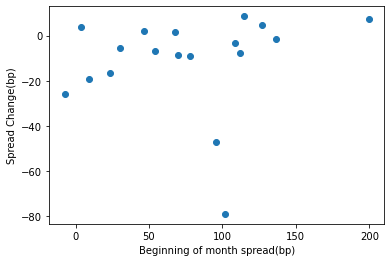

In [179]:
plt.scatter(alpha['begin'], alpha['change'])
plt.xlabel('Beginning of month spread(bp)')
plt.ylabel('Spread Change(bp)')

In [146]:
jan112 = pd.read_csv('2010-01_begin.csv')

Text(0, 0.5, 'Spread Change(bp)')

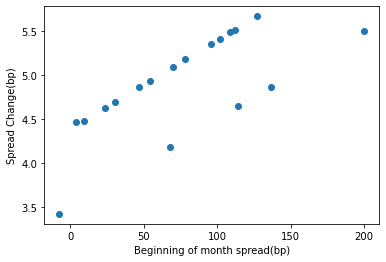

In [147]:
plt.scatter(jan112.spread, jan['만기수익률'])
plt.xlabel('Beginning of month spread(bp)')
plt.ylabel('Spread Change(bp)')

# Regression Estimates of Various Models of Spread Change - Financials
## (Exhibit 6)

#### parallel, relative, combined, combined(normalized)

In [3]:
jan2010 = pd.read_csv('exhibit6.csv')

In [4]:
jan2010

,Unnamed: 0,code,date,duration,만기수익률,시가총액백만원
0,27688,A003540,2010-01-04,2.060201,5.480000,1133021.0
1,49905,A010460,2010-01-04,1.227313,6.095000,199990.0
2,51189,A012420,2010-01-04,1.158438,6.570000,100820.0
3,51495,A012630,2010-01-04,0.946296,5.497948,2845753.0
4,43089,A006800,2010-01-04,2.436510,5.511667,3982782.0
...,...,...,...,...,...,...
106301,3108,A000060,2020-08-31,2.539935,2.663987,2029188.0
106302,89870,A085620,2020-08-31,3.230908,4.081800,731962.0
106303,1392,A000030,2020-08-31,2.141388,1.250855,10004800.0
106304,13715,A001450,2020-08-31,3.257172,3.261705,2409330.0


In [4]:
jan2010 = jan2010.sort_values(by = 'date', na_position='first')

In [5]:
jan2010 = jan2010.dropna(subset=['시가총액백만원'])

In [6]:
len(jan2010['code'].unique())

65

In [7]:
jan2010['date'] = pd.to_datetime(jan2010['date'])

In [8]:
real = []

In [9]:
for i in notebook.tqdm(range(len(jan2010.index))):
    if (jan2010.iloc[i]['date'].year == 2010) & (jan2010.iloc[i]['date'].month == 1):
        real.append(jan2010.iloc[i])
    

In [10]:
real = pd.DataFrame(real)

In [11]:
del real['Unnamed: 0']

In [12]:
real

,code,date,duration,만기수익률,시가총액백만원
0,A003540,2010-01-04,2.060201,5.480000,1133021.0
20,A053000,2010-01-04,2.038976,4.931360,11163312.0
21,A105560,2010-01-04,1.611738,4.860000,23065196.0
22,A033660,2010-01-04,1.486668,6.142877,359788.0
23,A005940,2010-01-04,1.945043,5.174545,2232379.0
...,...,...,...,...,...
695,A007800,2010-01-29,1.542057,10.488000,74265.0
696,A000540,2010-01-29,2.085028,7.079390,367688.0
697,A016420,2010-01-29,4.104376,7.250000,578564.0
698,A037620,2010-01-29,2.647977,4.272600,2387857.0


In [13]:
real.to_csv('10janfin.csv')

In [14]:
len(real['code'].unique())

36

In [15]:
tr10 = treasury(2010)

In [16]:
tr10

,MATURITY3,MATURITY6,MATURITY9,MATURITY12,MATURITY18,MATURITY24,MATURITY30,MATURITY36,MATURITY48,MATURITY60,MATURITY84,MATURITY120
2010-01-01,2.382888,2.931257,3.290925,3.480890,3.944698,4.372284,4.398276,4.405065,4.675712,4.946358,5.208173,5.469988
2010-01-02,2.382888,2.931257,3.290925,3.480890,3.944698,4.372284,4.398276,4.405065,4.675712,4.946358,5.208173,5.469988
2010-01-03,2.382888,2.931257,3.290925,3.480890,3.944698,4.372284,4.398276,4.405065,4.675712,4.946358,5.208173,5.469988
2010-01-04,2.372947,2.941264,3.310926,3.500860,3.974802,4.392087,4.428482,4.435186,4.722179,5.009172,5.258717,5.508261
2010-01-05,2.333182,2.881585,3.231250,3.421237,3.874874,4.292117,4.328684,4.356532,4.643126,4.929719,5.178754,5.427788
...,...,...,...,...,...,...,...,...,...,...,...,...
2010-12-27,2.512095,2.651657,2.791546,2.871548,3.173788,3.335282,3.343736,3.342454,3.723466,4.104478,4.342573,4.580668
2010-12-28,2.522032,2.661593,2.801481,2.881483,3.183729,3.355431,3.363824,3.362500,3.743594,4.124688,4.362833,4.600978
2010-12-29,2.531969,2.661560,2.801458,2.881465,3.173608,3.345344,3.374346,3.372921,3.737885,4.102849,4.341296,4.579743
2010-12-30,2.531969,2.661560,2.801458,2.881465,3.183716,3.365627,3.404840,3.372167,3.742600,4.113032,4.345673,4.578314


In [17]:
def finpivo(fin, trea):
   
    piv = pd.pivot_table(fin, values = ['duration', '만기수익률', '시가총액백만원'], index = ['code', 'date'])
    piv.drop(index = piv[piv['시가총액백만원'].isna() == True].index, inplace = True) #항상 결측치 관리에 유의하자 
    piv.drop(index = piv[piv['만기수익률'].isna() == True].index, inplace = True)
    piv.drop(index = piv[piv['duration'].isna() == True].index, inplace = True)
    
    mat = []
    tn = []
    wgt = []
    
    total = sum(piv['시가총액백만원'].unique())
    
    for i in notebook.tqdm(range(len(piv.index))):
        
        duration = piv["duration"].loc[piv.index[i]]
        price = piv['시가총액백만원'].loc[piv.index[i]]
    
        if round(float(duration), 3) <= 0.375:
            duration = 3
        
        elif round(float(duration), 3) <= 0.625:
            duration = 6
        
        elif round(float(duration), 2) <= 0.875:
            duration = 9
            
        elif round(float(duration), 2) <= 1.25:
            duration = 12
        
        elif round(float(duration), 2) <= 1.75:
            duration = 18 
            
        elif round(float(duration), 2) <= 2.25:
            duration = 24
            
        elif round(float(duration), 2) <= 2.75:
            duration = 30
            
        elif round(float(duration), 1) <= 3.5:
            duration = 36
            
        elif round(float(duration), 1) <= 4.5:
            duration = 48
            
        elif round(float(duration), 1) <= 6.5:
            duration = 60
            
        elif round(float(duration), 2) <= 8.5:
            duration = 84
            
        elif round(float(duration), 2) >= 10:
            duration = 120
            
        else:
            duration = round(float(duration))*12 #나머진 전부 개월로 변환
        
        mat.append(duration)
        wgt.append(price/total)
    
        try:
            tn.append(trea.loc[piv.index[i][-1]]['MATURITY'+str(duration)])
        
        except Exception:
            tn.append(np.nan)
            
    piv['zcb maturity'] = mat
    piv['spread'] = piv['만기수익률']-tn
    piv['weight'] = wgt
    
    return piv  

In [18]:
ex6 = finpivo(real, tr10)

In [34]:
len(real[real['code'] == 'A003450'])

20

In [19]:
ex6[ex6['spread'].isna() == True]

,,duration,만기수익률,시가총액백만원,zcb maturity,spread,weight
code,date,,,,,,


In [20]:
ex6['weighted'] = ex6['spread']*ex6['weight']*100

In [21]:
ex6

duration     만기수익률     시가총액백만원  zcb maturity    spread  \
code    date                                                                 
A000370 2010-01-04  1.201270  7.490000    526380.0            12  3.989139   
        2010-01-05  1.198817  7.410000    526380.0            12  3.988763   
        2010-01-06  1.196023  7.440000    526380.0            12  3.988860   
        2010-01-07  1.193566  7.360000    526380.0            12  3.988637   
        2010-01-08  1.190953  7.330000    526380.0            12  3.968612   
...                      ...       ...         ...           ...       ...   
A105560 2010-01-25  1.556062  4.494375  23065196.0            18  0.839582   
        2010-01-26  1.553610  4.436875  23065196.0            18  0.842471   
        2010-01-27  1.550813  4.447500  23065196.0            18  0.843111   
        2010-01-28  1.547808  4.498750  23065196.0            18  0.854205   
        2010-01-29  1.545361  4.438125  23065196.0            18  0.833675   

                      weight   weighted  
code    date                             
A000370 2010-01-04  0.004741   1.891244  
        2010-01-05  0.004741   1.891065  
        2010-01-06  0.004741   1.891111  
        2010-01-07  0.004741   1.891006  
        2010-01-08  0.004741   1.881512  
...                      ...        ...  
A105560 2010-01-25  0.207743  17.441717  
        2010-01-26  0.207743  17.501724  
        2010-01-27  0.207743  17.515020  
        2010-01-28  0.207743  17.745489  
        2010-01-29  0.207743  17.319000  

[720 rows x 7 columns]

In [22]:
ex6[ex6['spread'].isna() == True]

,,duration,만기수익률,시가총액백만원,zcb maturity,spread,weight,weighted
code,date,,,,,,,


In [23]:
ex6.to_csv('ex6piv.csv')

In [3]:
ex61 = pd.read_csv('ex6piv.csv')

In [25]:
ex61

,code,date,duration,만기수익률,시가총액백만원,zcb maturity,spread,weight,weighted
0,A000370,2010-01-04,1.201270,7.490000,526380.0,12,3.989139,0.004741,1.891244
1,A000370,2010-01-05,1.198818,7.410000,526380.0,12,3.988763,0.004741,1.891065
2,A000370,2010-01-06,1.196023,7.440000,526380.0,12,3.988860,0.004741,1.891111
3,A000370,2010-01-07,1.193566,7.360000,526380.0,12,3.988637,0.004741,1.891006
4,A000370,2010-01-08,1.190953,7.330000,526380.0,12,3.968612,0.004741,1.881512
...,...,...,...,...,...,...,...,...,...
715,A105560,2010-01-25,1.556062,4.494375,23065196.0,18,0.839582,0.207743,17.441717
716,A105560,2010-01-26,1.553610,4.436875,23065196.0,18,0.842471,0.207743,17.501724
717,A105560,2010-01-27,1.550813,4.447500,23065196.0,18,0.843111,0.207743,17.515020
718,A105560,2010-01-28,1.547808,4.498750,23065196.0,18,0.854205,0.207743,17.745489


In [27]:
avg = pd.DataFrame(index=ex61['date'].unique(), columns=['average'])

In [28]:
avg

,average
2010-01-04,NaN
2010-01-05,NaN
2010-01-06,NaN
2010-01-07,NaN
2010-01-08,NaN
2010-01-11,NaN
2010-01-12,NaN
2010-01-13,NaN
2010-01-14,NaN
2010-01-15,NaN


In [44]:
ex61['date'] = pd.to_datetime(ex61['date'])

In [29]:
for idx in notebook.tqdm(range(len(avg.index))):
    
    hap = 0
    
    for i in notebook.tqdm(range(len(ex61.index))):
        if avg.index[idx] == ex61['date'][i]:
            hap = hap + ex61['weighted'][i]
        
    avg['average'][idx] = hap

In [30]:
avg

,average
2010-01-04,89.158
2010-01-05,90.6472
2010-01-06,87.7177
2010-01-07,89.9952
2010-01-08,88.9881
2010-01-11,89.6152
2010-01-12,89.1744
2010-01-13,88.6394
2010-01-14,87.4984
2010-01-15,86.8315


In [33]:
for i in notebook.tqdm(range(len(ex61.index))):
    for j in notebook.tqdm(range(len(avg.index))):
        if ex61['date'].iloc[i] == avg.index[j]:
            ex61['average'].iloc[i] = avg['average'].iloc[j]

C:\Users\belig\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [34]:
ex61

,code,date,duration,만기수익률,시가총액백만원,zcb maturity,spread,weight,weighted,average
0,A000370,2010-01-04,1.201270,7.490000,526380.0,12,3.989139,0.004741,1.891244,89.158050
1,A000370,2010-01-05,1.198818,7.410000,526380.0,12,3.988763,0.004741,1.891065,90.647153
2,A000370,2010-01-06,1.196023,7.440000,526380.0,12,3.988860,0.004741,1.891111,87.717680
3,A000370,2010-01-07,1.193566,7.360000,526380.0,12,3.988637,0.004741,1.891006,89.995205
4,A000370,2010-01-08,1.190953,7.330000,526380.0,12,3.968612,0.004741,1.881512,88.988144
...,...,...,...,...,...,...,...,...,...,...
715,A105560,2010-01-25,1.556062,4.494375,23065196.0,18,0.839582,0.207743,17.441717,93.956311
716,A105560,2010-01-26,1.553610,4.436875,23065196.0,18,0.842471,0.207743,17.501724,94.809414
717,A105560,2010-01-27,1.550813,4.447500,23065196.0,18,0.843111,0.207743,17.515020,94.959811
718,A105560,2010-01-28,1.547808,4.498750,23065196.0,18,0.854205,0.207743,17.745489,94.427067


## linear regression

In [2]:
ex61.to_csv('raw_fin1001.csv')

NameError: name 'ex61' is not defined

In [3]:
ex61 = pd.read_csv('raw_fin1001.csv')

In [4]:
del ex61['Unnamed: 0']

In [5]:
ex61

,code,date,duration,만기수익률,시가총액백만원,zcb maturity,spread,weight,weighted,average
0,A000370,2010-01-04,1.201270,7.490000,526380.0,12,3.989139,0.004741,1.891244,89.158050
1,A000370,2010-01-05,1.198817,7.410000,526380.0,12,3.988763,0.004741,1.891065,90.647153
2,A000370,2010-01-06,1.196023,7.440000,526380.0,12,3.988860,0.004741,1.891111,87.717680
3,A000370,2010-01-07,1.193566,7.360000,526380.0,12,3.988637,0.004741,1.891006,89.995205
4,A000370,2010-01-08,1.190953,7.330000,526380.0,12,3.968612,0.004741,1.881512,88.988144
...,...,...,...,...,...,...,...,...,...,...
715,A105560,2010-01-25,1.556062,4.494375,23065196.0,18,0.839582,0.207743,17.441717,93.956311
716,A105560,2010-01-26,1.553610,4.436875,23065196.0,18,0.842471,0.207743,17.501724,94.809414
717,A105560,2010-01-27,1.550813,4.447500,23065196.0,18,0.843111,0.207743,17.515020,94.959811
718,A105560,2010-01-28,1.547808,4.498750,23065196.0,18,0.854205,0.207743,17.745489,94.427067


In [7]:
for i in ex61['code'].unique():
    print(i)

A000370
A000470
A000540
A000610
A001200
A001800
A003450
A003470
A003530
A003540
A004800
A004940
A005270
A005280
A005940
A006350
A006800
A007800
A010050
A010460
A012420
A012630
A016420
A016610
A019550
A021960
A025610
A029780
A033660
A034830
A037620
A053000
A055550
A071050
A086790
A105560


In [ ]:
def finols(sheet):
    ##각 종목별로
    for code in sheet['code'].unique():
        
        

In [36]:
res = ols('spread ~ average', data=ex61).fit()

In [37]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spread   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.08605
Date:                Mon, 30 Aug 2021   Prob (F-statistic):              0.769
Time:                        17:21:27   Log-Likelihood:                -1499.4
No. Observations:                 720   AIC:                             3003.
Df Residuals:                     718   BIC:                             3012.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.4396      2.418      0.595      0.552      -3.308       6.187
average        0.0078      0.027      0.293      0.769      -0.045       0.060
==============================================================================
Omnibus:                      212.575   Durbin-Watson:                   0.096
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              501.746
Skew:                           1.568   Prob(JB):                    1.11e-109
Kurtosis:                       5.625   Cond. No.                     3.02e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.02e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0, 0.5, 'Spread slope(%)')

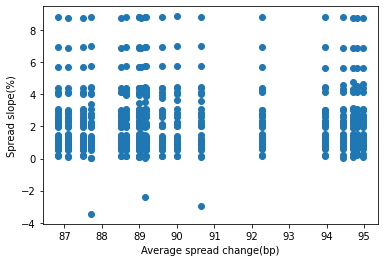

In [15]:
plt.scatter(ex61.average, ex61.spread)
plt.xlabel('Average spread change(bp)')
plt.ylabel('Spread slope(%)')